# Bengali.AI SEResNeXt training with pytorch

I will introduce following contents

 - **Fast data loading** with feather format
 - **Data augmentation** technic with affine transformation
 - **CNN SoTA models**: Use pytorch `pretrainedmodels` library, especially I use **`SEResNeXt`** in this notebook
 - **Training code abstraction**: Use `pytorch-ignite` module for the trainining abstraction
 
### Update history

 - 2020/1/4 v2: Added albumentations augmentations introduced in [Bengali: albumentations data augmentation tutorial](https://www.kaggle.com/corochann/bengali-albumentations-data-augmentation-tutorial)

# Table of Contents:
**[Fast data loading with feather](#load)**<br>
**[Dataset](#dataset)**<br>
**[Data augmentation/processing](#processing)**<br>
**[pytorch model & define classifier](#model)**<br>
**[Training code](#train)**<br>
**[Prediction](#pred)**<br>
**[Reference and further reading](#ref)**<br>

To install https://github.com/Cadene/pretrained-models.pytorch without internet connection, we can install library as "dataset".

It is uploaded by @rishabhiitbhu : https://www.kaggle.com/rishabhiitbhu/pretrainedmodels

In [1]:
#!pip install ../input/pretrainedmodels/pretrainedmodels-0.7.4/ > /dev/null # no output
!python -m pip install ../input/pretrainedmodels/pretrainedmodels-0.7.4/pretrainedmodels-0.7.4/ > /dev/null --user 

In [2]:
import gc
import os
from pathlib import Path
import random
import sys

from tqdm.notebook import tqdm
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import matplotlib.pyplot as plt
import seaborn as sns

from IPython.core.display import display, HTML

# --- plotly ---
from plotly import tools, subplots
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.express as px
import plotly.figure_factory as ff

# --- models ---
from sklearn import preprocessing
from sklearn.model_selection import KFold
# import lightgbm as lgb
# import xgboost as xgb
# import catboost as cb

# --- setup ---
pd.set_option('max_columns', 50)

In [3]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('../input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# Any results you write to the current directory are saved as output.

../input/pretrainedmodels.zip
../input/bengaliaicv19feather/test_image_data_2.feather
../input/bengaliaicv19feather/train_image_data_0.feather
../input/bengaliaicv19feather/test_image_data_3.feather
../input/bengaliaicv19feather/train_image_data_2.feather
../input/bengaliaicv19feather/train_image_data_3.feather
../input/bengaliaicv19feather/test_image_data_0.feather
../input/bengaliaicv19feather/test_image_data_1.feather
../input/bengaliaicv19feather/train_image_data_1.feather
../input/pretrainedmodels/pretrainedmodels-0.7.4/setup.cfg
../input/pretrainedmodels/pretrainedmodels-0.7.4/setup.py
../input/pretrainedmodels/pretrainedmodels-0.7.4/PKG-INFO
../input/pretrainedmodels/pretrainedmodels-0.7.4/README.md
../input/pretrainedmodels/pretrainedmodels-0.7.4/pretrainedmodels.egg-info/PKG-INFO
../input/pretrainedmodels/pretrainedmodels-0.7.4/pretrainedmodels.egg-info/SOURCES.txt
../input/pretrainedmodels/pretrainedmodels-0.7.4/pretrainedmodels.egg-info/requires.txt
../input/pretrainedmodels

../input/grapheme-imgs-128x128/Train_109612.png
../input/grapheme-imgs-128x128/Train_133905.png
../input/grapheme-imgs-128x128/Train_107140.png
../input/grapheme-imgs-128x128/Train_12211.png
../input/grapheme-imgs-128x128/Train_160265.png
../input/grapheme-imgs-128x128/Train_75348.png
../input/grapheme-imgs-128x128/Train_37216.png
../input/grapheme-imgs-128x128/Train_1958.png
../input/grapheme-imgs-128x128/Train_41525.png
../input/grapheme-imgs-128x128/Train_108648.png
../input/grapheme-imgs-128x128/Train_100616.png
../input/grapheme-imgs-128x128/Train_154140.png
../input/grapheme-imgs-128x128/Train_120085.png
../input/grapheme-imgs-128x128/Train_116967.png
../input/grapheme-imgs-128x128/Train_28022.png
../input/grapheme-imgs-128x128/Train_131191.png
../input/grapheme-imgs-128x128/Train_81130.png
../input/grapheme-imgs-128x128/Train_80772.png
../input/grapheme-imgs-128x128/Train_120464.png
../input/grapheme-imgs-128x128/Train_53652.png
../input/grapheme-imgs-128x128/Train_176066.png
..

../input/grapheme-imgs-128x128/Train_170128.png
../input/grapheme-imgs-128x128/Train_30942.png
../input/grapheme-imgs-128x128/Train_31686.png
../input/grapheme-imgs-128x128/Train_37475.png
../input/grapheme-imgs-128x128/Train_178293.png
../input/grapheme-imgs-128x128/Train_163464.png
../input/grapheme-imgs-128x128/Train_130284.png
../input/grapheme-imgs-128x128/Train_64122.png
../input/grapheme-imgs-128x128/Train_84941.png
../input/grapheme-imgs-128x128/Train_109712.png
../input/grapheme-imgs-128x128/Train_35674.png
../input/grapheme-imgs-128x128/Train_160943.png
../input/grapheme-imgs-128x128/Train_5243.png
../input/grapheme-imgs-128x128/Train_156842.png
../input/grapheme-imgs-128x128/Train_127092.png
../input/grapheme-imgs-128x128/Train_14968.png
../input/grapheme-imgs-128x128/Train_58532.png
../input/grapheme-imgs-128x128/Train_17966.png
../input/grapheme-imgs-128x128/Train_185493.png
../input/grapheme-imgs-128x128/Train_69058.png
../input/grapheme-imgs-128x128/Train_133150.png
../i

../input/grapheme-imgs-128x128/Train_40937.png
../input/grapheme-imgs-128x128/Train_119982.png
../input/grapheme-imgs-128x128/Train_105546.png
../input/grapheme-imgs-128x128/Train_18837.png
../input/grapheme-imgs-128x128/Train_36876.png
../input/grapheme-imgs-128x128/Train_9874.png
../input/grapheme-imgs-128x128/Train_196599.png
../input/grapheme-imgs-128x128/Train_162800.png
../input/grapheme-imgs-128x128/Train_122886.png
../input/grapheme-imgs-128x128/Train_62764.png
../input/grapheme-imgs-128x128/Train_195685.png
../input/grapheme-imgs-128x128/Train_23811.png
../input/grapheme-imgs-128x128/Train_51405.png
../input/grapheme-imgs-128x128/Train_155068.png
../input/grapheme-imgs-128x128/Train_116647.png
../input/grapheme-imgs-128x128/Train_145670.png
../input/grapheme-imgs-128x128/Train_178866.png
../input/grapheme-imgs-128x128/Train_14509.png
../input/grapheme-imgs-128x128/Train_156379.png
../input/grapheme-imgs-128x128/Train_142731.png
../input/grapheme-imgs-128x128/Train_47039.png
..

../input/grapheme-imgs-128x128/Train_51426.png
../input/grapheme-imgs-128x128/Train_48752.png
../input/grapheme-imgs-128x128/Train_151012.png
../input/grapheme-imgs-128x128/Train_13822.png
../input/grapheme-imgs-128x128/Train_158496.png
../input/grapheme-imgs-128x128/Train_120283.png
../input/grapheme-imgs-128x128/Train_196009.png
../input/grapheme-imgs-128x128/Train_157263.png
../input/grapheme-imgs-128x128/Train_75701.png
../input/grapheme-imgs-128x128/Train_137827.png
../input/grapheme-imgs-128x128/Train_171446.png
../input/grapheme-imgs-128x128/Train_34362.png
../input/grapheme-imgs-128x128/Train_88325.png
../input/grapheme-imgs-128x128/Train_114077.png
../input/grapheme-imgs-128x128/Train_32711.png
../input/grapheme-imgs-128x128/Train_108391.png
../input/grapheme-imgs-128x128/Train_109126.png
../input/grapheme-imgs-128x128/Train_193182.png
../input/grapheme-imgs-128x128/Train_186574.png
../input/grapheme-imgs-128x128/Train_17693.png
../input/grapheme-imgs-128x128/Train_31850.png
.

../input/grapheme-imgs-128x128/Train_10557.png
../input/grapheme-imgs-128x128/Train_148605.png
../input/grapheme-imgs-128x128/Train_149480.png
../input/grapheme-imgs-128x128/Train_3374.png
../input/grapheme-imgs-128x128/Train_151288.png
../input/grapheme-imgs-128x128/Train_160952.png
../input/grapheme-imgs-128x128/Train_182270.png
../input/grapheme-imgs-128x128/Train_40020.png
../input/grapheme-imgs-128x128/Train_82364.png
../input/grapheme-imgs-128x128/Train_1581.png
../input/grapheme-imgs-128x128/Train_122726.png
../input/grapheme-imgs-128x128/Train_89824.png
../input/grapheme-imgs-128x128/Train_113691.png
../input/grapheme-imgs-128x128/Train_146944.png
../input/grapheme-imgs-128x128/Train_174130.png
../input/grapheme-imgs-128x128/Train_154646.png
../input/grapheme-imgs-128x128/Train_126478.png
../input/grapheme-imgs-128x128/Train_52897.png
../input/grapheme-imgs-128x128/Train_15645.png
../input/grapheme-imgs-128x128/Train_171743.png
../input/grapheme-imgs-128x128/Train_53118.png
../

../input/grapheme-imgs-128x128/Train_83700.png
../input/grapheme-imgs-128x128/Train_193125.png
../input/grapheme-imgs-128x128/Train_168399.png
../input/grapheme-imgs-128x128/Train_92416.png
../input/grapheme-imgs-128x128/Train_153096.png
../input/grapheme-imgs-128x128/Train_41085.png
../input/grapheme-imgs-128x128/Train_150107.png
../input/grapheme-imgs-128x128/Train_23824.png
../input/grapheme-imgs-128x128/Train_104862.png
../input/grapheme-imgs-128x128/Train_96517.png
../input/grapheme-imgs-128x128/Train_59853.png
../input/grapheme-imgs-128x128/Train_165595.png
../input/grapheme-imgs-128x128/Train_122949.png
../input/grapheme-imgs-128x128/Train_70411.png
../input/grapheme-imgs-128x128/Train_75592.png
../input/grapheme-imgs-128x128/Train_56005.png
../input/grapheme-imgs-128x128/Train_2531.png
../input/grapheme-imgs-128x128/Train_24842.png
../input/grapheme-imgs-128x128/Train_197480.png
../input/grapheme-imgs-128x128/Train_145094.png
../input/grapheme-imgs-128x128/Train_107750.png
../i

../input/grapheme-imgs-128x128/Train_94351.png
../input/grapheme-imgs-128x128/Train_54279.png
../input/grapheme-imgs-128x128/Train_52320.png
../input/grapheme-imgs-128x128/Train_112857.png
../input/grapheme-imgs-128x128/Train_172821.png
../input/grapheme-imgs-128x128/Train_152920.png
../input/grapheme-imgs-128x128/Train_72277.png
../input/grapheme-imgs-128x128/Train_72640.png
../input/grapheme-imgs-128x128/Train_61276.png
../input/grapheme-imgs-128x128/Train_120877.png
../input/grapheme-imgs-128x128/Train_152675.png
../input/grapheme-imgs-128x128/Train_15258.png
../input/grapheme-imgs-128x128/Train_22124.png
../input/grapheme-imgs-128x128/Train_91976.png
../input/grapheme-imgs-128x128/Train_186333.png
../input/grapheme-imgs-128x128/Train_91825.png
../input/grapheme-imgs-128x128/Train_117168.png
../input/grapheme-imgs-128x128/Train_28239.png
../input/grapheme-imgs-128x128/Train_167668.png
../input/grapheme-imgs-128x128/Train_142517.png
../input/grapheme-imgs-128x128/Train_9876.png
../in

../input/grapheme-imgs-128x128/Train_132709.png
../input/grapheme-imgs-128x128/Train_53335.png
../input/grapheme-imgs-128x128/Train_104589.png
../input/grapheme-imgs-128x128/Train_154079.png
../input/grapheme-imgs-128x128/Train_133057.png
../input/grapheme-imgs-128x128/Train_58288.png
../input/grapheme-imgs-128x128/Train_97965.png
../input/grapheme-imgs-128x128/Train_103584.png
../input/grapheme-imgs-128x128/Train_98472.png
../input/grapheme-imgs-128x128/Train_7024.png
../input/grapheme-imgs-128x128/Train_118156.png
../input/grapheme-imgs-128x128/Train_191784.png
../input/grapheme-imgs-128x128/Train_76741.png
../input/grapheme-imgs-128x128/Train_103074.png
../input/grapheme-imgs-128x128/Train_83035.png
../input/grapheme-imgs-128x128/Train_14093.png
../input/grapheme-imgs-128x128/Train_27390.png
../input/grapheme-imgs-128x128/Train_94209.png
../input/grapheme-imgs-128x128/Train_18451.png
../input/grapheme-imgs-128x128/Train_155931.png
../input/grapheme-imgs-128x128/Train_49942.png
../in

../input/grapheme-imgs-128x128/Train_73658.png
../input/grapheme-imgs-128x128/Train_145952.png
../input/grapheme-imgs-128x128/Train_144335.png
../input/grapheme-imgs-128x128/Train_77149.png
../input/grapheme-imgs-128x128/Train_22992.png
../input/grapheme-imgs-128x128/Train_13648.png
../input/grapheme-imgs-128x128/Train_68204.png
../input/grapheme-imgs-128x128/Train_168665.png
../input/grapheme-imgs-128x128/Train_171708.png
../input/grapheme-imgs-128x128/Train_782.png
../input/grapheme-imgs-128x128/Train_173378.png
../input/grapheme-imgs-128x128/Train_59668.png
../input/grapheme-imgs-128x128/Train_110233.png
../input/grapheme-imgs-128x128/Train_60713.png
../input/grapheme-imgs-128x128/Train_17360.png
../input/grapheme-imgs-128x128/Train_3362.png
../input/grapheme-imgs-128x128/Train_30796.png
../input/grapheme-imgs-128x128/Train_60369.png
../input/grapheme-imgs-128x128/Train_122583.png
../input/grapheme-imgs-128x128/Train_96897.png
../input/grapheme-imgs-128x128/Train_170280.png
../input

../input/grapheme-imgs-128x128/Train_103673.png
../input/grapheme-imgs-128x128/Train_41170.png
../input/grapheme-imgs-128x128/Train_99065.png
../input/grapheme-imgs-128x128/Train_75853.png
../input/grapheme-imgs-128x128/Train_130603.png
../input/grapheme-imgs-128x128/Train_33528.png
../input/grapheme-imgs-128x128/Train_173947.png
../input/grapheme-imgs-128x128/Train_83712.png
../input/grapheme-imgs-128x128/Train_98773.png
../input/grapheme-imgs-128x128/Train_37747.png
../input/grapheme-imgs-128x128/Train_66602.png
../input/grapheme-imgs-128x128/Train_159354.png
../input/grapheme-imgs-128x128/Train_64523.png
../input/grapheme-imgs-128x128/Train_190198.png
../input/grapheme-imgs-128x128/Train_32290.png
../input/grapheme-imgs-128x128/Train_137567.png
../input/grapheme-imgs-128x128/Train_38748.png
../input/grapheme-imgs-128x128/Train_70908.png
../input/grapheme-imgs-128x128/Train_156965.png
../input/grapheme-imgs-128x128/Train_124959.png
../input/grapheme-imgs-128x128/Train_117784.png
../i

../input/grapheme-imgs-128x128/Train_62485.png
../input/grapheme-imgs-128x128/Train_183827.png
../input/grapheme-imgs-128x128/Train_133193.png
../input/grapheme-imgs-128x128/Train_16964.png
../input/grapheme-imgs-128x128/Train_131929.png
../input/grapheme-imgs-128x128/Train_190579.png
../input/grapheme-imgs-128x128/Train_185788.png
../input/grapheme-imgs-128x128/Train_58637.png
../input/grapheme-imgs-128x128/Train_86542.png
../input/grapheme-imgs-128x128/Train_87216.png
../input/grapheme-imgs-128x128/Train_98606.png
../input/grapheme-imgs-128x128/Train_61767.png
../input/grapheme-imgs-128x128/Train_139646.png
../input/grapheme-imgs-128x128/Train_147679.png
../input/grapheme-imgs-128x128/Train_27678.png
../input/grapheme-imgs-128x128/Train_168334.png
../input/grapheme-imgs-128x128/Train_84139.png
../input/grapheme-imgs-128x128/Train_174411.png
../input/grapheme-imgs-128x128/Train_105557.png
../input/grapheme-imgs-128x128/Train_82123.png
../input/grapheme-imgs-128x128/Train_89888.png
../

../input/grapheme-imgs-128x128/Train_155243.png
../input/grapheme-imgs-128x128/Train_774.png
../input/grapheme-imgs-128x128/Train_52047.png
../input/grapheme-imgs-128x128/Train_2194.png
../input/grapheme-imgs-128x128/Train_179375.png
../input/grapheme-imgs-128x128/Train_35101.png
../input/grapheme-imgs-128x128/Train_24162.png
../input/grapheme-imgs-128x128/Train_151687.png
../input/grapheme-imgs-128x128/Train_30567.png
../input/grapheme-imgs-128x128/Train_107435.png
../input/grapheme-imgs-128x128/Train_125657.png
../input/grapheme-imgs-128x128/Train_10772.png
../input/grapheme-imgs-128x128/Train_135387.png
../input/grapheme-imgs-128x128/Train_117259.png
../input/grapheme-imgs-128x128/Train_55198.png
../input/grapheme-imgs-128x128/Train_115651.png
../input/grapheme-imgs-128x128/Train_196530.png
../input/grapheme-imgs-128x128/Train_17005.png
../input/grapheme-imgs-128x128/Train_50037.png
../input/grapheme-imgs-128x128/Train_137237.png
../input/grapheme-imgs-128x128/Train_156.png
../input

../input/grapheme-imgs-128x128/Train_164051.png
../input/grapheme-imgs-128x128/Train_169970.png
../input/grapheme-imgs-128x128/Train_19201.png
../input/grapheme-imgs-128x128/Train_96421.png
../input/grapheme-imgs-128x128/Train_167409.png
../input/grapheme-imgs-128x128/Train_61121.png
../input/grapheme-imgs-128x128/Train_177245.png
../input/grapheme-imgs-128x128/Train_161723.png
../input/grapheme-imgs-128x128/Train_75709.png
../input/grapheme-imgs-128x128/Train_94835.png
../input/grapheme-imgs-128x128/Train_198554.png
../input/grapheme-imgs-128x128/Train_124184.png
../input/grapheme-imgs-128x128/Train_47223.png
../input/grapheme-imgs-128x128/Train_27384.png
../input/grapheme-imgs-128x128/Train_75520.png
../input/grapheme-imgs-128x128/Train_8334.png
../input/grapheme-imgs-128x128/Train_11152.png
../input/grapheme-imgs-128x128/Train_156856.png
../input/grapheme-imgs-128x128/Train_54085.png
../input/grapheme-imgs-128x128/Train_62158.png
../input/grapheme-imgs-128x128/Train_62885.png
../inp

../input/grapheme-imgs-128x128/Train_134815.png
../input/grapheme-imgs-128x128/Train_42369.png
../input/grapheme-imgs-128x128/Train_6647.png
../input/grapheme-imgs-128x128/Train_138764.png
../input/grapheme-imgs-128x128/Train_141668.png
../input/grapheme-imgs-128x128/Train_186645.png
../input/grapheme-imgs-128x128/Train_23891.png
../input/grapheme-imgs-128x128/Train_23520.png
../input/grapheme-imgs-128x128/Train_107921.png
../input/grapheme-imgs-128x128/Train_130830.png
../input/grapheme-imgs-128x128/Train_36122.png
../input/grapheme-imgs-128x128/Train_111335.png
../input/grapheme-imgs-128x128/Train_180058.png
../input/grapheme-imgs-128x128/Train_143586.png
../input/grapheme-imgs-128x128/Train_199749.png
../input/grapheme-imgs-128x128/Train_120955.png
../input/grapheme-imgs-128x128/Train_44062.png
../input/grapheme-imgs-128x128/Train_101113.png
../input/grapheme-imgs-128x128/Train_10724.png
../input/grapheme-imgs-128x128/Train_18769.png
../input/grapheme-imgs-128x128/Train_9302.png
../

../input/grapheme-imgs-128x128/Train_30242.png
../input/grapheme-imgs-128x128/Train_168016.png
../input/grapheme-imgs-128x128/Train_101992.png
../input/grapheme-imgs-128x128/Train_129007.png
../input/grapheme-imgs-128x128/Train_172610.png
../input/grapheme-imgs-128x128/Train_141724.png
../input/grapheme-imgs-128x128/Train_59238.png
../input/grapheme-imgs-128x128/Train_149072.png
../input/grapheme-imgs-128x128/Train_34996.png
../input/grapheme-imgs-128x128/Train_159914.png
../input/grapheme-imgs-128x128/Train_139120.png
../input/grapheme-imgs-128x128/Train_77815.png
../input/grapheme-imgs-128x128/Train_109633.png
../input/grapheme-imgs-128x128/Train_83863.png
../input/grapheme-imgs-128x128/Train_106571.png
../input/grapheme-imgs-128x128/Train_37356.png
../input/grapheme-imgs-128x128/Train_193026.png
../input/grapheme-imgs-128x128/Train_130985.png
../input/grapheme-imgs-128x128/Train_158595.png
../input/grapheme-imgs-128x128/Train_138337.png
../input/grapheme-imgs-128x128/Train_10594.png

../input/grapheme-imgs-128x128/Train_190155.png
../input/grapheme-imgs-128x128/Train_121142.png
../input/grapheme-imgs-128x128/Train_163947.png
../input/grapheme-imgs-128x128/Train_152807.png
../input/grapheme-imgs-128x128/Train_84205.png
../input/grapheme-imgs-128x128/Train_155337.png
../input/grapheme-imgs-128x128/Train_96439.png
../input/grapheme-imgs-128x128/Train_67130.png
../input/grapheme-imgs-128x128/Train_157380.png
../input/grapheme-imgs-128x128/Train_25507.png
../input/grapheme-imgs-128x128/Train_151765.png
../input/grapheme-imgs-128x128/Train_159298.png
../input/grapheme-imgs-128x128/Train_18502.png
../input/grapheme-imgs-128x128/Train_38651.png
../input/grapheme-imgs-128x128/Train_59471.png
../input/grapheme-imgs-128x128/Train_74666.png
../input/grapheme-imgs-128x128/Train_80646.png
../input/grapheme-imgs-128x128/Train_49452.png
../input/grapheme-imgs-128x128/Train_70252.png
../input/grapheme-imgs-128x128/Train_151498.png
../input/grapheme-imgs-128x128/Train_731.png
../inp

../input/grapheme-imgs-128x128/Train_87053.png
../input/grapheme-imgs-128x128/Train_8565.png
../input/grapheme-imgs-128x128/Train_101310.png
../input/grapheme-imgs-128x128/Train_198466.png
../input/grapheme-imgs-128x128/Train_64500.png
../input/grapheme-imgs-128x128/Train_18846.png
../input/grapheme-imgs-128x128/Train_83549.png
../input/grapheme-imgs-128x128/Train_111910.png
../input/grapheme-imgs-128x128/Train_34658.png
../input/grapheme-imgs-128x128/Train_66165.png
../input/grapheme-imgs-128x128/Train_129709.png
../input/grapheme-imgs-128x128/Train_61672.png
../input/grapheme-imgs-128x128/Train_115775.png
../input/grapheme-imgs-128x128/Train_40486.png
../input/grapheme-imgs-128x128/Train_198472.png
../input/grapheme-imgs-128x128/Train_190170.png
../input/grapheme-imgs-128x128/Train_184921.png
../input/grapheme-imgs-128x128/Train_100917.png
../input/grapheme-imgs-128x128/Train_120729.png
../input/grapheme-imgs-128x128/Train_129480.png
../input/grapheme-imgs-128x128/Train_111898.png
..

../input/grapheme-imgs-128x128/Train_144067.png
../input/grapheme-imgs-128x128/Train_71952.png
../input/grapheme-imgs-128x128/Train_84507.png
../input/grapheme-imgs-128x128/Train_122120.png
../input/grapheme-imgs-128x128/Train_16353.png
../input/grapheme-imgs-128x128/Train_95914.png
../input/grapheme-imgs-128x128/Train_50032.png
../input/grapheme-imgs-128x128/Train_42053.png
../input/grapheme-imgs-128x128/Train_85108.png
../input/grapheme-imgs-128x128/Train_59240.png
../input/grapheme-imgs-128x128/Train_94950.png
../input/grapheme-imgs-128x128/Train_186952.png
../input/grapheme-imgs-128x128/Train_77847.png
../input/grapheme-imgs-128x128/Train_167530.png
../input/grapheme-imgs-128x128/Train_195092.png
../input/grapheme-imgs-128x128/Train_119522.png
../input/grapheme-imgs-128x128/Train_94555.png
../input/grapheme-imgs-128x128/Train_198433.png
../input/grapheme-imgs-128x128/Train_64472.png
../input/grapheme-imgs-128x128/Train_116234.png
../input/grapheme-imgs-128x128/Train_54946.png
../in

../input/grapheme-imgs-128x128/Train_151839.png
../input/grapheme-imgs-128x128/Train_169107.png
../input/grapheme-imgs-128x128/Train_72252.png
../input/grapheme-imgs-128x128/Train_154549.png
../input/grapheme-imgs-128x128/Train_145223.png
../input/grapheme-imgs-128x128/Train_126364.png
../input/grapheme-imgs-128x128/Train_59389.png
../input/grapheme-imgs-128x128/Train_141074.png
../input/grapheme-imgs-128x128/Train_2102.png
../input/grapheme-imgs-128x128/Train_140439.png
../input/grapheme-imgs-128x128/Train_83620.png
../input/grapheme-imgs-128x128/Train_94387.png
../input/grapheme-imgs-128x128/Train_151854.png
../input/grapheme-imgs-128x128/Train_121601.png
../input/grapheme-imgs-128x128/Train_168835.png
../input/grapheme-imgs-128x128/Train_38262.png
../input/grapheme-imgs-128x128/Train_151570.png
../input/grapheme-imgs-128x128/Train_119342.png
../input/grapheme-imgs-128x128/Train_167353.png
../input/grapheme-imgs-128x128/Train_132259.png
../input/grapheme-imgs-128x128/Train_96550.png


../input/grapheme-imgs-128x128/Train_47969.png
../input/grapheme-imgs-128x128/Train_37007.png
../input/grapheme-imgs-128x128/Train_139715.png
../input/grapheme-imgs-128x128/Train_152111.png
../input/grapheme-imgs-128x128/Train_29929.png
../input/grapheme-imgs-128x128/Train_67922.png
../input/grapheme-imgs-128x128/Train_21304.png
../input/grapheme-imgs-128x128/Train_180570.png
../input/grapheme-imgs-128x128/Train_4851.png
../input/grapheme-imgs-128x128/Train_147522.png
../input/grapheme-imgs-128x128/Train_46791.png
../input/grapheme-imgs-128x128/Train_27907.png
../input/grapheme-imgs-128x128/Train_193642.png
../input/grapheme-imgs-128x128/Train_122326.png
../input/grapheme-imgs-128x128/Train_125568.png
../input/grapheme-imgs-128x128/Train_154510.png
../input/grapheme-imgs-128x128/Train_152220.png
../input/grapheme-imgs-128x128/Train_64613.png
../input/grapheme-imgs-128x128/Train_32648.png
../input/grapheme-imgs-128x128/Train_193116.png
../input/grapheme-imgs-128x128/Train_85482.png
../i

../input/grapheme-imgs-128x128/Train_48473.png
../input/grapheme-imgs-128x128/Train_107295.png
../input/grapheme-imgs-128x128/Train_35040.png
../input/grapheme-imgs-128x128/Train_139502.png
../input/grapheme-imgs-128x128/Train_27057.png
../input/grapheme-imgs-128x128/Train_182850.png
../input/grapheme-imgs-128x128/Train_9149.png
../input/grapheme-imgs-128x128/Train_95247.png
../input/grapheme-imgs-128x128/Train_135778.png
../input/grapheme-imgs-128x128/Train_174344.png
../input/grapheme-imgs-128x128/Train_200345.png
../input/grapheme-imgs-128x128/Train_102816.png
../input/grapheme-imgs-128x128/Train_119099.png
../input/grapheme-imgs-128x128/Train_131546.png
../input/grapheme-imgs-128x128/Train_23044.png
../input/grapheme-imgs-128x128/Train_199128.png
../input/grapheme-imgs-128x128/Train_115422.png
../input/grapheme-imgs-128x128/Train_160960.png
../input/grapheme-imgs-128x128/Train_56834.png
../input/grapheme-imgs-128x128/Train_70183.png
../input/grapheme-imgs-128x128/Train_178477.png
.

../input/grapheme-imgs-128x128/Train_91615.png
../input/grapheme-imgs-128x128/Train_116134.png
../input/grapheme-imgs-128x128/Train_180958.png
../input/grapheme-imgs-128x128/Train_62897.png
../input/grapheme-imgs-128x128/Train_24430.png
../input/grapheme-imgs-128x128/Train_154126.png
../input/grapheme-imgs-128x128/Train_35197.png
../input/grapheme-imgs-128x128/Train_44895.png
../input/grapheme-imgs-128x128/Train_160124.png
../input/grapheme-imgs-128x128/Train_173146.png
../input/grapheme-imgs-128x128/Train_5016.png
../input/grapheme-imgs-128x128/Train_45264.png
../input/grapheme-imgs-128x128/Train_116009.png
../input/grapheme-imgs-128x128/Train_63769.png
../input/grapheme-imgs-128x128/Train_70725.png
../input/grapheme-imgs-128x128/Train_185031.png
../input/grapheme-imgs-128x128/Train_2991.png
../input/grapheme-imgs-128x128/Train_181393.png
../input/grapheme-imgs-128x128/Train_41596.png
../input/grapheme-imgs-128x128/Train_196643.png
../input/grapheme-imgs-128x128/Train_42233.png
../inp

../input/grapheme-imgs-128x128/Train_63828.png
../input/grapheme-imgs-128x128/Train_130706.png
../input/grapheme-imgs-128x128/Train_199796.png
../input/grapheme-imgs-128x128/Train_187002.png
../input/grapheme-imgs-128x128/Train_85542.png
../input/grapheme-imgs-128x128/Train_157644.png
../input/grapheme-imgs-128x128/Train_132247.png
../input/grapheme-imgs-128x128/Train_117229.png
../input/grapheme-imgs-128x128/Train_119136.png
../input/grapheme-imgs-128x128/Train_129118.png
../input/grapheme-imgs-128x128/Train_198896.png
../input/grapheme-imgs-128x128/Train_96698.png
../input/grapheme-imgs-128x128/Train_192953.png
../input/grapheme-imgs-128x128/Train_8623.png
../input/grapheme-imgs-128x128/Train_154165.png
../input/grapheme-imgs-128x128/Train_95131.png
../input/grapheme-imgs-128x128/Train_25638.png
../input/grapheme-imgs-128x128/Train_24515.png
../input/grapheme-imgs-128x128/Train_112341.png
../input/grapheme-imgs-128x128/Train_197263.png
../input/grapheme-imgs-128x128/Train_123473.png


../input/grapheme-imgs-128x128/Train_94245.png
../input/grapheme-imgs-128x128/Train_151292.png
../input/grapheme-imgs-128x128/Train_21274.png
../input/grapheme-imgs-128x128/Train_104903.png
../input/grapheme-imgs-128x128/Train_75447.png
../input/grapheme-imgs-128x128/Train_4912.png
../input/grapheme-imgs-128x128/Train_68337.png
../input/grapheme-imgs-128x128/Train_97521.png
../input/grapheme-imgs-128x128/Train_120788.png
../input/grapheme-imgs-128x128/Train_126293.png
../input/grapheme-imgs-128x128/Train_74272.png
../input/grapheme-imgs-128x128/Train_146394.png
../input/grapheme-imgs-128x128/Train_179845.png
../input/grapheme-imgs-128x128/Train_133771.png
../input/grapheme-imgs-128x128/Train_128870.png
../input/grapheme-imgs-128x128/Train_51105.png
../input/grapheme-imgs-128x128/Train_36584.png
../input/grapheme-imgs-128x128/Train_185083.png
../input/grapheme-imgs-128x128/Train_188513.png
../input/grapheme-imgs-128x128/Train_107664.png
../input/grapheme-imgs-128x128/Train_116208.png
..

../input/grapheme-imgs-128x128/Train_72869.png
../input/grapheme-imgs-128x128/Train_34780.png
../input/grapheme-imgs-128x128/Train_196079.png
../input/grapheme-imgs-128x128/Train_118786.png
../input/grapheme-imgs-128x128/Train_23196.png
../input/grapheme-imgs-128x128/Train_180906.png
../input/grapheme-imgs-128x128/Train_112721.png
../input/grapheme-imgs-128x128/Train_180273.png
../input/grapheme-imgs-128x128/Train_68671.png
../input/grapheme-imgs-128x128/Train_133716.png
../input/grapheme-imgs-128x128/Train_184577.png
../input/grapheme-imgs-128x128/Train_109812.png
../input/grapheme-imgs-128x128/Train_83269.png
../input/grapheme-imgs-128x128/Train_7173.png
../input/grapheme-imgs-128x128/Train_82302.png
../input/grapheme-imgs-128x128/Train_103657.png
../input/grapheme-imgs-128x128/Train_167852.png
../input/grapheme-imgs-128x128/Train_51988.png
../input/grapheme-imgs-128x128/Train_126162.png
../input/grapheme-imgs-128x128/Train_73534.png
../input/grapheme-imgs-128x128/Train_120904.png
..

../input/grapheme-imgs-128x128/Train_77017.png
../input/grapheme-imgs-128x128/Train_23327.png
../input/grapheme-imgs-128x128/Train_107171.png
../input/grapheme-imgs-128x128/Train_172673.png
../input/grapheme-imgs-128x128/Train_67478.png
../input/grapheme-imgs-128x128/Train_177979.png
../input/grapheme-imgs-128x128/Train_120660.png
../input/grapheme-imgs-128x128/Train_115935.png
../input/grapheme-imgs-128x128/Train_74703.png
../input/grapheme-imgs-128x128/Train_89770.png
../input/grapheme-imgs-128x128/Train_115111.png
../input/grapheme-imgs-128x128/Train_11108.png
../input/grapheme-imgs-128x128/Train_69130.png
../input/grapheme-imgs-128x128/Train_49605.png
../input/grapheme-imgs-128x128/Train_1166.png
../input/grapheme-imgs-128x128/Train_113565.png
../input/grapheme-imgs-128x128/Train_72828.png
../input/grapheme-imgs-128x128/Train_2839.png
../input/grapheme-imgs-128x128/Train_136889.png
../input/grapheme-imgs-128x128/Train_93884.png
../input/grapheme-imgs-128x128/Train_191480.png
../inp

../input/grapheme-imgs-128x128/Train_91659.png
../input/grapheme-imgs-128x128/Train_54455.png
../input/grapheme-imgs-128x128/Train_188871.png
../input/grapheme-imgs-128x128/Train_158417.png
../input/grapheme-imgs-128x128/Train_181415.png
../input/grapheme-imgs-128x128/Train_118675.png
../input/grapheme-imgs-128x128/Train_150302.png
../input/grapheme-imgs-128x128/Train_31977.png
../input/grapheme-imgs-128x128/Train_33044.png
../input/grapheme-imgs-128x128/Train_11034.png
../input/grapheme-imgs-128x128/Train_154829.png
../input/grapheme-imgs-128x128/Train_139947.png
../input/grapheme-imgs-128x128/Train_123065.png
../input/grapheme-imgs-128x128/Train_37864.png
../input/grapheme-imgs-128x128/Train_161371.png
../input/grapheme-imgs-128x128/Train_35434.png
../input/grapheme-imgs-128x128/Train_81280.png
../input/grapheme-imgs-128x128/Train_39520.png
../input/grapheme-imgs-128x128/Train_51152.png
../input/grapheme-imgs-128x128/Train_168263.png
../input/grapheme-imgs-128x128/Train_134038.png
..

../input/grapheme-imgs-128x128/Train_26173.png
../input/grapheme-imgs-128x128/Train_166614.png
../input/grapheme-imgs-128x128/Train_87099.png
../input/grapheme-imgs-128x128/Train_12505.png
../input/grapheme-imgs-128x128/Train_199965.png
../input/grapheme-imgs-128x128/Train_134704.png
../input/grapheme-imgs-128x128/Train_63206.png
../input/grapheme-imgs-128x128/Train_82614.png
../input/grapheme-imgs-128x128/Train_87028.png
../input/grapheme-imgs-128x128/Train_12653.png
../input/grapheme-imgs-128x128/Train_39296.png
../input/grapheme-imgs-128x128/Train_22650.png
../input/grapheme-imgs-128x128/Train_167801.png
../input/grapheme-imgs-128x128/Train_128685.png
../input/grapheme-imgs-128x128/Train_166269.png
../input/grapheme-imgs-128x128/Train_71853.png
../input/grapheme-imgs-128x128/Train_39100.png
../input/grapheme-imgs-128x128/Train_82784.png
../input/grapheme-imgs-128x128/Train_101266.png
../input/grapheme-imgs-128x128/Train_7777.png
../input/grapheme-imgs-128x128/Train_69218.png
../inpu

../input/grapheme-imgs-128x128/Train_151686.png
../input/grapheme-imgs-128x128/Train_151712.png
../input/grapheme-imgs-128x128/Train_106579.png
../input/grapheme-imgs-128x128/Train_28660.png
../input/grapheme-imgs-128x128/Train_9928.png
../input/grapheme-imgs-128x128/Train_71241.png
../input/grapheme-imgs-128x128/Train_33817.png
../input/grapheme-imgs-128x128/Train_56428.png
../input/grapheme-imgs-128x128/Train_189249.png
../input/grapheme-imgs-128x128/Train_113261.png
../input/grapheme-imgs-128x128/Train_22382.png
../input/grapheme-imgs-128x128/Train_104123.png
../input/grapheme-imgs-128x128/Train_136905.png
../input/grapheme-imgs-128x128/Train_170402.png
../input/grapheme-imgs-128x128/Train_100845.png
../input/grapheme-imgs-128x128/Train_48197.png
../input/grapheme-imgs-128x128/Train_51015.png
../input/grapheme-imgs-128x128/Train_50633.png
../input/grapheme-imgs-128x128/Train_85397.png
../input/grapheme-imgs-128x128/Train_190590.png
../input/grapheme-imgs-128x128/Train_164563.png
../

../input/grapheme-imgs-128x128/Train_192715.png
../input/grapheme-imgs-128x128/Train_6511.png
../input/grapheme-imgs-128x128/Train_96477.png
../input/grapheme-imgs-128x128/Train_122812.png
../input/grapheme-imgs-128x128/Train_160703.png
../input/grapheme-imgs-128x128/Train_109267.png
../input/grapheme-imgs-128x128/Train_28150.png
../input/grapheme-imgs-128x128/Train_104009.png
../input/grapheme-imgs-128x128/Train_103987.png
../input/grapheme-imgs-128x128/Train_174447.png
../input/grapheme-imgs-128x128/Train_182101.png
../input/grapheme-imgs-128x128/Train_71334.png
../input/grapheme-imgs-128x128/Train_175833.png
../input/grapheme-imgs-128x128/Train_77797.png
../input/grapheme-imgs-128x128/Train_161414.png
../input/grapheme-imgs-128x128/Train_16609.png
../input/grapheme-imgs-128x128/Train_127135.png
../input/grapheme-imgs-128x128/Train_70434.png
../input/grapheme-imgs-128x128/Train_178474.png
../input/grapheme-imgs-128x128/Train_153107.png
../input/grapheme-imgs-128x128/Train_33494.png
.

../input/grapheme-imgs-128x128/Train_97997.png
../input/grapheme-imgs-128x128/Train_26357.png
../input/grapheme-imgs-128x128/Train_19902.png
../input/grapheme-imgs-128x128/Train_43580.png
../input/grapheme-imgs-128x128/Train_55042.png
../input/grapheme-imgs-128x128/Train_31214.png
../input/grapheme-imgs-128x128/Train_169367.png
../input/grapheme-imgs-128x128/Train_16658.png
../input/grapheme-imgs-128x128/Train_166547.png
../input/grapheme-imgs-128x128/Train_184253.png
../input/grapheme-imgs-128x128/Train_111783.png
../input/grapheme-imgs-128x128/Train_86697.png
../input/grapheme-imgs-128x128/Train_45079.png
../input/grapheme-imgs-128x128/Train_47405.png
../input/grapheme-imgs-128x128/Train_120240.png
../input/grapheme-imgs-128x128/Train_175343.png
../input/grapheme-imgs-128x128/Train_148747.png
../input/grapheme-imgs-128x128/Train_44086.png
../input/grapheme-imgs-128x128/Train_125899.png
../input/grapheme-imgs-128x128/Train_191868.png
../input/grapheme-imgs-128x128/Train_144388.png
../

../input/grapheme-imgs-128x128/Train_162725.png
../input/grapheme-imgs-128x128/Train_120266.png
../input/grapheme-imgs-128x128/Train_55511.png
../input/grapheme-imgs-128x128/Train_72139.png
../input/grapheme-imgs-128x128/Train_183819.png
../input/grapheme-imgs-128x128/Train_185530.png
../input/grapheme-imgs-128x128/Train_116105.png
../input/grapheme-imgs-128x128/Train_40742.png
../input/grapheme-imgs-128x128/Train_155284.png
../input/grapheme-imgs-128x128/Train_19275.png
../input/grapheme-imgs-128x128/Train_142564.png
../input/grapheme-imgs-128x128/Train_148037.png
../input/grapheme-imgs-128x128/Train_122639.png
../input/grapheme-imgs-128x128/Train_148531.png
../input/grapheme-imgs-128x128/Train_67860.png
../input/grapheme-imgs-128x128/Train_189172.png
../input/grapheme-imgs-128x128/Train_171009.png
../input/grapheme-imgs-128x128/Train_13708.png
../input/grapheme-imgs-128x128/Train_6746.png
../input/grapheme-imgs-128x128/Train_50205.png
../input/grapheme-imgs-128x128/Train_48286.png
..

../input/grapheme-imgs-128x128/Train_47318.png
../input/grapheme-imgs-128x128/Train_83500.png
../input/grapheme-imgs-128x128/Train_43022.png
../input/grapheme-imgs-128x128/Train_34314.png
../input/grapheme-imgs-128x128/Train_148638.png
../input/grapheme-imgs-128x128/Train_38309.png
../input/grapheme-imgs-128x128/Train_158191.png
../input/grapheme-imgs-128x128/Train_57.png
../input/grapheme-imgs-128x128/Train_41111.png
../input/grapheme-imgs-128x128/Train_68384.png
../input/grapheme-imgs-128x128/Train_56258.png
../input/grapheme-imgs-128x128/Train_177585.png
../input/grapheme-imgs-128x128/Train_75587.png
../input/grapheme-imgs-128x128/Train_146270.png
../input/grapheme-imgs-128x128/Train_164333.png
../input/grapheme-imgs-128x128/Train_170749.png
../input/grapheme-imgs-128x128/Train_164256.png
../input/grapheme-imgs-128x128/Train_150814.png
../input/grapheme-imgs-128x128/Train_67661.png
../input/grapheme-imgs-128x128/Train_45039.png
../input/grapheme-imgs-128x128/Train_134939.png
../inpu

../input/grapheme-imgs-128x128/Train_119566.png
../input/grapheme-imgs-128x128/Train_101255.png
../input/grapheme-imgs-128x128/Train_182257.png
../input/grapheme-imgs-128x128/Train_60580.png
../input/grapheme-imgs-128x128/Train_119000.png
../input/grapheme-imgs-128x128/Train_130516.png
../input/grapheme-imgs-128x128/Train_131876.png
../input/grapheme-imgs-128x128/Train_65866.png
../input/grapheme-imgs-128x128/Train_116557.png
../input/grapheme-imgs-128x128/Train_94137.png
../input/grapheme-imgs-128x128/Train_108316.png
../input/grapheme-imgs-128x128/Train_141297.png
../input/grapheme-imgs-128x128/Train_55113.png
../input/grapheme-imgs-128x128/Train_25490.png
../input/grapheme-imgs-128x128/Train_121073.png
../input/grapheme-imgs-128x128/Train_164548.png
../input/grapheme-imgs-128x128/Train_9977.png
../input/grapheme-imgs-128x128/Train_152895.png
../input/grapheme-imgs-128x128/Train_47249.png
../input/grapheme-imgs-128x128/Train_6177.png
../input/grapheme-imgs-128x128/Train_132281.png
..

../input/grapheme-imgs-128x128/Train_111333.png
../input/grapheme-imgs-128x128/Train_107547.png
../input/grapheme-imgs-128x128/Train_63271.png
../input/grapheme-imgs-128x128/Train_112300.png
../input/grapheme-imgs-128x128/Train_167799.png
../input/grapheme-imgs-128x128/Train_50585.png
../input/grapheme-imgs-128x128/Train_31677.png
../input/grapheme-imgs-128x128/Train_131167.png
../input/grapheme-imgs-128x128/Train_91611.png
../input/grapheme-imgs-128x128/Train_133622.png
../input/grapheme-imgs-128x128/Train_46927.png
../input/grapheme-imgs-128x128/Train_148726.png
../input/grapheme-imgs-128x128/Train_79478.png
../input/grapheme-imgs-128x128/Train_17969.png
../input/grapheme-imgs-128x128/Train_29955.png
../input/grapheme-imgs-128x128/Train_29003.png
../input/grapheme-imgs-128x128/Train_177682.png
../input/grapheme-imgs-128x128/Train_87811.png
../input/grapheme-imgs-128x128/Train_32458.png
../input/grapheme-imgs-128x128/Train_133795.png
../input/grapheme-imgs-128x128/Train_110621.png
../

../input/grapheme-imgs-128x128/Train_1667.png
../input/grapheme-imgs-128x128/Train_164142.png
../input/grapheme-imgs-128x128/Train_178529.png
../input/grapheme-imgs-128x128/Train_176022.png
../input/grapheme-imgs-128x128/Train_51950.png
../input/grapheme-imgs-128x128/Train_95609.png
../input/grapheme-imgs-128x128/Train_95415.png
../input/grapheme-imgs-128x128/Train_183627.png
../input/grapheme-imgs-128x128/Train_114771.png
../input/grapheme-imgs-128x128/Train_109599.png
../input/grapheme-imgs-128x128/Train_94065.png
../input/grapheme-imgs-128x128/Train_139183.png
../input/grapheme-imgs-128x128/Train_135670.png
../input/grapheme-imgs-128x128/Train_157243.png
../input/grapheme-imgs-128x128/Train_32629.png
../input/grapheme-imgs-128x128/Train_164588.png
../input/grapheme-imgs-128x128/Train_99699.png
../input/grapheme-imgs-128x128/Train_112534.png
../input/grapheme-imgs-128x128/Train_163422.png
../input/grapheme-imgs-128x128/Train_12745.png
../input/grapheme-imgs-128x128/Train_111294.png
.

../input/grapheme-imgs-128x128/Train_133742.png
../input/grapheme-imgs-128x128/Train_105847.png
../input/grapheme-imgs-128x128/Train_53164.png
../input/grapheme-imgs-128x128/Train_44935.png
../input/grapheme-imgs-128x128/Train_69437.png
../input/grapheme-imgs-128x128/Train_145880.png
../input/grapheme-imgs-128x128/Train_103612.png
../input/grapheme-imgs-128x128/Train_33106.png
../input/grapheme-imgs-128x128/Train_191102.png
../input/grapheme-imgs-128x128/Train_82676.png
../input/grapheme-imgs-128x128/Train_79576.png
../input/grapheme-imgs-128x128/Train_69199.png
../input/grapheme-imgs-128x128/Train_140939.png
../input/grapheme-imgs-128x128/Train_153902.png
../input/grapheme-imgs-128x128/Train_123649.png
../input/grapheme-imgs-128x128/Train_150506.png
../input/grapheme-imgs-128x128/Train_61800.png
../input/grapheme-imgs-128x128/Train_118579.png
../input/grapheme-imgs-128x128/Train_130049.png
../input/grapheme-imgs-128x128/Train_60100.png
../input/grapheme-imgs-128x128/Train_105652.png
.

../input/grapheme-imgs-128x128/Train_158346.png
../input/grapheme-imgs-128x128/Train_179337.png
../input/grapheme-imgs-128x128/Train_77667.png
../input/grapheme-imgs-128x128/Train_133474.png
../input/grapheme-imgs-128x128/Train_182825.png
../input/grapheme-imgs-128x128/Train_168291.png
../input/grapheme-imgs-128x128/Train_60193.png
../input/grapheme-imgs-128x128/Train_173658.png
../input/grapheme-imgs-128x128/Train_10404.png
../input/grapheme-imgs-128x128/Train_154187.png
../input/grapheme-imgs-128x128/Train_198994.png
../input/grapheme-imgs-128x128/Train_198011.png
../input/grapheme-imgs-128x128/Train_105457.png
../input/grapheme-imgs-128x128/Train_62052.png
../input/grapheme-imgs-128x128/Train_149759.png
../input/grapheme-imgs-128x128/Train_111105.png
../input/grapheme-imgs-128x128/Train_115891.png
../input/grapheme-imgs-128x128/Train_107669.png
../input/grapheme-imgs-128x128/Train_129837.png
../input/grapheme-imgs-128x128/Train_97826.png
../input/grapheme-imgs-128x128/Train_99712.pn

../input/grapheme-imgs-128x128/Train_198908.png
../input/grapheme-imgs-128x128/Train_88045.png
../input/grapheme-imgs-128x128/Train_96643.png
../input/grapheme-imgs-128x128/Train_62603.png
../input/grapheme-imgs-128x128/Train_97579.png
../input/grapheme-imgs-128x128/Train_197235.png
../input/grapheme-imgs-128x128/Train_76701.png
../input/grapheme-imgs-128x128/Train_53281.png
../input/grapheme-imgs-128x128/Train_4936.png
../input/grapheme-imgs-128x128/Train_52925.png
../input/grapheme-imgs-128x128/Train_24650.png
../input/grapheme-imgs-128x128/Train_88416.png
../input/grapheme-imgs-128x128/Train_90527.png
../input/grapheme-imgs-128x128/Train_160836.png
../input/grapheme-imgs-128x128/Train_188222.png
../input/grapheme-imgs-128x128/Train_12188.png
../input/grapheme-imgs-128x128/Train_142644.png
../input/grapheme-imgs-128x128/Train_123087.png
../input/grapheme-imgs-128x128/Train_179902.png
../input/grapheme-imgs-128x128/Train_58597.png
../input/grapheme-imgs-128x128/Train_139018.png
../inp

../input/grapheme-imgs-128x128/Train_83711.png
../input/grapheme-imgs-128x128/Train_189511.png
../input/grapheme-imgs-128x128/Train_102795.png
../input/grapheme-imgs-128x128/Train_136180.png
../input/grapheme-imgs-128x128/Train_92778.png
../input/grapheme-imgs-128x128/Train_92704.png
../input/grapheme-imgs-128x128/Train_81142.png
../input/grapheme-imgs-128x128/Train_16118.png
../input/grapheme-imgs-128x128/Train_197956.png
../input/grapheme-imgs-128x128/Train_30.png
../input/grapheme-imgs-128x128/Train_191721.png
../input/grapheme-imgs-128x128/Train_122020.png
../input/grapheme-imgs-128x128/Train_165242.png
../input/grapheme-imgs-128x128/Train_32998.png
../input/grapheme-imgs-128x128/Train_78199.png
../input/grapheme-imgs-128x128/Train_66978.png
../input/grapheme-imgs-128x128/Train_71917.png
../input/grapheme-imgs-128x128/Train_176332.png
../input/grapheme-imgs-128x128/Train_187476.png
../input/grapheme-imgs-128x128/Train_82768.png
../input/grapheme-imgs-128x128/Train_2051.png
../input

../input/grapheme-imgs-128x128/Train_26208.png
../input/grapheme-imgs-128x128/Train_147333.png
../input/grapheme-imgs-128x128/Train_93874.png
../input/grapheme-imgs-128x128/Train_92143.png
../input/grapheme-imgs-128x128/Train_124595.png
../input/grapheme-imgs-128x128/Train_181333.png
../input/grapheme-imgs-128x128/Train_131874.png
../input/grapheme-imgs-128x128/Train_80179.png
../input/grapheme-imgs-128x128/Train_159038.png
../input/grapheme-imgs-128x128/Train_43779.png
../input/grapheme-imgs-128x128/Train_76173.png
../input/grapheme-imgs-128x128/Train_167556.png
../input/grapheme-imgs-128x128/Train_19186.png
../input/grapheme-imgs-128x128/Train_154475.png
../input/grapheme-imgs-128x128/Train_72912.png
../input/grapheme-imgs-128x128/Train_177178.png
../input/grapheme-imgs-128x128/Train_46449.png
../input/grapheme-imgs-128x128/Train_42082.png
../input/grapheme-imgs-128x128/Train_21205.png
../input/grapheme-imgs-128x128/Train_108782.png
../input/grapheme-imgs-128x128/Train_72804.png
../i

../input/grapheme-imgs-128x128/Train_146871.png
../input/grapheme-imgs-128x128/Train_8033.png
../input/grapheme-imgs-128x128/Train_55217.png
../input/grapheme-imgs-128x128/Train_185707.png
../input/grapheme-imgs-128x128/Train_178483.png
../input/grapheme-imgs-128x128/Train_199170.png
../input/grapheme-imgs-128x128/Train_173521.png
../input/grapheme-imgs-128x128/Train_122230.png
../input/grapheme-imgs-128x128/Train_109485.png
../input/grapheme-imgs-128x128/Train_91046.png
../input/grapheme-imgs-128x128/Train_91720.png
../input/grapheme-imgs-128x128/Train_163796.png
../input/grapheme-imgs-128x128/Train_56221.png
../input/grapheme-imgs-128x128/Train_73851.png
../input/grapheme-imgs-128x128/Train_123561.png
../input/grapheme-imgs-128x128/Train_33837.png
../input/grapheme-imgs-128x128/Train_135249.png
../input/grapheme-imgs-128x128/Train_3042.png
../input/grapheme-imgs-128x128/Train_73585.png
../input/grapheme-imgs-128x128/Train_66439.png
../input/grapheme-imgs-128x128/Train_94231.png
../in

../input/grapheme-imgs-128x128/Train_34654.png
../input/grapheme-imgs-128x128/Train_66910.png
../input/grapheme-imgs-128x128/Train_24139.png
../input/grapheme-imgs-128x128/Train_188915.png
../input/grapheme-imgs-128x128/Train_96168.png
../input/grapheme-imgs-128x128/Train_98515.png
../input/grapheme-imgs-128x128/Train_49162.png
../input/grapheme-imgs-128x128/Train_38156.png
../input/grapheme-imgs-128x128/Train_43090.png
../input/grapheme-imgs-128x128/Train_66125.png
../input/grapheme-imgs-128x128/Train_59022.png
../input/grapheme-imgs-128x128/Train_102041.png
../input/grapheme-imgs-128x128/Train_172613.png
../input/grapheme-imgs-128x128/Train_73188.png
../input/grapheme-imgs-128x128/Train_120493.png
../input/grapheme-imgs-128x128/Train_146358.png
../input/grapheme-imgs-128x128/Train_75835.png
../input/grapheme-imgs-128x128/Train_35757.png
../input/grapheme-imgs-128x128/Train_5759.png
../input/grapheme-imgs-128x128/Train_129101.png
../input/grapheme-imgs-128x128/Train_181797.png
../inpu

../input/grapheme-imgs-128x128/Train_66831.png
../input/grapheme-imgs-128x128/Train_129552.png
../input/grapheme-imgs-128x128/Train_169229.png
../input/grapheme-imgs-128x128/Train_16671.png
../input/grapheme-imgs-128x128/Train_198104.png
../input/grapheme-imgs-128x128/Train_111552.png
../input/grapheme-imgs-128x128/Train_141634.png
../input/grapheme-imgs-128x128/Train_187349.png
../input/grapheme-imgs-128x128/Train_84513.png
../input/grapheme-imgs-128x128/Train_148951.png
../input/grapheme-imgs-128x128/Train_60158.png
../input/grapheme-imgs-128x128/Train_199485.png
../input/grapheme-imgs-128x128/Train_104968.png
../input/grapheme-imgs-128x128/Train_55461.png
../input/grapheme-imgs-128x128/Train_8299.png
../input/grapheme-imgs-128x128/Train_179212.png
../input/grapheme-imgs-128x128/Train_145870.png
../input/grapheme-imgs-128x128/Train_70355.png
../input/grapheme-imgs-128x128/Train_72309.png
../input/grapheme-imgs-128x128/Train_196543.png
../input/grapheme-imgs-128x128/Train_129239.png
.

../input/grapheme-imgs-128x128/Train_8119.png
../input/grapheme-imgs-128x128/Train_21854.png
../input/grapheme-imgs-128x128/Train_107715.png
../input/grapheme-imgs-128x128/Train_94488.png
../input/grapheme-imgs-128x128/Train_141597.png
../input/grapheme-imgs-128x128/Train_175080.png
../input/grapheme-imgs-128x128/Train_199878.png
../input/grapheme-imgs-128x128/Train_146654.png
../input/grapheme-imgs-128x128/Train_60.png
../input/grapheme-imgs-128x128/Train_160198.png
../input/grapheme-imgs-128x128/Train_171614.png
../input/grapheme-imgs-128x128/Train_59371.png
../input/grapheme-imgs-128x128/Train_125958.png
../input/grapheme-imgs-128x128/Train_84538.png
../input/grapheme-imgs-128x128/Train_108861.png
../input/grapheme-imgs-128x128/Train_194217.png
../input/grapheme-imgs-128x128/Train_78239.png
../input/grapheme-imgs-128x128/Train_78610.png
../input/grapheme-imgs-128x128/Train_138199.png
../input/grapheme-imgs-128x128/Train_7037.png
../input/grapheme-imgs-128x128/Train_103305.png
../inp

../input/grapheme-imgs-128x128/Train_163619.png
../input/grapheme-imgs-128x128/Train_49175.png
../input/grapheme-imgs-128x128/Train_156956.png
../input/grapheme-imgs-128x128/Train_149231.png
../input/grapheme-imgs-128x128/Train_8517.png
../input/grapheme-imgs-128x128/Train_48808.png
../input/grapheme-imgs-128x128/Train_153706.png
../input/grapheme-imgs-128x128/Train_177665.png
../input/grapheme-imgs-128x128/Train_190686.png
../input/grapheme-imgs-128x128/Train_186707.png
../input/grapheme-imgs-128x128/Train_7604.png
../input/grapheme-imgs-128x128/Train_84173.png
../input/grapheme-imgs-128x128/Train_168904.png
../input/grapheme-imgs-128x128/Train_71114.png
../input/grapheme-imgs-128x128/Train_48630.png
../input/grapheme-imgs-128x128/Train_98470.png
../input/grapheme-imgs-128x128/Train_45309.png
../input/grapheme-imgs-128x128/Train_195736.png
../input/grapheme-imgs-128x128/Train_151383.png
../input/grapheme-imgs-128x128/Train_144816.png
../input/grapheme-imgs-128x128/Train_167017.png
../

../input/grapheme-imgs-128x128/Train_45297.png
../input/grapheme-imgs-128x128/Train_189000.png
../input/grapheme-imgs-128x128/Train_167245.png
../input/grapheme-imgs-128x128/Train_170495.png
../input/grapheme-imgs-128x128/Train_109874.png
../input/grapheme-imgs-128x128/Train_83655.png
../input/grapheme-imgs-128x128/Train_147104.png
../input/grapheme-imgs-128x128/Train_71243.png
../input/grapheme-imgs-128x128/Train_129463.png
../input/grapheme-imgs-128x128/Train_116382.png
../input/grapheme-imgs-128x128/Train_68325.png
../input/grapheme-imgs-128x128/Train_11276.png
../input/grapheme-imgs-128x128/Train_92042.png
../input/grapheme-imgs-128x128/Train_45777.png
../input/grapheme-imgs-128x128/Train_45069.png
../input/grapheme-imgs-128x128/Train_193121.png
../input/grapheme-imgs-128x128/Train_155120.png
../input/grapheme-imgs-128x128/Train_129604.png
../input/grapheme-imgs-128x128/Train_65116.png
../input/grapheme-imgs-128x128/Train_82612.png
../input/grapheme-imgs-128x128/Train_155983.png
..

../input/grapheme-imgs-128x128/Train_70377.png
../input/grapheme-imgs-128x128/Train_64169.png
../input/grapheme-imgs-128x128/Train_16632.png
../input/grapheme-imgs-128x128/Train_120535.png
../input/grapheme-imgs-128x128/Train_84579.png
../input/grapheme-imgs-128x128/Train_138503.png
../input/grapheme-imgs-128x128/Train_36154.png
../input/grapheme-imgs-128x128/Train_36477.png
../input/grapheme-imgs-128x128/Train_101114.png
../input/grapheme-imgs-128x128/Train_79514.png
../input/grapheme-imgs-128x128/Train_131709.png
../input/grapheme-imgs-128x128/Train_108324.png
../input/grapheme-imgs-128x128/Train_62895.png
../input/grapheme-imgs-128x128/Train_140024.png
../input/grapheme-imgs-128x128/Train_71080.png
../input/grapheme-imgs-128x128/Train_123154.png
../input/grapheme-imgs-128x128/Train_129789.png
../input/grapheme-imgs-128x128/Train_60544.png
../input/grapheme-imgs-128x128/Train_130423.png
../input/grapheme-imgs-128x128/Train_115976.png
../input/grapheme-imgs-128x128/Train_82136.png
../

../input/grapheme-imgs-128x128/Train_96105.png
../input/grapheme-imgs-128x128/Train_9739.png
../input/grapheme-imgs-128x128/Train_179730.png
../input/grapheme-imgs-128x128/Train_157609.png
../input/grapheme-imgs-128x128/Train_183032.png
../input/grapheme-imgs-128x128/Train_44512.png
../input/grapheme-imgs-128x128/Train_85342.png
../input/grapheme-imgs-128x128/Train_57748.png
../input/grapheme-imgs-128x128/Train_101085.png
../input/grapheme-imgs-128x128/Train_166887.png
../input/grapheme-imgs-128x128/Train_58051.png
../input/grapheme-imgs-128x128/Train_39050.png
../input/grapheme-imgs-128x128/Train_147775.png
../input/grapheme-imgs-128x128/Train_197605.png
../input/grapheme-imgs-128x128/Train_150063.png
../input/grapheme-imgs-128x128/Train_11961.png
../input/grapheme-imgs-128x128/Train_1165.png
../input/grapheme-imgs-128x128/Train_107612.png
../input/grapheme-imgs-128x128/Train_23432.png
../input/grapheme-imgs-128x128/Train_148754.png
../input/grapheme-imgs-128x128/Train_30046.png
../in

../input/grapheme-imgs-128x128/Train_24934.png
../input/grapheme-imgs-128x128/Train_82220.png
../input/grapheme-imgs-128x128/Train_42145.png
../input/grapheme-imgs-128x128/Train_174741.png
../input/grapheme-imgs-128x128/Train_72856.png
../input/grapheme-imgs-128x128/Train_115791.png
../input/grapheme-imgs-128x128/Train_40533.png
../input/grapheme-imgs-128x128/Train_175908.png
../input/grapheme-imgs-128x128/Train_150079.png
../input/grapheme-imgs-128x128/Train_132558.png
../input/grapheme-imgs-128x128/Train_64483.png
../input/grapheme-imgs-128x128/Train_72646.png
../input/grapheme-imgs-128x128/Train_62601.png
../input/grapheme-imgs-128x128/Train_109369.png
../input/grapheme-imgs-128x128/Train_124786.png
../input/grapheme-imgs-128x128/Train_32788.png
../input/grapheme-imgs-128x128/Train_172513.png
../input/grapheme-imgs-128x128/Train_197484.png
../input/grapheme-imgs-128x128/Train_112384.png
../input/grapheme-imgs-128x128/Train_41396.png
../input/grapheme-imgs-128x128/Train_65022.png
../

../input/grapheme-imgs-128x128/Train_71942.png
../input/grapheme-imgs-128x128/Train_133712.png
../input/grapheme-imgs-128x128/Train_142253.png
../input/grapheme-imgs-128x128/Train_174111.png
../input/grapheme-imgs-128x128/Train_72709.png
../input/grapheme-imgs-128x128/Train_132503.png
../input/grapheme-imgs-128x128/Train_118467.png
../input/grapheme-imgs-128x128/Train_137911.png
../input/grapheme-imgs-128x128/Train_33430.png
../input/grapheme-imgs-128x128/Train_108382.png
../input/grapheme-imgs-128x128/Train_101965.png
../input/grapheme-imgs-128x128/Train_190510.png
../input/grapheme-imgs-128x128/Train_190161.png
../input/grapheme-imgs-128x128/Train_168624.png
../input/grapheme-imgs-128x128/Train_59671.png
../input/grapheme-imgs-128x128/Train_22736.png
../input/grapheme-imgs-128x128/Train_21691.png
../input/grapheme-imgs-128x128/Train_166722.png
../input/grapheme-imgs-128x128/Train_161633.png
../input/grapheme-imgs-128x128/Train_184493.png
../input/grapheme-imgs-128x128/Train_67333.png

../input/grapheme-imgs-128x128/Train_104984.png
../input/grapheme-imgs-128x128/Train_163632.png
../input/grapheme-imgs-128x128/Train_139079.png
../input/grapheme-imgs-128x128/Train_79235.png
../input/grapheme-imgs-128x128/Train_170514.png
../input/grapheme-imgs-128x128/Train_98993.png
../input/grapheme-imgs-128x128/Train_90230.png
../input/grapheme-imgs-128x128/Train_83052.png
../input/grapheme-imgs-128x128/Train_108701.png
../input/grapheme-imgs-128x128/Train_132424.png
../input/grapheme-imgs-128x128/Train_33220.png
../input/grapheme-imgs-128x128/Train_177305.png
../input/grapheme-imgs-128x128/Train_70210.png
../input/grapheme-imgs-128x128/Train_156298.png
../input/grapheme-imgs-128x128/Train_143606.png
../input/grapheme-imgs-128x128/Train_45962.png
../input/grapheme-imgs-128x128/Train_80031.png
../input/grapheme-imgs-128x128/Train_153519.png
../input/grapheme-imgs-128x128/Train_85335.png
../input/grapheme-imgs-128x128/Train_124499.png
../input/grapheme-imgs-128x128/Train_22281.png
..

../input/grapheme-imgs-128x128/Train_138225.png
../input/grapheme-imgs-128x128/Train_101372.png
../input/grapheme-imgs-128x128/Train_154264.png
../input/grapheme-imgs-128x128/Train_80210.png
../input/grapheme-imgs-128x128/Train_175366.png
../input/grapheme-imgs-128x128/Train_131242.png
../input/grapheme-imgs-128x128/Train_81997.png
../input/grapheme-imgs-128x128/Train_147903.png
../input/grapheme-imgs-128x128/Train_65130.png
../input/grapheme-imgs-128x128/Train_126531.png
../input/grapheme-imgs-128x128/Train_42660.png
../input/grapheme-imgs-128x128/Train_138411.png
../input/grapheme-imgs-128x128/Train_6952.png
../input/grapheme-imgs-128x128/Train_113445.png
../input/grapheme-imgs-128x128/Train_186458.png
../input/grapheme-imgs-128x128/Train_158019.png
../input/grapheme-imgs-128x128/Train_194226.png
../input/grapheme-imgs-128x128/Train_67553.png
../input/grapheme-imgs-128x128/Train_187124.png
../input/grapheme-imgs-128x128/Train_185652.png
../input/grapheme-imgs-128x128/Train_22561.png


../input/grapheme-imgs-128x128/Train_61695.png
../input/grapheme-imgs-128x128/Train_173246.png
../input/grapheme-imgs-128x128/Train_129105.png
../input/grapheme-imgs-128x128/Train_39737.png
../input/grapheme-imgs-128x128/Train_3150.png
../input/grapheme-imgs-128x128/Train_42628.png
../input/grapheme-imgs-128x128/Train_31722.png
../input/grapheme-imgs-128x128/Train_117443.png
../input/grapheme-imgs-128x128/Train_140570.png
../input/grapheme-imgs-128x128/Train_181018.png
../input/grapheme-imgs-128x128/Train_117095.png
../input/grapheme-imgs-128x128/Train_53223.png
../input/grapheme-imgs-128x128/Train_118331.png
../input/grapheme-imgs-128x128/Train_124662.png
../input/grapheme-imgs-128x128/Train_32405.png
../input/grapheme-imgs-128x128/Train_154136.png
../input/grapheme-imgs-128x128/Train_68824.png
../input/grapheme-imgs-128x128/Train_14061.png
../input/grapheme-imgs-128x128/Train_61867.png
../input/grapheme-imgs-128x128/Train_71244.png
../input/grapheme-imgs-128x128/Train_130913.png
../i

../input/grapheme-imgs-128x128/Train_191303.png
../input/grapheme-imgs-128x128/Train_48572.png
../input/grapheme-imgs-128x128/Train_108670.png
../input/grapheme-imgs-128x128/Train_12052.png
../input/grapheme-imgs-128x128/Train_126744.png
../input/grapheme-imgs-128x128/Train_194488.png
../input/grapheme-imgs-128x128/Train_193330.png
../input/grapheme-imgs-128x128/Train_79074.png
../input/grapheme-imgs-128x128/Train_71345.png
../input/grapheme-imgs-128x128/Train_50772.png
../input/grapheme-imgs-128x128/Train_120961.png
../input/grapheme-imgs-128x128/Train_139333.png
../input/grapheme-imgs-128x128/Train_174366.png
../input/grapheme-imgs-128x128/Train_127917.png
../input/grapheme-imgs-128x128/Train_57836.png
../input/grapheme-imgs-128x128/Train_172358.png
../input/grapheme-imgs-128x128/Train_85450.png
../input/grapheme-imgs-128x128/Train_11856.png
../input/grapheme-imgs-128x128/Train_194321.png
../input/grapheme-imgs-128x128/Train_48577.png
../input/grapheme-imgs-128x128/Train_145869.png
.

../input/grapheme-imgs-128x128/Train_87066.png
../input/grapheme-imgs-128x128/Train_42147.png
../input/grapheme-imgs-128x128/Train_124062.png
../input/grapheme-imgs-128x128/Train_38358.png
../input/grapheme-imgs-128x128/Train_181362.png
../input/grapheme-imgs-128x128/Train_143591.png
../input/grapheme-imgs-128x128/Train_168613.png
../input/grapheme-imgs-128x128/Train_9762.png
../input/grapheme-imgs-128x128/Train_182316.png
../input/grapheme-imgs-128x128/Train_188236.png
../input/grapheme-imgs-128x128/Train_123405.png
../input/grapheme-imgs-128x128/Train_49468.png
../input/grapheme-imgs-128x128/Train_53415.png
../input/grapheme-imgs-128x128/Train_132275.png
../input/grapheme-imgs-128x128/Train_117047.png
../input/grapheme-imgs-128x128/Train_110959.png
../input/grapheme-imgs-128x128/Train_168100.png
../input/grapheme-imgs-128x128/Train_58810.png
../input/grapheme-imgs-128x128/Train_151777.png
../input/grapheme-imgs-128x128/Train_167452.png
../input/grapheme-imgs-128x128/Train_127066.png


../input/grapheme-imgs-128x128/Train_143605.png
../input/grapheme-imgs-128x128/Train_179978.png
../input/grapheme-imgs-128x128/Train_110015.png
../input/grapheme-imgs-128x128/Train_125861.png
../input/grapheme-imgs-128x128/Train_136385.png
../input/grapheme-imgs-128x128/Train_165697.png
../input/grapheme-imgs-128x128/Train_191433.png
../input/grapheme-imgs-128x128/Train_4474.png
../input/grapheme-imgs-128x128/Train_196975.png
../input/grapheme-imgs-128x128/Train_44272.png
../input/grapheme-imgs-128x128/Train_17695.png
../input/grapheme-imgs-128x128/Train_51977.png
../input/grapheme-imgs-128x128/Train_65783.png
../input/grapheme-imgs-128x128/Train_170351.png
../input/grapheme-imgs-128x128/Train_156492.png
../input/grapheme-imgs-128x128/Train_188122.png
../input/grapheme-imgs-128x128/Train_41592.png
../input/grapheme-imgs-128x128/Train_48486.png
../input/grapheme-imgs-128x128/Train_109398.png
../input/grapheme-imgs-128x128/Train_200264.png
../input/grapheme-imgs-128x128/Train_165538.png


../input/grapheme-imgs-128x128/Train_166044.png
../input/grapheme-imgs-128x128/Train_28357.png
../input/grapheme-imgs-128x128/Train_63480.png
../input/grapheme-imgs-128x128/Train_183832.png
../input/grapheme-imgs-128x128/Train_73597.png
../input/grapheme-imgs-128x128/Train_11100.png
../input/grapheme-imgs-128x128/Train_152701.png
../input/grapheme-imgs-128x128/Train_197733.png
../input/grapheme-imgs-128x128/Train_117536.png
../input/grapheme-imgs-128x128/Train_52073.png
../input/grapheme-imgs-128x128/Train_79175.png
../input/grapheme-imgs-128x128/Train_53898.png
../input/grapheme-imgs-128x128/Train_90195.png
../input/grapheme-imgs-128x128/Train_111103.png
../input/grapheme-imgs-128x128/Train_186513.png
../input/grapheme-imgs-128x128/Train_163472.png
../input/grapheme-imgs-128x128/Train_102672.png
../input/grapheme-imgs-128x128/Train_67046.png
../input/grapheme-imgs-128x128/Train_61125.png
../input/grapheme-imgs-128x128/Train_97996.png
../input/grapheme-imgs-128x128/Train_993.png
../inp

../input/grapheme-imgs-128x128/Train_45195.png
../input/grapheme-imgs-128x128/Train_56882.png
../input/grapheme-imgs-128x128/Train_22797.png
../input/grapheme-imgs-128x128/Train_197737.png
../input/grapheme-imgs-128x128/Train_21160.png
../input/grapheme-imgs-128x128/Train_107769.png
../input/grapheme-imgs-128x128/Train_73280.png
../input/grapheme-imgs-128x128/Train_4454.png
../input/grapheme-imgs-128x128/Train_109157.png
../input/grapheme-imgs-128x128/Train_143844.png
../input/grapheme-imgs-128x128/Train_131383.png
../input/grapheme-imgs-128x128/Train_161416.png
../input/grapheme-imgs-128x128/Train_59101.png
../input/grapheme-imgs-128x128/Train_6498.png
../input/grapheme-imgs-128x128/Train_119976.png
../input/grapheme-imgs-128x128/Train_57568.png
../input/grapheme-imgs-128x128/Train_59845.png
../input/grapheme-imgs-128x128/Train_133711.png
../input/grapheme-imgs-128x128/Train_151718.png
../input/grapheme-imgs-128x128/Train_70946.png
../input/grapheme-imgs-128x128/Train_98397.png
../inp

../input/grapheme-imgs-128x128/Train_143728.png
../input/grapheme-imgs-128x128/Train_47090.png
../input/grapheme-imgs-128x128/Train_85932.png
../input/grapheme-imgs-128x128/Train_21173.png
../input/grapheme-imgs-128x128/Train_182404.png
../input/grapheme-imgs-128x128/Train_53701.png
../input/grapheme-imgs-128x128/Train_195960.png
../input/grapheme-imgs-128x128/Train_198281.png
../input/grapheme-imgs-128x128/Train_78885.png
../input/grapheme-imgs-128x128/Train_167542.png
../input/grapheme-imgs-128x128/Train_134325.png
../input/grapheme-imgs-128x128/Train_121575.png
../input/grapheme-imgs-128x128/Train_71351.png
../input/grapheme-imgs-128x128/Train_146088.png
../input/grapheme-imgs-128x128/Train_31303.png
../input/grapheme-imgs-128x128/Train_13424.png
../input/grapheme-imgs-128x128/Train_200103.png
../input/grapheme-imgs-128x128/Train_82162.png
../input/grapheme-imgs-128x128/Train_59498.png
../input/grapheme-imgs-128x128/Train_7332.png
../input/grapheme-imgs-128x128/Train_30199.png
../in

../input/grapheme-imgs-128x128/Train_148848.png
../input/grapheme-imgs-128x128/Train_19471.png
../input/grapheme-imgs-128x128/Train_95118.png
../input/grapheme-imgs-128x128/Train_123185.png
../input/grapheme-imgs-128x128/Train_157196.png
../input/grapheme-imgs-128x128/Train_25459.png
../input/grapheme-imgs-128x128/Train_10546.png
../input/grapheme-imgs-128x128/Train_36783.png
../input/grapheme-imgs-128x128/Train_57992.png
../input/grapheme-imgs-128x128/Train_126727.png
../input/grapheme-imgs-128x128/Train_157945.png
../input/grapheme-imgs-128x128/Train_21570.png
../input/grapheme-imgs-128x128/Train_44473.png
../input/grapheme-imgs-128x128/Train_22793.png
../input/grapheme-imgs-128x128/Train_22468.png
../input/grapheme-imgs-128x128/Train_145825.png
../input/grapheme-imgs-128x128/Train_50461.png
../input/grapheme-imgs-128x128/Train_31176.png
../input/grapheme-imgs-128x128/Train_162368.png
../input/grapheme-imgs-128x128/Train_197027.png
../input/grapheme-imgs-128x128/Train_46045.png
../in

../input/grapheme-imgs-128x128/Train_74629.png
../input/grapheme-imgs-128x128/Train_53499.png
../input/grapheme-imgs-128x128/Train_152547.png
../input/grapheme-imgs-128x128/Train_160828.png
../input/grapheme-imgs-128x128/Train_9970.png
../input/grapheme-imgs-128x128/Train_193109.png
../input/grapheme-imgs-128x128/Train_169020.png
../input/grapheme-imgs-128x128/Train_186109.png
../input/grapheme-imgs-128x128/Train_21720.png
../input/grapheme-imgs-128x128/Train_12353.png
../input/grapheme-imgs-128x128/Train_177749.png
../input/grapheme-imgs-128x128/Train_5489.png
../input/grapheme-imgs-128x128/Train_82683.png
../input/grapheme-imgs-128x128/Train_61190.png
../input/grapheme-imgs-128x128/Train_131016.png
../input/grapheme-imgs-128x128/Train_101022.png
../input/grapheme-imgs-128x128/Train_41424.png
../input/grapheme-imgs-128x128/Train_153204.png
../input/grapheme-imgs-128x128/Train_30479.png
../input/grapheme-imgs-128x128/Train_128264.png
../input/grapheme-imgs-128x128/Train_41305.png
../in

../input/grapheme-imgs-128x128/Train_196133.png
../input/grapheme-imgs-128x128/Train_112362.png
../input/grapheme-imgs-128x128/Train_162904.png
../input/grapheme-imgs-128x128/Train_160561.png
../input/grapheme-imgs-128x128/Train_135068.png
../input/grapheme-imgs-128x128/Train_124993.png
../input/grapheme-imgs-128x128/Train_133269.png
../input/grapheme-imgs-128x128/Train_64933.png
../input/grapheme-imgs-128x128/Train_168787.png
../input/grapheme-imgs-128x128/Train_184500.png
../input/grapheme-imgs-128x128/Train_147866.png
../input/grapheme-imgs-128x128/Train_50458.png
../input/grapheme-imgs-128x128/Train_71183.png
../input/grapheme-imgs-128x128/Train_100558.png
../input/grapheme-imgs-128x128/Train_105799.png
../input/grapheme-imgs-128x128/Train_57858.png
../input/grapheme-imgs-128x128/Train_2284.png
../input/grapheme-imgs-128x128/Train_131979.png
../input/grapheme-imgs-128x128/Train_188034.png
../input/grapheme-imgs-128x128/Train_200474.png
../input/grapheme-imgs-128x128/Train_56683.png

../input/grapheme-imgs-128x128/Train_43691.png
../input/grapheme-imgs-128x128/Train_115473.png
../input/grapheme-imgs-128x128/Train_95715.png
../input/grapheme-imgs-128x128/Train_55019.png
../input/grapheme-imgs-128x128/Train_63448.png
../input/grapheme-imgs-128x128/Train_31321.png
../input/grapheme-imgs-128x128/Train_141040.png
../input/grapheme-imgs-128x128/Train_105225.png
../input/grapheme-imgs-128x128/Train_166933.png
../input/grapheme-imgs-128x128/Train_8332.png
../input/grapheme-imgs-128x128/Train_164069.png
../input/grapheme-imgs-128x128/Train_171871.png
../input/grapheme-imgs-128x128/Train_80804.png
../input/grapheme-imgs-128x128/Train_122273.png
../input/grapheme-imgs-128x128/Train_106398.png
../input/grapheme-imgs-128x128/Train_33326.png
../input/grapheme-imgs-128x128/Train_181745.png
../input/grapheme-imgs-128x128/Train_157897.png
../input/grapheme-imgs-128x128/Train_71580.png
../input/grapheme-imgs-128x128/Train_2970.png
../input/grapheme-imgs-128x128/Train_11369.png
../in

../input/grapheme-imgs-128x128/Train_189718.png
../input/grapheme-imgs-128x128/Train_41283.png
../input/grapheme-imgs-128x128/Train_183598.png
../input/grapheme-imgs-128x128/Train_177761.png
../input/grapheme-imgs-128x128/Train_105721.png
../input/grapheme-imgs-128x128/Train_159754.png
../input/grapheme-imgs-128x128/Train_146153.png
../input/grapheme-imgs-128x128/Train_52891.png
../input/grapheme-imgs-128x128/Train_199517.png
../input/grapheme-imgs-128x128/Train_78908.png
../input/grapheme-imgs-128x128/Train_83580.png
../input/grapheme-imgs-128x128/Train_54033.png
../input/grapheme-imgs-128x128/Train_133458.png
../input/grapheme-imgs-128x128/Train_170356.png
../input/grapheme-imgs-128x128/Train_71792.png
../input/grapheme-imgs-128x128/Train_176628.png
../input/grapheme-imgs-128x128/Train_111046.png
../input/grapheme-imgs-128x128/Train_174567.png
../input/grapheme-imgs-128x128/Train_6906.png
../input/grapheme-imgs-128x128/Train_40453.png
../input/grapheme-imgs-128x128/Train_103730.png
.

../input/grapheme-imgs-128x128/Train_96489.png
../input/grapheme-imgs-128x128/Train_8879.png
../input/grapheme-imgs-128x128/Train_99665.png
../input/grapheme-imgs-128x128/Train_179529.png
../input/grapheme-imgs-128x128/Train_31107.png
../input/grapheme-imgs-128x128/Train_81766.png
../input/grapheme-imgs-128x128/Train_75259.png
../input/grapheme-imgs-128x128/Train_22691.png
../input/grapheme-imgs-128x128/Train_7695.png
../input/grapheme-imgs-128x128/Train_1127.png
../input/grapheme-imgs-128x128/Train_104796.png
../input/grapheme-imgs-128x128/Train_79820.png
../input/grapheme-imgs-128x128/Train_29113.png
../input/grapheme-imgs-128x128/Train_109831.png
../input/grapheme-imgs-128x128/Train_66781.png
../input/grapheme-imgs-128x128/Train_17357.png
../input/grapheme-imgs-128x128/Train_97060.png
../input/grapheme-imgs-128x128/Train_145528.png
../input/grapheme-imgs-128x128/Train_72937.png
../input/grapheme-imgs-128x128/Train_177046.png
../input/grapheme-imgs-128x128/Train_44662.png
../input/gr

../input/grapheme-imgs-128x128/Train_38570.png
../input/grapheme-imgs-128x128/Train_159574.png
../input/grapheme-imgs-128x128/Train_163465.png
../input/grapheme-imgs-128x128/Train_193136.png
../input/grapheme-imgs-128x128/Train_195269.png
../input/grapheme-imgs-128x128/Train_75215.png
../input/grapheme-imgs-128x128/Train_137093.png
../input/grapheme-imgs-128x128/Train_33389.png
../input/grapheme-imgs-128x128/Train_75512.png
../input/grapheme-imgs-128x128/Train_166710.png
../input/grapheme-imgs-128x128/Train_57084.png
../input/grapheme-imgs-128x128/Train_83441.png
../input/grapheme-imgs-128x128/Train_52610.png
../input/grapheme-imgs-128x128/Train_175481.png
../input/grapheme-imgs-128x128/Train_58021.png
../input/grapheme-imgs-128x128/Train_139772.png
../input/grapheme-imgs-128x128/Train_148698.png
../input/grapheme-imgs-128x128/Train_43052.png
../input/grapheme-imgs-128x128/Train_49210.png
../input/grapheme-imgs-128x128/Train_1109.png
../input/grapheme-imgs-128x128/Train_101764.png
../i

../input/grapheme-imgs-128x128/Train_176442.png
../input/grapheme-imgs-128x128/Train_55548.png
../input/grapheme-imgs-128x128/Train_44156.png
../input/grapheme-imgs-128x128/Train_136834.png
../input/grapheme-imgs-128x128/Train_40293.png
../input/grapheme-imgs-128x128/Train_192358.png
../input/grapheme-imgs-128x128/Train_181323.png
../input/grapheme-imgs-128x128/Train_21877.png
../input/grapheme-imgs-128x128/Train_98932.png
../input/grapheme-imgs-128x128/Train_26051.png
../input/grapheme-imgs-128x128/Train_119368.png
../input/grapheme-imgs-128x128/Train_172833.png
../input/grapheme-imgs-128x128/Train_158323.png
../input/grapheme-imgs-128x128/Train_6092.png
../input/grapheme-imgs-128x128/Train_4925.png
../input/grapheme-imgs-128x128/Train_107062.png
../input/grapheme-imgs-128x128/Train_52028.png
../input/grapheme-imgs-128x128/Train_23546.png
../input/grapheme-imgs-128x128/Train_127229.png
../input/grapheme-imgs-128x128/Train_86649.png
../input/grapheme-imgs-128x128/Train_180385.png
../in

../input/grapheme-imgs-128x128/Train_191318.png
../input/grapheme-imgs-128x128/Train_161113.png
../input/grapheme-imgs-128x128/Train_110799.png
../input/grapheme-imgs-128x128/Train_42253.png
../input/grapheme-imgs-128x128/Train_100406.png
../input/grapheme-imgs-128x128/Train_61848.png
../input/grapheme-imgs-128x128/Train_145442.png
../input/grapheme-imgs-128x128/Train_75156.png
../input/grapheme-imgs-128x128/Train_117136.png
../input/grapheme-imgs-128x128/Train_67418.png
../input/grapheme-imgs-128x128/Train_92346.png
../input/grapheme-imgs-128x128/Train_18908.png
../input/grapheme-imgs-128x128/Train_55966.png
../input/grapheme-imgs-128x128/Train_176367.png
../input/grapheme-imgs-128x128/Train_200021.png
../input/grapheme-imgs-128x128/Train_199233.png
../input/grapheme-imgs-128x128/Train_150172.png
../input/grapheme-imgs-128x128/Train_181109.png
../input/grapheme-imgs-128x128/Train_46967.png
../input/grapheme-imgs-128x128/Train_807.png
../input/grapheme-imgs-128x128/Train_92315.png
../i

../input/grapheme-imgs-128x128/Train_23387.png
../input/grapheme-imgs-128x128/Train_23738.png
../input/grapheme-imgs-128x128/Train_84180.png
../input/grapheme-imgs-128x128/Train_143645.png
../input/grapheme-imgs-128x128/Train_9579.png
../input/grapheme-imgs-128x128/Train_26064.png
../input/grapheme-imgs-128x128/Train_51671.png
../input/grapheme-imgs-128x128/Train_157310.png
../input/grapheme-imgs-128x128/Train_39120.png
../input/grapheme-imgs-128x128/Train_122749.png
../input/grapheme-imgs-128x128/Train_35143.png
../input/grapheme-imgs-128x128/Train_178975.png
../input/grapheme-imgs-128x128/Train_35564.png
../input/grapheme-imgs-128x128/Train_34465.png
../input/grapheme-imgs-128x128/Train_187669.png
../input/grapheme-imgs-128x128/Train_200299.png
../input/grapheme-imgs-128x128/Train_142768.png
../input/grapheme-imgs-128x128/Train_142055.png
../input/grapheme-imgs-128x128/Train_160386.png
../input/grapheme-imgs-128x128/Train_180098.png
../input/grapheme-imgs-128x128/Train_173547.png
../

../input/grapheme-imgs-128x128/Train_51149.png
../input/grapheme-imgs-128x128/Train_168405.png
../input/grapheme-imgs-128x128/Train_33188.png
../input/grapheme-imgs-128x128/Train_193609.png
../input/grapheme-imgs-128x128/Train_132582.png
../input/grapheme-imgs-128x128/Train_103171.png
../input/grapheme-imgs-128x128/Train_3131.png
../input/grapheme-imgs-128x128/Train_34471.png
../input/grapheme-imgs-128x128/Train_144618.png
../input/grapheme-imgs-128x128/Train_158746.png
../input/grapheme-imgs-128x128/Train_63889.png
../input/grapheme-imgs-128x128/Train_78945.png
../input/grapheme-imgs-128x128/Train_978.png
../input/grapheme-imgs-128x128/Train_53176.png
../input/grapheme-imgs-128x128/Train_45864.png
../input/grapheme-imgs-128x128/Train_51742.png
../input/grapheme-imgs-128x128/Train_125499.png
../input/grapheme-imgs-128x128/Train_35547.png
../input/grapheme-imgs-128x128/Train_32417.png
../input/grapheme-imgs-128x128/Train_68114.png
../input/grapheme-imgs-128x128/Train_165002.png
../input

../input/grapheme-imgs-128x128/Train_3451.png
../input/grapheme-imgs-128x128/Train_101569.png
../input/grapheme-imgs-128x128/Train_3197.png
../input/grapheme-imgs-128x128/Train_155361.png
../input/grapheme-imgs-128x128/Train_29433.png
../input/grapheme-imgs-128x128/Train_90908.png
../input/grapheme-imgs-128x128/Train_35603.png
../input/grapheme-imgs-128x128/Train_23049.png
../input/grapheme-imgs-128x128/Train_48172.png
../input/grapheme-imgs-128x128/Train_128534.png
../input/grapheme-imgs-128x128/Train_36235.png
../input/grapheme-imgs-128x128/Train_49796.png
../input/grapheme-imgs-128x128/Train_78624.png
../input/grapheme-imgs-128x128/Train_60329.png
../input/grapheme-imgs-128x128/Train_167403.png
../input/grapheme-imgs-128x128/Train_106429.png
../input/grapheme-imgs-128x128/Train_183356.png
../input/grapheme-imgs-128x128/Train_82766.png
../input/grapheme-imgs-128x128/Train_39375.png
../input/grapheme-imgs-128x128/Train_143184.png
../input/grapheme-imgs-128x128/Train_142554.png
../inpu

In [4]:
# # This Python 3 environment comes with many helpful analytics libraries installed
# # It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# # For example, here's several helpful packages to load in 

# import numpy as np # linear algebra
# import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# # Input data files are available in the "../input/" directory.
# # For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# # Any results you write to the current directory are saved as output.

In [5]:
debug=False
submission=False
batch_size=32*4
device='cuda:0'
out='.'
image_size=64*2
arch='pretrained'
model_name='se_resnext50_32x4d'

In [6]:
datadir = Path('../input/bengaliai-cv19')
featherdir = Path('../input/bengaliaicv19feather')
outdir = Path('./save')

In [7]:
# Read in the data CSV files
# train = pd.read_csv(datadir/'train.csv')
# test = pd.read_csv(datadir/'test.csv')
# sample_submission = pd.read_csv(datadir/'sample_submission.csv')
# class_map = pd.read_csv(datadir/'class_map.csv')

# Fast data loading with feather

Refer [Bengali.AI super fast data loading with feather](https://www.kaggle.com/corochann/bengali-ai-super-fast-data-loading-with-feather) and [dataset](https://www.kaggle.com/corochann/bengaliaicv19feather) for detail.<br/>
Original `parquet` format takes about 60 sec to load 1 data, while `feather` format takes about **2 sec to load 1 data!!!**

### How to add dataset

When you write kernel, click "+ Add Data" botton on right top.<br/>
Then inside window pop-up, you can see "Search Datasets" text box on right top.<br/>
You can type "bengaliai-cv19-feather" to find this dataset and press "Add" botton to add the data.

In [8]:
import numpy as np
import pandas as pd
import gc


def prepare_image(datadir, featherdir, data_type='train',
                  submission=False, indices=[0, 1, 2, 3]):
    assert data_type in ['train', 'test']
    if submission:
        image_df_list = [pd.read_parquet(datadir / f'{data_type}_image_data_{i}.parquet')
                         for i in indices]
    else:
        image_df_list = [pd.read_feather(featherdir / f'{data_type}_image_data_{i}.feather')
                         for i in indices]

    print('image_df_list', len(image_df_list))
    HEIGHT = 137
    WIDTH = 236
    images = [df.iloc[:, 1:].values.reshape(-1, HEIGHT, WIDTH) for df in image_df_list]
    del image_df_list
    gc.collect()
    images = np.concatenate(images, axis=0)
    return images


In [9]:
os.listdir(r"../input")

['bengaliaicv19feather',
 'pretrainedmodels.zip',
 'pretrainedmodels',
 'grapheme-imgs-128x128',
 'bengaliai-cv19']

In [10]:
%%time

train = pd.read_csv(datadir/'train.csv')
train_labels = train[['grapheme_root', 'vowel_diacritic', 'consonant_diacritic']].values
indices = [0] if debug else [0, 1, 2, 3]
train_images = prepare_image(
    datadir, featherdir, data_type='train', submission=False, indices=indices)


image_df_list 4
CPU times: user 20.2 s, sys: 23.6 s, total: 43.8 s
Wall time: 9.48 s


In [11]:
os.listdir("../input/bengaliaicv19feather/")

['test_image_data_2.feather',
 'train_image_data_0.feather',
 'test_image_data_3.feather',
 'train_image_data_2.feather',
 'train_image_data_3.feather',
 'test_image_data_0.feather',
 'test_image_data_1.feather',
 'train_image_data_1.feather']

<a id="dataset"></a>
# Dataset

In [12]:
"""
Referenced `chainer.dataset.DatasetMixin` to work with pytorch Dataset.
"""
import numpy
import six
import torch
from torch.utils.data.dataset import Dataset


class DatasetMixin(Dataset):

    def __init__(self, transform=None):
        self.transform = transform

    def __getitem__(self, index):
        """Returns an example or a sequence of examples."""
        if torch.is_tensor(index):
            index = index.tolist()
        if isinstance(index, slice):
            current, stop, step = index.indices(len(self))
            return [self.get_example_wrapper(i) for i in
                    six.moves.range(current, stop, step)]
        elif isinstance(index, list) or isinstance(index, numpy.ndarray):
            return [self.get_example_wrapper(i) for i in index]
        else:
            return self.get_example_wrapper(index)

    def __len__(self):
        """Returns the number of data points."""
        raise NotImplementedError

    def get_example_wrapper(self, i):
        """Wrapper of `get_example`, to apply `transform` if necessary"""
        example = self.get_example(i)
        if self.transform:
            example = self.transform(example)
        return example

    def get_example(self, i):
        """Returns the i-th example.

        Implementations should override it. It should raise :class:`IndexError`
        if the index is invalid.

        Args:
            i (int): The index of the example.

        Returns:
            The i-th example.

        """
        raise NotImplementedError


This `DatasetMixin` class can be used to define any custom dataset class in pytorch. We can implement `get_example(self, i)` method to return `i`-th data.

Here I return i-th image `x` and `label`, with scaling image to be value ranges between 0~1.

In [13]:
import numpy as np


class BengaliAIDataset(DatasetMixin):
    def __init__(self, images, labels=None, transform=None, indices=None):
        super(BengaliAIDataset, self).__init__(transform=transform)
        self.images = images
        self.labels = labels
        if indices is None:
            indices = np.arange(len(images))
        self.indices = indices
        self.train = labels is not None

    def __len__(self):
        """return length of this dataset"""
        return len(self.indices)

    def get_example(self, i):
        """Return i-th data"""
        i = self.indices[i]
        x = self.images[i]
        # Opposite white and black: background will be white and
        # for future Affine transformation
        x = (255 - x).astype(np.float32) / 255.
        x = x.astype(np.double)
        if self.train:
            y = self.labels[i]
            return x, y
        else:
            return x


Let's see how this `BengaliAIDataset` work

`train_dataset[i]` returns i-th image array and 3 target labels (graphme_root, vowel_diacritic and consonant_diacritic).

In [14]:
train_dataset = BengaliAIDataset(train_images, train_labels)

image, label = train_dataset[0]
print('image', image.shape, 'label', label)

image (137, 236) label [15  9  5]


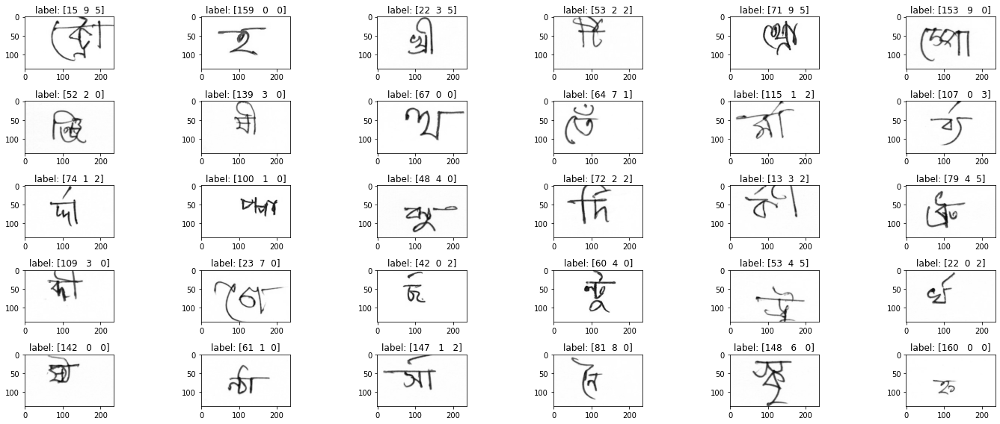

<Figure size 432x288 with 0 Axes>

In [15]:
nrow, ncol = 5, 6

fig, axes = plt.subplots(nrow, ncol, figsize=(20, 8))
axes = axes.flatten()
for i, ax in tqdm(enumerate(axes)):
    image, label = train_dataset[i]
    ax.imshow(image, cmap='Greys')
    ax.set_title(f'label: {label}')
plt.tight_layout()
plt.show()
plt.savefig('bengaliai.png')

<a id="processing"></a>
# Data augmentation/processing

For CNN training, data augmentation is important to improve test accuracy (generalization performance). I will show some image preprocessing to increase the data variety.

In [16]:
"""
From https://www.kaggle.com/corochann/deep-learning-cnn-with-chainer-lb-0-99700
"""
import cv2
from skimage.transform import AffineTransform, warp
import numpy as np


def affine_image(img):
    """

    Args:
        img: (h, w) or (1, h, w)

    Returns:
        img: (h, w)
    """
    # ch, h, w = img.shape
    # img = img / 255.
    if img.ndim == 3:
        img = img[0]

    # --- scale ---
    min_scale = 0.8
    max_scale = 1.2
    sx = np.random.uniform(min_scale, max_scale)
    sy = np.random.uniform(min_scale, max_scale)

    # --- rotation ---
    max_rot_angle = 4
    rot_angle = np.random.uniform(-max_rot_angle, max_rot_angle) * np.pi / 180.

    # --- shear ---
    max_shear_angle = 10
    shear_angle = np.random.uniform(-max_shear_angle, max_shear_angle) * np.pi / 180.

    # --- translation ---
    max_translation = 4
    tx = np.random.randint(-max_translation, max_translation)
    ty = np.random.randint(-max_translation, max_translation)

    #tform = AffineTransform(scale=(sx, sy), rotation=rot_angle, shear=shear_angle,
    #                        translation=(tx, ty))
    tform = AffineTransform(scale=(sx, sy), shear=shear_angle, rotation=rot_angle)
    
    transformed_image = warp(img, tform)
    assert transformed_image.ndim == 2
    return transformed_image


from scipy.ndimage.measurements import label

def connected_comp(array):
    
    structure = np.ones((3, 3), dtype=np.int)  # this defines the connection filter
    labeled, ncomponents = label(array, structure)
    
    valid = []
    for i in range(1,ncomponents+1):
        if np.sum(labeled == i)>10:
            valid.append(i)

    new_array = np.zeros(array.shape)
    for i in valid:
        new_array += labeled==i
    return new_array

def pad_with(vector, pad_width, iaxis, kwargs):
    pad_value = kwargs.get('padder', 0)
    vector[:pad_width[0]] = pad_value
    vector[-pad_width[1]:] = pad_value

def crop_char_image(image, threshold=5./255.):
    assert image.ndim == 2
    
    image[image < 20./255.] = 0
    
    is_black = image > threshold
    is_black[:5,:] = 0
    is_black[-5:,:] = 0
    is_black[:,:5] = 0
    is_black[:,-5:] = 0
    #is_black = connected_comp(is_black)
    is_black_vertical = np.sum(is_black, axis=0) > 0
    is_black_horizontal = np.sum(is_black, axis=1) > 0
    left = np.argmax(is_black_horizontal)
    right = np.argmax(is_black_horizontal[::-1])
    top = np.argmax(is_black_vertical)
    bottom = np.argmax(is_black_vertical[::-1])
    height, width = image.shape
    cropped_image = image[left-5:height - right+5, top-5:width - bottom+5]
    
    lx, ly = height - right - left + 10, width - bottom - top + 10
    l = max(lx,ly)
    #make sure that the aspect ratio is kept in rescaling
    cropped_image = np.pad(cropped_image, [((l-ly)//2,), ((l-lx)//2,)], mode='constant')
    
    # scaling
    cropped_image = cropped_image*(1/cropped_image.max())
    
    #pad
    cropped_image = np.pad(cropped_image, 8, pad_with)
    
    return cropped_image

def resize(image, size=(128, 128)):
    return cv2.resize(image, size)

In [17]:
# Erosion
def erosion(img):
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, tuple(np.random.randint(1, 3, 2)))
    img = cv2.erode(img, kernel, iterations=1)
    return img

# Dilation
def dilation(img):
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, tuple(np.random.randint(1, 3, 2)))
    img = cv2.dilate(img, kernel, iterations=1)
    return img


def get_random_kernel():
    structure = np.random.choice([cv2.MORPH_RECT, cv2.MORPH_ELLIPSE, cv2.MORPH_CROSS])
    kernel = cv2.getStructuringElement(structure, tuple(np.random.randint(1, 3, 2)))
    return kernel

# Opening
def opening(img):
    img = cv2.erode(img, get_random_kernel(), iterations=1)
    img = cv2.dilate(img, get_random_kernel(), iterations=1)
    return img

#Closing
def closing(img):
    img = cv2.dilate(img, get_random_kernel(), iterations=1)
    img = cv2.erode(img, get_random_kernel(), iterations=1)
    return img


## Affine transformation for data augmentation

To increase validation score, the number of training data is important. When we can use more number of training data, we can reduce overfitting and validation score becomes high.

"Data augmentation" is a technic to virtually create extra training data, based on the given training data. For this MNIST task, data augmentation can be achieved by utilizing affine transformation.

1. Rotation AffineTransformation
2. Translation
3. Scale
4. Shear

When the image is slightly rotated, shifted (transformed) or scaled, the image looks like the same label. We can virtually create another image data from one image in such a way.

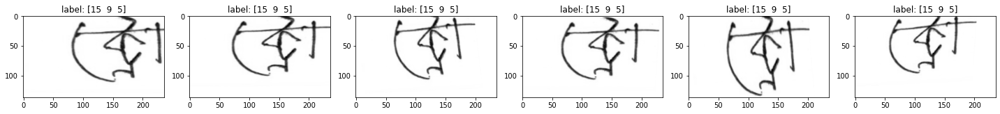

In [18]:
nrow, ncol = 1, 6

fig, axes = plt.subplots(nrow, ncol, figsize=(20, 8))
axes = axes.flatten()
for i, ax in tqdm(enumerate(axes)):
    image, label2 = train_dataset[0]
    ax.imshow(affine_image(image), cmap='Greys')
    ax.set_title(f'label: {label2}')
plt.tight_layout()

## crop image

Here I crop image

## resize image

We need to resize image after crop, to align image size for CNN batch training.

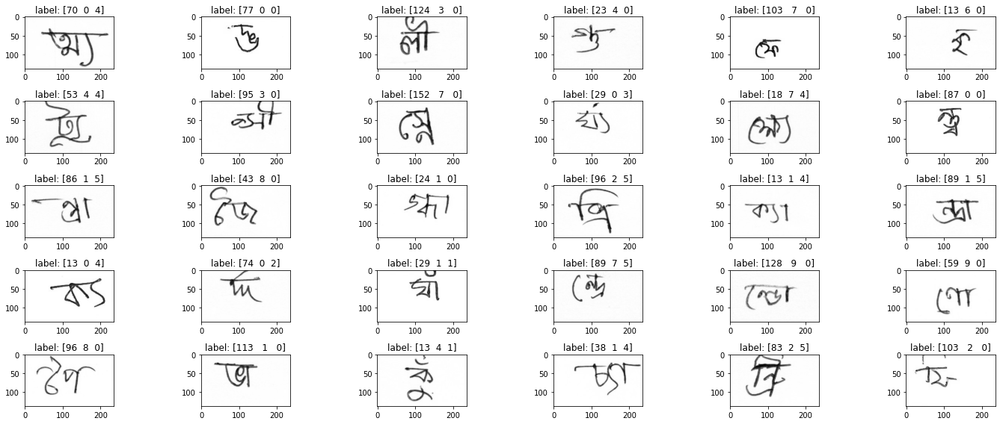

In [19]:
nrow, ncol = 5, 6

fig, axes = plt.subplots(nrow, ncol, figsize=(20, 8))
axes = axes.flatten()
for i, ax in tqdm(enumerate(axes)):
    image, label2 = train_dataset[i+30*5]
    ax.imshow(image, cmap='Greys')
    ax.set_title(f'label: {label2}')
plt.tight_layout()

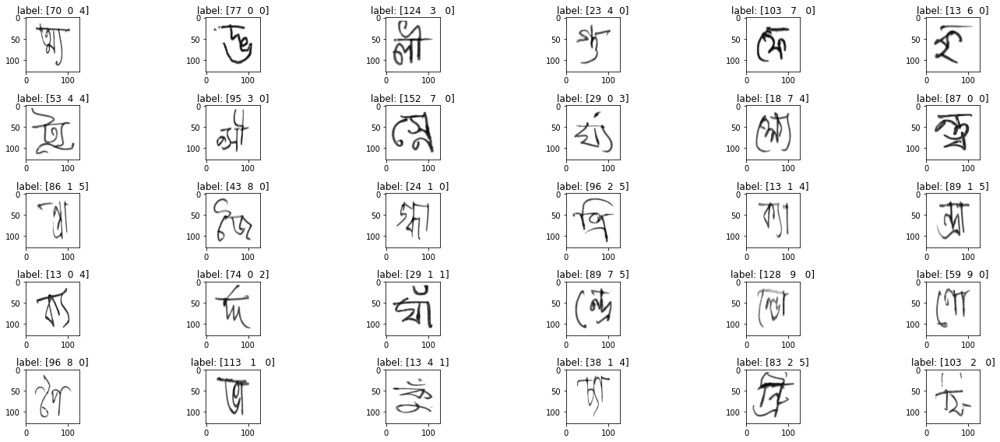

In [20]:
nrow, ncol = 5, 6

fig, axes = plt.subplots(nrow, ncol, figsize=(20, 8))
axes = axes.flatten()
for i, ax in tqdm(enumerate(axes)):
    image, label2 = train_dataset[i+30*5]
    ax.imshow(resize(crop_char_image(image, threshold=40./255.)), cmap='Greys')
    ax.set_title(f'label: {label2}')
plt.tight_layout()

Put everything together with `Transform` class. <br>
[Update] I added **albumentations augmentations** introduced in [Bengali: albumentations data augmentation tutorial](https://www.kaggle.com/corochann/bengali-albumentations-data-augmentation-tutorial).

In [21]:
import albumentations as A
import numpy as np


def add_gaussian_noise(x, sigma):
    x += np.random.randn(*x.shape) * sigma
    x = np.clip(x, 0., 1.)
    return x


def _evaluate_ratio(ratio):
    if ratio <= 0.:
        return False
    return np.random.uniform() < ratio


def apply_aug(aug, image):
    return aug(image=image)['image']


# class Transform:
#     def __init__(self, affine=True, crop=True, size=(64, 64),
#                  normalize=True, train=True, threshold=40.,
#                  sigma=-1., blur_ratio=0., noise_ratio=0., cutout_ratio=0.,
#                  grid_distortion_ratio=0., elastic_distortion_ratio=0., random_brightness_ratio=0.,
#                  piece_affine_ratio=0., ssr_ratio=0.):
#         self.affine = affine
#         self.crop = crop
#         self.size = size
#         self.normalize = normalize
#         self.train = train
#         self.threshold = threshold / 255.
#         self.sigma = sigma / 255.

#         self.blur_ratio = blur_ratio
#         self.noise_ratio = noise_ratio
#         self.cutout_ratio = cutout_ratio
#         self.grid_distortion_ratio = grid_distortion_ratio
#         self.elastic_distortion_ratio = elastic_distortion_ratio
#         self.random_brightness_ratio = random_brightness_ratio
#         self.piece_affine_ratio = piece_affine_ratio
#         self.ssr_ratio = ssr_ratio

#     def __call__(self, example):
        
        
#         if self.train:
#             x, y = example
#         else:
#             x = example
            
#         # --- Augmentation ---
#         if self.affine:
#             x = affine_image(x)

            
#         # --- Train/Test common preprocessing ---
#         if self.crop:
#             x = crop_char_image(x, threshold=self.threshold)
#         if self.size is not None:
#             x = resize(x, size=self.size)
#         #if self.sigma > 0.:
#         #    x = add_gaussian_noise(x, sigma=self.sigma)

        
#         #plt.imshow(x)
#         #plt.show()
        
#         # albumentations...
#         x = x.astype(np.float32)
#         assert x.ndim == 2
        
#         # 1. blur
#         if _evaluate_ratio(self.blur_ratio):
#             r = np.random.uniform()
#             if r < 0.25:
#                 x = apply_aug(A.Blur(p=1.0), x)
#             elif r < 0.5:
#                 x = apply_aug(A.MedianBlur(blur_limit=5, p=1.0), x)
#             elif r < 0.75:
#                 x = apply_aug(A.GaussianBlur(p=1.0), x)
#             else:
#                 x = apply_aug(A.MotionBlur(p=1.0), x)
                

#         if _evaluate_ratio(self.noise_ratio):
#             r = np.random.uniform()
#             if r < 0.50:
#                 x = apply_aug(A.GaussNoise(var_limit=5. / 255., p=1.0), x)
#             else:
#                 x = apply_aug(A.MultiplicativeNoise(p=1.0), x)

#         if _evaluate_ratio(self.cutout_ratio):
#             # A.Cutout(num_holes=2,  max_h_size=2, max_w_size=2, p=1.0)  # Deprecated...
#             x = apply_aug(A.Cutout(max_h_size=8, max_w_size=8, p=1.0), x)
#             #x = apply_aug(A.CoarseDropout(max_holes=8, max_height=8, max_width=8, p=1.0), x)

#         if _evaluate_ratio(self.grid_distortion_ratio):
#             x = apply_aug(A.GridDistortion(p=1.0), x)

#         if _evaluate_ratio(self.elastic_distortion_ratio):
#             x = apply_aug(A.ElasticTransform(
#                 sigma=50, alpha=1, alpha_affine=10, p=1.0), x)

#         if _evaluate_ratio(self.random_brightness_ratio):
#             # A.RandomBrightness(p=1.0)  # Deprecated...
#             # A.RandomContrast(p=1.0)    # Deprecated...
#             x = apply_aug(A.RandomBrightnessContrast(p=1.0), x)

#         if _evaluate_ratio(self.piece_affine_ratio):
#             x = apply_aug(A.IAAPiecewiseAffine(p=1.0), x)

#         if _evaluate_ratio(self.ssr_ratio):
#             x = apply_aug(A.ShiftScaleRotate(
#                 shift_limit=0.0625,
#                 scale_limit=0.1,
#                 rotate_limit=30,
#                 p=1.0), x)
        
# #         # 난수생성
# #         const = np.random.rand(1)[0]
        
#         # Erosion, dilation
# #         if const<0.5:
# #             x = erosion(x)
# #         else:
# #             x = dilation(x)
        
        
        
# #         if const<0.15:
# #             x = erosion(x)
# #         elif const<0.3:
# #             x = dilation(x)
# #         elif const<0.45:
# #             x = opening(x)
# #         elif const<0.6:
# #             x = closing(x)
        
# #         plt.imshow(x)
# #         plt.show()

        
#         #if self.normalize:
#         #    x = (x.astype(np.double) - 0.0692) / 0.2051
#         if x.ndim == 2:
#             x = x[None, :, :]
#         x = x.astype(np.double)
#         if self.train:
#             y = y.astype(np.int64)
#             return x, y
#         else:
#             return x
        
#         # normalize by its max val
#         x = x * (255./x.max())
        
        
class Transform:
    def __init__(self, affine=True, crop=True, size=(64, 64),
                 normalize=True, train=True, threshold=40.,
                 sigma=-1., blur_ratio=0., noise_ratio=0., cutout_ratio=0.,
                 grid_distortion_ratio=0., elastic_distortion_ratio=0., random_brightness_ratio=0.,
                 piece_affine_ratio=0., ssr_ratio=0.):
        self.affine = affine
        self.crop = crop
        self.size = size
        self.normalize = normalize
        self.train = train
        self.threshold = threshold / 255.
        self.sigma = sigma / 255.

        self.blur_ratio = blur_ratio
        self.noise_ratio = noise_ratio
        self.cutout_ratio = cutout_ratio
        self.grid_distortion_ratio = grid_distortion_ratio
        self.elastic_distortion_ratio = elastic_distortion_ratio
        self.random_brightness_ratio = random_brightness_ratio
        self.piece_affine_ratio = piece_affine_ratio
        self.ssr_ratio = ssr_ratio

    def __call__(self, example):
        if self.train:
            x, y = example
        else:
            x = example
                    
        # remove noise
        # x [x<28./255.] = 0
        
        # --- Augmentation ---
        if self.affine:
            x = affine_image(x)

        # --- Train/Test common preprocessing ---
        if self.crop:
            x = crop_char_image(x, threshold=self.threshold)
        if self.size is not None:
            x = resize(x, size=self.size)
        if self.sigma > 0.:
            x = add_gaussian_noise(x, sigma=self.sigma)

        # albumentations...
        x = x.astype(np.float32)
        assert x.ndim == 2
        # 1. blur
        if _evaluate_ratio(self.blur_ratio):
            r = np.random.uniform()
            if r < 0.25:
                x = apply_aug(A.Blur(p=1.0), x)
            elif r < 0.5:
                x = apply_aug(A.MedianBlur(blur_limit=5, p=1.0), x)
            elif r < 0.75:
                x = apply_aug(A.GaussianBlur(p=1.0), x)
            else:
                x = apply_aug(A.MotionBlur(p=1.0), x)

        if _evaluate_ratio(self.noise_ratio):
            r = np.random.uniform()
            if r < 0.50:
                x = apply_aug(A.GaussNoise(var_limit=5. / 255., p=1.0), x)
            else:
                x = apply_aug(A.MultiplicativeNoise(p=1.0), x)

        if _evaluate_ratio(self.cutout_ratio):
            # A.Cutout(num_holes=2,  max_h_size=2, max_w_size=2, p=1.0)  # Deprecated...
            x = apply_aug(A.CoarseDropout(max_holes=8, max_height=8, max_width=8, p=1.0), x)

        if _evaluate_ratio(self.grid_distortion_ratio):
            x = apply_aug(A.GridDistortion(p=1.0), x)

        if _evaluate_ratio(self.elastic_distortion_ratio):
            x = apply_aug(A.ElasticTransform(
                sigma=50, alpha=1, alpha_affine=10, p=1.0), x)

        if _evaluate_ratio(self.random_brightness_ratio):
            # A.RandomBrightness(p=1.0)  # Deprecated...
            # A.RandomContrast(p=1.0)    # Deprecated...
            x = apply_aug(A.RandomBrightnessContrast(p=1.0), x)

        if _evaluate_ratio(self.piece_affine_ratio):
            x = apply_aug(A.IAAPiecewiseAffine(p=1.0), x)

        if _evaluate_ratio(self.ssr_ratio):
            x = apply_aug(A.ShiftScaleRotate(
                shift_limit=0.0625,
                scale_limit=0.1,
                rotate_limit=30,
                p=1.0), x)

        #if self.normalize:
        #    x = (x.astype(np.float32) - 0.0692) / 0.2051
        # normalize by its max val
        # x = x * (255./x.max())
        
        if x.ndim == 2:
            x = x[None, :, :]
        x = x.astype(np.float32)
        if self.train:
            y = y.astype(np.int64)
            return x, y
        else:
            return x
        

In [22]:
# train_transform = Transform(
#     size=(image_size, image_size), threshold=20.,
#     sigma=-1., blur_ratio=0.1, noise_ratio=0, cutout_ratio=0.2,
#     grid_distortion_ratio=0.2, random_brightness_ratio=0.2,
#     piece_affine_ratio=0.2, ssr_ratio=0.2)
# train_dataset = BengaliAIDataset(train_images, train_labels,
#                                  transform=train_transform)

# for i in range(10):
#     train_dataset[0]

In [23]:
train_transform = Transform(
    size=(image_size, image_size), threshold=40.,
    sigma=-1., blur_ratio=0.2, noise_ratio=0.2, cutout_ratio=0.2,
    grid_distortion_ratio=0.2, random_brightness_ratio=0.2,
    piece_affine_ratio=0.2, ssr_ratio=0.2)
# transform = Transform(size=(image_size, image_size)
train_dataset = BengaliAIDataset(train_images, train_labels,
                                 transform=train_transform)

### Let's final check the processed images, which will be trained by the model.

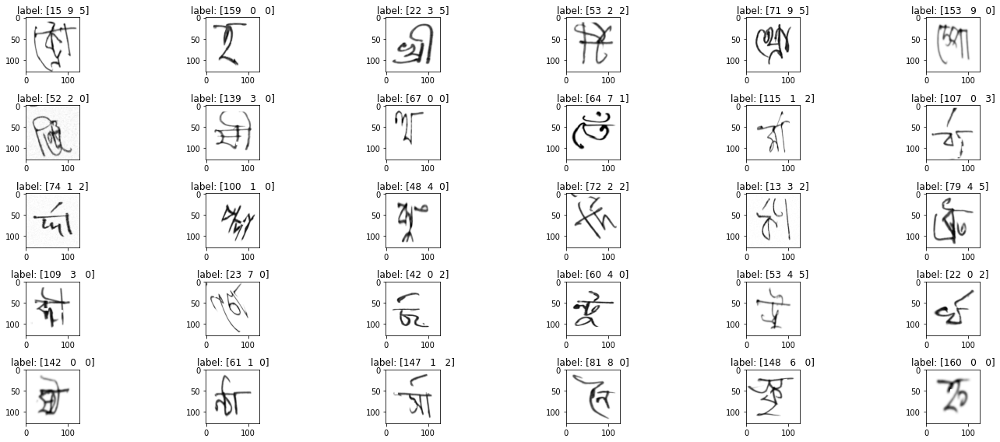

In [24]:
nrow, ncol = 5, 6

fig, axes = plt.subplots(nrow, ncol, figsize=(20, 8))
axes = axes.flatten()
for i, ax in tqdm(enumerate(axes)):
    image, label = train_dataset[i]
    ax.imshow(image[0], cmap='Greys')
    ax.set_title(f'label: {label}')
plt.tight_layout()

<a id="model"></a> 
# pytorch model & define classifier

In [25]:
import torch


def residual_add(lhs, rhs):
    lhs_ch, rhs_ch = lhs.shape[1], rhs.shape[1]
    if lhs_ch < rhs_ch:
        out = lhs + rhs[:, :lhs_ch]
    elif lhs_ch > rhs_ch:
        out = torch.cat([lhs[:, :rhs_ch] + rhs, lhs[:, rhs_ch:]], dim=1)
    else:
        out = lhs + rhs
    return out


In [26]:
from typing import List

import torch
from torch import nn
from torch.nn.parameter import Parameter


class LazyLoadModule(nn.Module):
    """Lazy buffer/parameter loading using load_state_dict_pre_hook

    Define all buffer/parameter in `_lazy_buffer_keys`/`_lazy_parameter_keys` and
    save buffer with `register_buffer`/`register_parameter`
    method, which can be outside of __init__ method.
    Then this module can load any shape of Tensor during de-serializing.

    Note that default value of lazy buffer is torch.Tensor([]), while lazy parameter is None.
    """
    _lazy_buffer_keys: List[str] = []     # It needs to be override to register lazy buffer
    _lazy_parameter_keys: List[str] = []  # It needs to be override to register lazy parameter

    def __init__(self):
        super(LazyLoadModule, self).__init__()
        for k in self._lazy_buffer_keys:
            self.register_buffer(k, torch.tensor([]))
        for k in self._lazy_parameter_keys:
            self.register_parameter(k, None)
        self._register_load_state_dict_pre_hook(self._hook)

    def _hook(self, state_dict, prefix, local_metadata, strict, missing_keys,
             unexpected_keys, error_msgs):
        for key in self._lazy_buffer_keys:
            self.register_buffer(key, state_dict[prefix + key])

        for key in self._lazy_parameter_keys:
            self.register_parameter(key, Parameter(state_dict[prefix + key]))


In [27]:
import math
import torch
from torch.nn import init
from torch.nn.parameter import Parameter
import torch.nn.functional as F


class LazyLinear(LazyLoadModule):
    """Linear module with lazy input inference

    `in_features` can be `None`, and it is determined at the first time of forward step dynamically.
    """

    __constants__ = ['bias', 'in_features', 'out_features']
    _lazy_parameter_keys = ['weight']

    def __init__(self, in_features, out_features, bias=True):
        super(LazyLinear, self).__init__()
        self.in_features = in_features
        self.out_features = out_features
        if bias:
            self.bias = Parameter(torch.Tensor(out_features))
        else:
            self.register_parameter('bias', None)

        if in_features is not None:
            self.weight = Parameter(torch.Tensor(out_features, in_features))
            self.reset_parameters()

    def reset_parameters(self):
        init.kaiming_uniform_(self.weight, a=math.sqrt(5))
        if self.bias is not None:
            fan_in, _ = init._calculate_fan_in_and_fan_out(self.weight)
            bound = 1 / math.sqrt(fan_in)
            init.uniform_(self.bias, -bound, bound)

    def forward(self, input):
        if self.weight is None:
            self.in_features = input.shape[-1]
            self.weight = Parameter(torch.Tensor(self.out_features, self.in_features))
            self.reset_parameters()

            # Need to send lazy defined parameter to device...
            self.to(input.device)
        return F.linear(input, self.weight, self.bias)

    def extra_repr(self):
        return 'in_features={}, out_features={}, bias={}'.format(
            self.in_features, self.out_features, self.bias is not None
        )


In [28]:
from torch import nn
import torch.nn.functional as F


class LinearBlock(nn.Module):

    def __init__(self, in_features, out_features, bias=True,
                 use_bn=True, activation=F.relu, dropout_ratio=-1, residual=False,):
        super(LinearBlock, self).__init__()
        if in_features is None:
            self.linear = LazyLinear(in_features, out_features, bias=bias)
        else:
            self.linear = nn.Linear(in_features, out_features, bias=bias)
        if use_bn:
            self.bn = nn.BatchNorm1d(out_features)
        if dropout_ratio > 0.:
            self.dropout = nn.Dropout(p=dropout_ratio)
        else:
            self.dropout = None
        self.activation = activation
        self.use_bn = use_bn
        self.dropout_ratio = dropout_ratio
        self.residual = residual

    def __call__(self, x):
        h = self.linear(x)
        if self.use_bn:
            h = self.bn(h)
        if self.activation is not None:
            h = self.activation(h)
        if self.residual:
            h = residual_add(h, x)
        if self.dropout_ratio > 0:
            h = self.dropout(h)
        return h

In [29]:
import pretrainedmodels
import torch
from torch import nn
import torch.nn.functional as F
from torch.nn import Sequential


class PretrainedCNN(nn.Module):
    def __init__(self, model_name='se_resnext101_32x4d',
                 in_channels=1, out_dim=10, use_bn=True,
                 pretrained='imagenet'):
        super(PretrainedCNN, self).__init__()
        self.conv0 = nn.Conv2d(
            in_channels, 3, kernel_size=3, stride=1, padding=1, bias=True)
        self.base_model = pretrainedmodels.__dict__[model_name](pretrained=pretrained)
        activation = F.leaky_relu
        self.do_pooling = True
        if self.do_pooling:
            inch = self.base_model.last_linear.in_features
        else:
            inch = None
        hdim = 512
        lin1 = LinearBlock(inch, hdim, use_bn=use_bn, activation=activation, residual=False)
        lin2 = LinearBlock(hdim, out_dim, use_bn=use_bn, activation=None, residual=False)
        self.lin_layers = Sequential(lin1, lin2)

    def forward(self, x):
        
        h = self.conv0(x)
        h = self.base_model.features(h)
        
        if self.do_pooling:
            h = torch.sum(h, dim=(-1, -2))
        else:
            # [128, 2048, 4, 4] when input is (128, 128)
            bs, ch, height, width = h.shape
            h = h.view(bs, ch*height*width)
        for layer in self.lin_layers:
            h = layer(h)
            
        return h

## Classifier

In [30]:
def rand_bbox(size, lam):
    W = size[2]
    H = size[3]
    cut_rat = np.sqrt(1. - lam)
    cut_w = np.int(W * cut_rat)
    cut_h = np.int(H * cut_rat)

    # uniform
    cx = np.random.randint(W)
    cy = np.random.randint(H)

    bbx1 = np.clip(cx - cut_w // 2, 0, W)
    bby1 = np.clip(cy - cut_h // 2, 0, H)
    bbx2 = np.clip(cx + cut_w // 2, 0, W)
    bby2 = np.clip(cy + cut_h // 2, 0, H)

    return bbx1, bby1, bbx2, bby2
def cutmix(data, targets1, targets2, targets3, alpha):
    indices = torch.randperm(data.size(0))
    shuffled_data = data[indices]
    shuffled_targets1 = targets1[indices]
    shuffled_targets2 = targets2[indices]
    shuffled_targets3 = targets3[indices]

    lam = np.random.beta(alpha, alpha)
    while lam > 0.999:
        lam = np.random.beta(alpha, alpha)
    bbx1, bby1, bbx2, bby2 = rand_bbox(data.size(), lam)
    
#     print(lam)
#     print(data.shape)
#     print(indices)
#     print(bbx1, bbx2, bby1, bby2)
    
    data[:, :, bbx1:bbx2, bby1:bby2] = data[indices, :, bbx1:bbx2, bby1:bby2]
    # adjust lambda to exactly match pixel ratio
    lam = 1 - ((bbx2 - bbx1) * (bby2 - bby1) / (data.size()[-1] * data.size()[-2]))

    targets = [targets1, shuffled_targets1, targets2, shuffled_targets2, targets3, shuffled_targets3, lam]
    return data, targets

def mixup(data, targets1, targets2, targets3, alpha):
    indices = torch.randperm(data.size(0))
    shuffled_data = data[indices]
    shuffled_targets1 = targets1[indices]
    shuffled_targets2 = targets2[indices]
    shuffled_targets3 = targets3[indices]

    lam = np.random.beta(alpha, alpha)
    data = data * lam + shuffled_data * (1 - lam)
    targets = [targets1, shuffled_targets1, targets2, shuffled_targets2, targets3, shuffled_targets3, lam]

    return data, targets


def cutmix_criterion(preds1,preds2,preds3, targets):
    targets1, targets2,targets3, targets4,targets5, targets6, lam = targets[0], targets[1], targets[2], targets[3], targets[4], targets[5], targets[6]
    criterion = nn.CrossEntropyLoss(reduction='mean')
    return lam * criterion(preds1, targets1) + (1 - lam) * criterion(preds1, targets2) + lam * criterion(preds2, targets3) + (1 - lam) * criterion(preds2, targets4) + lam * criterion(preds3, targets5) + (1 - lam) * criterion(preds3, targets6)

def mixup_criterion(preds1,preds2,preds3, targets):
    targets1, targets2,targets3, targets4,targets5, targets6, lam = targets[0], targets[1], targets[2], targets[3], targets[4], targets[5], targets[6]
    criterion = nn.CrossEntropyLoss(reduction='mean')
    return lam * criterion(preds1, targets1) + (1 - lam) * criterion(preds1, targets2) + lam * criterion(preds2, targets3) + (1 - lam) * criterion(preds2, targets4) + lam * criterion(preds3, targets5) + (1 - lam) * criterion(preds3, targets6)

In [31]:
import torch
from torch import nn
import torch.nn.functional as F
from tqdm import tqdm


def accuracy(y, t):
    pred_label = torch.argmax(y, dim=1)
    count = pred_label.shape[0]
    correct = (pred_label == t).sum().type(torch.double)
    acc = correct / count
    return acc


class BengaliClassifier(nn.Module):
    def __init__(self, predictor, n_grapheme=168, n_vowel=11, n_consonant=7):
        super(BengaliClassifier, self).__init__()
        self.n_grapheme = n_grapheme
        self.n_vowel = n_vowel
        self.n_consonant = n_consonant
        self.n_total_class = self.n_grapheme + self.n_vowel + self.n_consonant
        self.predictor = predictor.float()
        
        self.metrics_keys = [
            'loss', 'loss_grapheme', 'loss_vowel', 'loss_consonant',
            'acc_grapheme', 'acc_vowel', 'acc_consonant']
        
    def forward(self, x, y=None):
        
        const = np.random.randint(6)
        
        if const<2:        
            # mixup
            data, targets = mixup(x, y[:,0], y[:,1], y[:,2], 0.4)
            x = data
        elif const<4:        
            # cutmix
            data, targets = cutmix(x, y[:,0], y[:,1], y[:,2], 0.4)
            x = data
            
        #plt.imshow(x[0,0].cpu().numpy())
        #plt.show()
            
        pred = self.predictor(x)
        
        if isinstance(pred, tuple):
            assert len(pred) == 3
            preds = pred
        else:
            assert pred.shape[1] == self.n_total_class
            preds = torch.split(pred, [self.n_grapheme, self.n_vowel, self.n_consonant], dim=1)
            
        if const<4:
            # cutmix or mixup
            targets1, targets2, targets3, targets4,targets5, targets6, lam = targets[0], targets[1], targets[2], targets[3], targets[4], targets[5], targets[6]        
            preds1, preds2, preds3 = preds[0], preds[1], preds[2]
            lam = float(lam)
            loss_grapheme = lam * F.cross_entropy(preds1, targets1) + (1 - lam) * F.cross_entropy(preds1, targets2) 
            loss_vowel = lam * F.cross_entropy(preds2, targets3) + (1 - lam) * F.cross_entropy(preds2, targets4)
            loss_consonant = lam * F.cross_entropy(preds3, targets5) + (1 - lam) * F.cross_entropy(preds3, targets6)
            loss = 2*loss_grapheme + loss_vowel + loss_consonant
        else:
            loss_grapheme = F.cross_entropy(preds[0], y[:, 0])
            loss_vowel = F.cross_entropy(preds[1], y[:, 1])
            loss_consonant = F.cross_entropy(preds[2], y[:, 2])
            loss = 2*loss_grapheme + loss_vowel + loss_consonant
            
        metrics = {
            'loss': loss.item(),
            'loss_grapheme': loss_grapheme.item(),
            'loss_vowel': loss_vowel.item(),
            'loss_consonant': loss_consonant.item(),
            'acc_grapheme': accuracy(preds[0], y[:, 0]),
            'acc_vowel': accuracy(preds[1], y[:, 1]),
            'acc_consonant': accuracy(preds[2], y[:, 2]),
        }
        
        return loss, metrics, pred
    
    
    
    def forward_val(self, x, y=None):

        pred = self.predictor(x)
        
        if isinstance(pred, tuple):
            assert len(pred) == 3
            preds = pred
        else:
            assert pred.shape[1] == self.n_total_class
            preds = torch.split(pred, [self.n_grapheme, self.n_vowel, self.n_consonant], dim=1)
        
        loss_grapheme = F.cross_entropy(preds[0], y[:, 0])
        loss_vowel = F.cross_entropy(preds[1], y[:, 1])
        loss_consonant = F.cross_entropy(preds[2], y[:, 2])
        loss = 2*loss_grapheme + loss_vowel + loss_consonant
        metrics = {
            'loss': loss.item(),
            'loss_grapheme': loss_grapheme.item(),
            'loss_vowel': loss_vowel.item(),
            'loss_consonant': loss_consonant.item(),
            'acc_grapheme': accuracy(preds[0], y[:, 0]),
            'acc_vowel': accuracy(preds[1], y[:, 1]),
            'acc_consonant': accuracy(preds[2], y[:, 2]),
        }
        
        return loss, metrics, pred
    

    def calc(self, data_loader):
        device: torch.device = next(self.parameters()).device
        self.eval()
        output_list = []
        with torch.no_grad():
            for batch in tqdm(data_loader):
                # TODO: support general preprocessing.
                # If `data` is not `Data` instance, `to` method is not supported!
                batch = batch.to(device)
                pred = self.predictor(batch)
                
                output_list.append(pred)
        output = torch.cat(output_list, dim=0)
        preds = torch.split(output, [self.n_grapheme, self.n_vowel, self.n_consonant], dim=1)
        return preds

    def predict_proba(self, data_loader):
        preds = self.calc(data_loader)
        return [F.softmax(p, dim=1) for p in preds]

    def predict(self, data_loader):
        preds = self.calc(data_loader)
        pred_labels = [torch.argmax(p, dim=1) for p in preds]
        return pred_labels

<a id="train"></a>
# Training code

## prepare data

In [32]:
# import numpy as np
# import pandas as pd
# import iterstrat
# #!pip install iterative-stratification


# #get data
# nfold = 5
# seed = 12

# train_df = copy.copy(train)
# train_df['id'] = train_df['image_id'].apply(lambda x: int(x.split('_')[1]))

# X, y = train_df[['id', 'grapheme_root', 'vowel_diacritic', 'consonant_diacritic']]\
# .values[:,0], train_df.values[:,1:]

# train_df['fold'] = np.nan

# #split data
# from iterstrat.ml_stratifiers import MultilabelStratifiedKFold
# mskf = MultilabelStratifiedKFold(n_splits=nfold, random_state=seed)
# for i, (_, test_index) in enumerate(mskf.split(X, y)):
#     train_df.iloc[test_index, -1] = i
    
# train_df['fold'] = train_df['fold'].astype('int')

In [33]:
# iterative-stratification

import copy
import numpy as np
import pandas as pd
import iterstrat
#!pip install iterative-stratification

#get data
nfold = 5
seed = 12

train_df = copy.copy(train)
train_df['id'] = train_df['image_id'].apply(lambda x: int(x.split('_')[1]))

X, y = train_df[['id', 'grapheme_root', 'vowel_diacritic', 'consonant_diacritic']]\
.values[:,0], train_df.values[:,1:]

train_df['fold'] = np.nan

#split data
from iterstrat.ml_stratifiers import MultilabelStratifiedKFold
mskf = MultilabelStratifiedKFold(n_splits=nfold, random_state=seed)
for i, (_, test_index) in enumerate(mskf.split(X, y)):
    train_df.iloc[test_index, -1] = i
    
train_df['fold'] = train_df['fold'].astype('int')

#------------------------------

n_dataset = len(train_images)
train_data_size = 200 if debug else int(n_dataset * 0.8)
valid_data_size = 100 if debug else int(n_dataset - train_data_size)

#perm = np.random.RandomState(777).permutation(n_dataset)
#print('perm', perm)
train_dataset = BengaliAIDataset(
    train_images, train_labels, transform=train_transform,
    indices = np.array(list(train_df[train_df['fold']!=0].index)))
    #    indices=perm[:train_data_size])
valid_dataset = BengaliAIDataset(
    train_images, train_labels, transform=Transform(affine=False, crop=True, size=(image_size, image_size)),
    indices = np.array(list(train_df[train_df['fold']==0].index)))
#    indices=perm[train_data_size:train_data_size+valid_data_size])
print('train_dataset', len(train_dataset), 'valid_dataset', len(valid_dataset))

# --- Model ---
device = torch.device(device)
n_grapheme = 168
n_vowel = 11
n_consonant = 7
n_total = n_grapheme + n_vowel + n_consonant
print('n_total', n_total)
# Set pretrained='imagenet' to download imagenet pretrained model...
predictor = PretrainedCNN(in_channels=1, out_dim=n_total, model_name=model_name, pretrained=None)
print('predictor', type(predictor))

/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/sklearn/model_selection/_split.py:296: FutureWarning:

Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.



train_dataset 160672 valid_dataset 40168
n_total 186
predictor <class '__main__.PretrainedCNN'>


In [34]:
# #load weights
# predictor.load_state_dict(torch.load(r"/home/dohee/Documents/Bengali/code/save/model_000030.pt"))
# predictor.train()

classifier = BengaliClassifier(predictor).to(device)

## Ignite utility

pytorch-ignite utility class for training

In [35]:
import json
from logging import getLogger
import numpy

def save_json(filepath, params):
    with open(filepath, 'w') as f:
        json.dump(params, f, indent=4)

import os
from logging import getLogger
from time import perf_counter

import pandas as pd
import torch
# from chainer_chemistry.utils import save_json

from ignite.engine.engine import Engine, Events
from ignite.metrics import Average


class DictOutputTransform:
    def __init__(self, key, index=0):
        self.key = key
        self.index = index

    def __call__(self, x):
        if self.index >= 0:
            x = x[self.index]
        return x[self.key]


def create_trainer(classifier, optimizer, device):
    classifier.to(device)    
    def update_fn(engine, batch):
        classifier.train()
        optimizer.zero_grad()

        # batch = [elem.to(device) for elem in batch]
        x, y = [elem.to(device) for elem in batch]
        x = x.float()
        
#         # mixup
#         data, targets = mixup(x, y[:,0], y[:,1], y[:,2], 0.4)
#         #print(data.shape)
#         print(len(targets))
#         print(targets[0].shape)
#         print(y.shape)
        
#         print(targets)
#         print(y)

        
        loss, metrics, pred_y = classifier(x, y)
        
#         print(pred_y.shape)
#         print(pred_y)
#         print("---------------")
        
        loss.backward()
        optimizer.step()
        return metrics, pred_y, y
    
    
    trainer = Engine(update_fn)
    
    for key in classifier.metrics_keys:
        Average(output_transform=DictOutputTransform(key)).attach(trainer, key)
        
    return trainer


def create_evaluator(classifier, device):
    classifier.to(device)
    def update_fn(engine, batch):
        classifier.eval()
        with torch.no_grad():
            # batch = [elem.to(device) for elem in batch]
            x, y = [elem.to(device) for elem in batch]
            x = x.float()
            _, metrics, pred_y = classifier.forward_val(x, y)
            return metrics, pred_y, y
    evaluator = Engine(update_fn)
    for key in classifier.metrics_keys:
        Average(output_transform=DictOutputTransform(key)).attach(evaluator, key)
    return evaluator


class LogReport:
    def __init__(self, evaluator=None, dirpath=None, logger=None):
        self.evaluator = evaluator
        self.dirpath = str(dirpath) if dirpath is not None else None
        self.logger = logger or getLogger(__name__)

        self.reported_dict = {}  # To handle additional parameter to monitor
        self.history = []
        self.start_time = perf_counter()

    def report(self, key, value):
        self.reported_dict[key] = value

    def __call__(self, engine):
        elapsed_time = perf_counter() - self.start_time
        elem = {'epoch': engine.state.epoch,
                'iteration': engine.state.iteration}
        elem.update({f'train/{key}': value
                     for key, value in engine.state.metrics.items()})
        if self.evaluator is not None:
            elem.update({f'valid/{key}': value
                         for key, value in self.evaluator.state.metrics.items()})
        elem.update(self.reported_dict)
        elem['elapsed_time'] = elapsed_time
        
        ####
        print(elem)
        
        self.history.append(elem)
        if self.dirpath:
            save_json(os.path.join(self.dirpath, 'log.json'), self.history)
            self.get_dataframe().to_csv(os.path.join(self.dirpath, 'log.csv'), index=False)

        # --- print ---
        msg = ''
        for key, value in elem.items():
            if key in ['iteration']:
                # skip printing some parameters...
                continue
            elif isinstance(value, int):
                msg += f'{key} {value: >6d} '
            else:
                msg += f'{key} {value: 8f} '
#         self.logger.warning(msg)
        print(msg)

        # --- Reset ---
        self.reported_dict = {}

    def get_dataframe(self):
        df = pd.DataFrame(self.history)
        return df


class SpeedCheckHandler:
    def __init__(self, iteration_interval=10, logger=None):
        self.iteration_interval = iteration_interval
        self.logger = logger or getLogger(__name__)
        self.prev_time = perf_counter()

    def __call__(self, engine: Engine):
        if engine.state.iteration % self.iteration_interval == 0:
            cur_time = perf_counter()
            spd = self.iteration_interval / (cur_time - self.prev_time)
            self.logger.warning(f'{spd} iter/sec')
            # reset
            self.prev_time = cur_time

    def attach(self, engine: Engine):
        engine.add_event_handler(Events.ITERATION_COMPLETED, self)


class ModelSnapshotHandler:
    def __init__(self, model, filepath=r'./save/model_{count:06}.pt',
                 interval=10, logger=None):
        self.model = model
        self.filepath: str = str(filepath)
        self.interval = interval
        self.logger = logger or getLogger(__name__)
        self.count = 0

    def __call__(self, engine: Engine):
        self.count += 1
        if self.count % self.interval == 0:
            filepath = self.filepath.format(count=self.count)
            torch.save(self.model.state_dict(), filepath)
            print("saving model epoch:", self.count)
            
            #self.logger.warning(f'save model to {filepath}...')


import warnings

import torch

from ignite.metrics.metric import Metric


class EpochMetric(Metric):
    """Class for metrics that should be computed on the entire output history of a model.
    Model's output and targets are restricted to be of shape `(batch_size, n_classes)`. Output
    datatype should be `float32`. Target datatype should be `long`.

    .. warning::

        Current implementation stores all input data (output and target) in as tensors before computing a metric.
        This can potentially lead to a memory error if the input data is larger than available RAM.


    - `update` must receive output of the form `(y_pred, y)`.

    If target shape is `(batch_size, n_classes)` and `n_classes > 1` than it should be binary: e.g. `[[0, 1, 0, 1], ]`.

    Args:
        compute_fn (callable): a callable with the signature (`torch.tensor`, `torch.tensor`) takes as the input
            `predictions` and `targets` and returns a scalar.
        output_transform (callable, optional): a callable that is used to transform the
            :class:`~ignite.engine.Engine`'s `process_function`'s output into the
            form expected by the metric. This can be useful if, for example, you have a multi-output model and
            you want to compute the metric with respect to one of the outputs.

    """

    def __init__(self, compute_fn, output_transform=lambda x: x):

        if not callable(compute_fn):
            raise TypeError("Argument compute_fn should be callable.")

        super(EpochMetric, self).__init__(output_transform=output_transform)
        self.compute_fn = compute_fn

    def reset(self):
        self._predictions = torch.tensor([], dtype=torch.float)
        self._targets = torch.tensor([], dtype=torch.long)

    def update(self, output):
        y_pred, y = output
        self._predictions = torch.cat([self._predictions, y_pred], dim=0)
        self._targets = torch.cat([self._targets, y], dim=0)

        # Check once the signature and execution of compute_fn
        if self._predictions.shape == y_pred.shape:
            try:
                self.compute_fn(self._predictions, self._targets)
            except Exception as e:
                warnings.warn("Probably, there can be a problem with `compute_fn`:\n {}.".format(e),
                              RuntimeWarning)

    def compute(self):
        return self.compute_fn(self._predictions, self._targets)


import numpy as np
import sklearn.metrics
import torch


def macro_recall(pred_y, y, n_grapheme=168, n_vowel=11, n_consonant=7):
    pred_y = torch.split(pred_y, [n_grapheme, n_vowel, n_consonant], dim=1)
    pred_labels = [torch.argmax(py, dim=1).cpu().numpy() for py in pred_y]

    y = y.cpu().numpy()
    # pred_y = [p.cpu().numpy() for p in pred_y]

    recall_grapheme = sklearn.metrics.recall_score(pred_labels[0], y[:, 0], average='macro')
    recall_vowel = sklearn.metrics.recall_score(pred_labels[1], y[:, 1], average='macro')
    recall_consonant = sklearn.metrics.recall_score(pred_labels[2], y[:, 2], average='macro')
    scores = [recall_grapheme, recall_vowel, recall_consonant]
    final_score = np.average(scores, weights=[2, 1, 1])
    # print(f'recall: grapheme {recall_grapheme}, vowel {recall_vowel}, consonant {recall_consonant}, '
    #       f'total {final_score}, y {y.shape}')
    return final_score


def calc_macro_recall(solution, submission):
    # solution df, submission df
    scores = []
    for component in ['grapheme_root', 'consonant_diacritic', 'vowel_diacritic']:
        y_true_subset = solution[solution[component] == component]['target'].values
        y_pred_subset = submission[submission[component] == component]['target'].values
        scores.append(sklearn.metrics.recall_score(
            y_true_subset, y_pred_subset, average='macro'))
    final_score = np.average(scores, weights=[2, 1, 1])
    return final_score


In [36]:
# def create_trainer(classifier, optimizer, device):
#     classifier.to(device)    
#     def update_fn(engine, batch):
#         classifier.train()
#         optimizer.zero_grad()

#         # batch = [elem.to(device) for elem in batch]
#         x, y = [elem.to(device) for elem in batch]        
#         x = x.float()
        
#         print(x.shape)
#         print(y.shape)
        
#         loss, metrics, pred_y = classifier(x, y)

In [37]:
# from ignite.handlers import ModelCheckpoint

# checkpoint_every = 10

# dirname = r"./save"
# engine_checkpoint = ModelCheckpoint(
#     dirname=dirname,
#     'my_model',
#     save_interval=checkpoint_every,
#     create_dir = True)

In [38]:
import argparse
from distutils.util import strtobool
import os

import torch
from ignite.contrib.handlers import ProgressBar
from ignite.engine import Events
from numpy.random.mtrand import RandomState
from torch.utils.data.dataloader import DataLoader

# --- Training setting ---

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False)


#optimizer = torch.optim.Adam(classifier.parameters(), lr=0.001)

# AdamW
optimizer = torch.optim.AdamW(classifier.parameters(), lr=0.001)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='min', factor=0.7, patience=5, min_lr=1e-10)

trainer = create_trainer(classifier, optimizer, device)
def output_transform(output):
    metric, pred_y, y = output
    return pred_y.cpu(), y.cpu()
EpochMetric(
    compute_fn=macro_recall,
    output_transform=output_transform
).attach(trainer, 'recall')

pbar = ProgressBar()
pbar.attach(trainer, metric_names='all')

evaluator = create_evaluator(classifier, device)
EpochMetric(
    compute_fn=macro_recall,
    output_transform=output_transform
).attach(evaluator, 'recall')

def run_evaluator(engine):
    evaluator.run(valid_loader)

def schedule_lr(engine):
    # metrics = evaluator.state.metrics
    metrics = engine.state.metrics
    avg_mae = metrics['loss']

    # --- update lr ---
    lr = scheduler.optimizer.param_groups[0]['lr']
    scheduler.step(avg_mae)
    log_report.report('lr', lr)

trainer.add_event_handler(Events.EPOCH_COMPLETED, run_evaluator)
trainer.add_event_handler(Events.EPOCH_COMPLETED, schedule_lr)
log_report = LogReport(evaluator, outdir)
trainer.add_event_handler(Events.EPOCH_COMPLETED, log_report)
trainer.add_event_handler(
    Events.EPOCH_COMPLETED,
    ModelSnapshotHandler(predictor))
    #ModelSnapshotHandler(predictor, filepath=outdir / 'predictor.pt'))
#trainer.add_event_handler(Events.EPOCH_COMPLETED, engine_checkpoint, {'mymodel':classifier})

In [40]:
predictor

PretrainedCNN(
  (conv0): Conv2d(1, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (base_model): SENet(
    (layer0): Sequential(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu1): ReLU(inplace=True)
      (pool): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
    )
    (layer1): Sequential(
      (0): SEResNeXtBottleneck(
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
        (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(128, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(25

In [ ]:
trainer.run(train_loader, max_epochs=100)

/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/sklearn/metrics/_classification.py:1268: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



{'epoch': 1, 'iteration': 1256, 'train/loss': 8.167867172485703, 'train/loss_grapheme': 2.9647871659724574, 'train/loss_vowel': 1.2024643371344372, 'train/loss_consonant': 1.0358285023860492, 'train/acc_grapheme': 0.33022118829617836, 'train/acc_vowel': 0.5740632464171974, 'train/acc_consonant': 0.6851861066878981, 'train/recall': 0.4291189120323681, 'valid/loss': 2.2300052703565854, 'valid/loss_grapheme': 0.7750641868752279, 'valid/loss_vowel': 0.34059386676663805, 'valid/loss_consonant': 0.3392830393781328, 'valid/acc_grapheme': 0.8199871386575208, 'valid/acc_vowel': 0.9428474093581578, 'valid/acc_consonant': 0.9472742375061245, 'valid/recall': 0.8959170068223056, 'lr': 0.001, 'elapsed_time': 1906.4730482960003}
epoch      1 train/loss  8.167867 train/loss_grapheme  2.964787 train/loss_vowel  1.202464 train/loss_consonant  1.035829 train/acc_grapheme  0.330221 train/acc_vowel  0.574063 train/acc_consonant  0.685186 train/recall  0.429119 valid/loss  2.230005 valid/loss_grapheme  0.77

{'epoch': 2, 'iteration': 2512, 'train/loss': 5.195615245278474, 'train/loss_grapheme': 1.859193729343498, 'train/loss_vowel': 0.8563431518235404, 'train/loss_consonant': 0.6208846280529241, 'train/acc_grapheme': 0.5318968949044586, 'train/acc_vowel': 0.6783315087579618, 'train/acc_consonant': 0.7827552746815286, 'train/recall': 0.6131064691412085, 'valid/loss': 1.4053201760835707, 'valid/loss_grapheme': 0.4783072570326981, 'valid/loss_vowel': 0.24066899123655003, 'valid/loss_consonant': 0.2080366729645972, 'valid/acc_grapheme': 0.8923417595541401, 'valid/acc_vowel': 0.9686275110240078, 'valid/acc_consonant': 0.9613623836354728, 'valid/recall': 0.928676092988352, 'lr': 0.001, 'elapsed_time': 3754.6557236610024}
epoch      2 train/loss  5.195615 train/loss_grapheme  1.859194 train/loss_vowel  0.856343 train/loss_consonant  0.620885 train/acc_grapheme  0.531897 train/acc_vowel  0.678332 train/acc_consonant  0.782755 train/recall  0.613106 valid/loss  1.405320 valid/loss_grapheme  0.47830

{'epoch': 3, 'iteration': 3768, 'train/loss': 4.661167435775138, 'train/loss_grapheme': 1.6762571276468077, 'train/loss_vowel': 0.788738821698412, 'train/loss_consonant': 0.519914366577746, 'train/acc_grapheme': 0.5614736763535032, 'train/acc_vowel': 0.6887689092356688, 'train/acc_consonant': 0.790586435111465, 'train/recall': 0.6344874472347439, 'valid/loss': 1.4596866016175336, 'valid/loss_grapheme': 0.4948127554480437, 'valid/loss_vowel': 0.2671755916753392, 'valid/loss_consonant': 0.20288549947321036, 'valid/acc_grapheme': 0.8967456210191083, 'valid/acc_vowel': 0.9580915451984321, 'valid/acc_consonant': 0.9627174179323861, 'valid/recall': 0.9368422700480615, 'lr': 0.001, 'elapsed_time': 5598.329222542001}
epoch      3 train/loss  4.661167 train/loss_grapheme  1.676257 train/loss_vowel  0.788739 train/loss_consonant  0.519914 train/acc_grapheme  0.561474 train/acc_vowel  0.688769 train/acc_consonant  0.790586 train/recall  0.634487 valid/loss  1.459687 valid/loss_grapheme  0.494813 

{'epoch': 4, 'iteration': 5024, 'train/loss': 4.357341331091656, 'train/loss_grapheme': 1.5695732695993725, 'train/loss_vowel': 0.7449992522537993, 'train/loss_consonant': 0.4731955307648535, 'train/acc_grapheme': 0.5703373805732485, 'train/acc_vowel': 0.692625398089172, 'train/acc_consonant': 0.7964209295382165, 'train/recall': 0.6468181988965853, 'valid/loss': 1.18463867864791, 'valid/loss_grapheme': 0.40209438865351826, 'valid/loss_vowel': 0.21160704210685316, 'valid/loss_consonant': 0.16884285771543053, 'valid/acc_grapheme': 0.9267994396129349, 'valid/acc_vowel': 0.9721605524252817, 'valid/acc_consonant': 0.9707672403233709, 'valid/recall': 0.9504109262933732, 'lr': 0.001, 'elapsed_time': 7436.165823397001}
epoch      4 train/loss  4.357341 train/loss_grapheme  1.569573 train/loss_vowel  0.744999 train/loss_consonant  0.473196 train/acc_grapheme  0.570337 train/acc_vowel  0.692625 train/acc_consonant  0.796421 train/recall  0.646818 valid/loss  1.184639 valid/loss_grapheme  0.40209

{'epoch': 5, 'iteration': 6280, 'train/loss': 4.1397150294131535, 'train/loss_grapheme': 1.4899313355066404, 'train/loss_vowel': 0.7122274502447457, 'train/loss_consonant': 0.44762491323291115, 'train/acc_grapheme': 0.5881145501592356, 'train/acc_vowel': 0.7023537022292994, 'train/acc_consonant': 0.8028649980095541, 'train/recall': 0.6599549939818794, 'valid/loss': 0.9734272389275254, 'valid/loss_grapheme': 0.3231367133320517, 'valid/loss_vowel': 0.17733415790424226, 'valid/loss_consonant': 0.14981965400326025, 'valid/acc_grapheme': 0.9332932692307693, 'valid/acc_vowel': 0.9800783163890251, 'valid/acc_consonant': 0.9738390341744243, 'valid/recall': 0.9539407912901758, 'lr': 0.001, 'elapsed_time': 9266.237558501998}
epoch      5 train/loss  4.139715 train/loss_grapheme  1.489931 train/loss_vowel  0.712227 train/loss_consonant  0.447625 train/acc_grapheme  0.588115 train/acc_vowel  0.702354 train/acc_consonant  0.802865 train/recall  0.659955 valid/loss  0.973427 valid/loss_grapheme  0.3

{'epoch': 6, 'iteration': 7536, 'train/loss': 4.0056350852843305, 'train/loss_grapheme': 1.444466739750592, 'train/loss_vowel': 0.6862763731983627, 'train/loss_consonant': 0.43042523221106854, 'train/acc_grapheme': 0.589601164410828, 'train/acc_vowel': 0.7031436604299363, 'train/acc_consonant': 0.8017578125, 'train/recall': 0.661760574013049, 'valid/loss': 1.0282472358767394, 'valid/loss_grapheme': 0.35332638907964065, 'valid/loss_vowel': 0.18360826999518523, 'valid/loss_consonant': 0.13798618615622732, 'valid/acc_grapheme': 0.926108525232729, 'valid/acc_vowel': 0.9639882410583047, 'valid/acc_consonant': 0.9761529274865262, 'valid/recall': 0.941292622032342, 'lr': 0.001, 'elapsed_time': 11098.302541735}
epoch      6 train/loss  4.005635 train/loss_grapheme  1.444467 train/loss_vowel  0.686276 train/loss_consonant  0.430425 train/acc_grapheme  0.589601 train/acc_vowel  0.703144 train/acc_consonant  0.801758 train/recall  0.661761 valid/loss  1.028247 valid/loss_grapheme  0.353326 valid/

{'epoch': 7, 'iteration': 8792, 'train/loss': 3.720190188972054, 'train/loss_grapheme': 1.334271079059809, 'train/loss_vowel': 0.6460557775571942, 'train/loss_consonant': 0.4055922583492983, 'train/acc_grapheme': 0.6197190983280255, 'train/acc_vowel': 0.7229983578821656, 'train/acc_consonant': 0.8163316082802548, 'train/recall': 0.683962820125875, 'valid/loss': 0.7477945944496022, 'valid/loss_grapheme': 0.25636254084907517, 'valid/loss_vowel': 0.12819361494510037, 'valid/loss_consonant': 0.10687590027405958, 'valid/acc_grapheme': 0.9406196411073003, 'valid/acc_vowel': 0.9838659051935326, 'valid/acc_consonant': 0.9805376500489956, 'valid/recall': 0.9579836144624256, 'lr': 0.001, 'elapsed_time': 12928.347764412}
epoch      7 train/loss  3.720190 train/loss_grapheme  1.334271 train/loss_vowel  0.646056 train/loss_consonant  0.405592 train/acc_grapheme  0.619719 train/acc_vowel  0.722998 train/acc_consonant  0.816332 train/recall  0.683963 valid/loss  0.747795 valid/loss_grapheme  0.256363

{'epoch': 8, 'iteration': 10048, 'train/loss': 3.951559382852665, 'train/loss_grapheme': 1.421611312723416, 'train/loss_vowel': 0.6816365484765191, 'train/loss_consonant': 0.42670021580152545, 'train/acc_grapheme': 0.5944466560509554, 'train/acc_vowel': 0.7035355294585988, 'train/acc_consonant': 0.8029645203025477, 'train/recall': 0.6645623738373756, 'valid/loss': 0.9664461550059592, 'valid/loss_grapheme': 0.3241964969665382, 'valid/loss_vowel': 0.1756945577254341, 'valid/loss_consonant': 0.14235860311016915, 'valid/acc_grapheme': 0.9434617681283683, 'valid/acc_vowel': 0.9825223542381185, 'valid/acc_consonant': 0.9789338100195983, 'valid/recall': 0.9613148154098958, 'lr': 0.001, 'elapsed_time': 14759.234870294997}
epoch      8 train/loss  3.951559 train/loss_grapheme  1.421611 train/loss_vowel  0.681637 train/loss_consonant  0.426700 train/acc_grapheme  0.594447 train/acc_vowel  0.703536 train/acc_consonant  0.802965 train/recall  0.664562 valid/loss  0.966446 valid/loss_grapheme  0.32

{'epoch': 9, 'iteration': 11304, 'train/loss': 3.562626401496351, 'train/loss_grapheme': 1.2813614336121235, 'train/loss_vowel': 0.6118913255098044, 'train/loss_consonant': 0.38801221274563175, 'train/acc_grapheme': 0.6153338972929936, 'train/acc_vowel': 0.7165729498407644, 'train/acc_consonant': 0.8121267914012739, 'train/recall': 0.6765195226368245, 'valid/loss': 0.8722464928201809, 'valid/loss_grapheme': 0.2825990239051497, 'valid/loss_vowel': 0.18056848151668622, 'valid/loss_consonant': 0.12647996517788074, 'valid/acc_grapheme': 0.9462560478931896, 'valid/acc_vowel': 0.9834180548750612, 'valid/acc_consonant': 0.9810601420872123, 'valid/recall': 0.9626688878018612, 'lr': 0.001, 'elapsed_time': 16613.082314665}
epoch      9 train/loss  3.562626 train/loss_grapheme  1.281361 train/loss_vowel  0.611891 train/loss_consonant  0.388012 train/acc_grapheme  0.615334 train/acc_vowel  0.716573 train/acc_consonant  0.812127 train/recall  0.676520 valid/loss  0.872246 valid/loss_grapheme  0.282

{'epoch': 10, 'iteration': 12560, 'train/loss': 3.4740804341046294, 'train/loss_grapheme': 1.2501451534094514, 'train/loss_vowel': 0.5930059057168046, 'train/loss_consonant': 0.38078421175740895, 'train/acc_grapheme': 0.6355120421974523, 'train/acc_vowel': 0.7347171078821656, 'train/acc_consonant': 0.8214445660828026, 'train/recall': 0.6973181068749172, 'valid/loss': 0.8157499233248887, 'valid/loss_grapheme': 0.26814413054069136, 'valid/loss_vowel': 0.16140553053871842, 'valid/loss_consonant': 0.11805613255899423, 'valid/acc_grapheme': 0.945140249877511, 'valid/acc_vowel': 0.985234336722195, 'valid/acc_consonant': 0.9822237873591376, 'valid/recall': 0.9599725446657652, 'lr': 0.001, 'elapsed_time': 18493.767488259}
epoch     10 train/loss  3.474080 train/loss_grapheme  1.250145 train/loss_vowel  0.593006 train/loss_consonant  0.380784 train/acc_grapheme  0.635512 train/acc_vowel  0.734717 train/acc_consonant  0.821445 train/recall  0.697318 valid/loss  0.815750 valid/loss_grapheme  0.26

{'epoch': 11, 'iteration': 13816, 'train/loss': 3.4358159477591137, 'train/loss_grapheme': 1.2360332841943404, 'train/loss_vowel': 0.5863146887273546, 'train/loss_consonant': 0.3774346855949539, 'train/acc_grapheme': 0.6200425457802548, 'train/acc_vowel': 0.7216796875, 'train/acc_consonant': 0.8141358976910829, 'train/recall': 0.6804555076464182, 'valid/loss': 0.7081367358280595, 'valid/loss_grapheme': 0.23639924874066548, 'valid/loss_vowel': 0.12847733931841365, 'valid/loss_consonant': 0.10686089892153906, 'valid/acc_grapheme': 0.9473986403723665, 'valid/acc_vowel': 0.9852094561489466, 'valid/acc_consonant': 0.9821491456393925, 'valid/recall': 0.9642861994527392, 'lr': 0.001, 'elapsed_time': 20323.430641132}
epoch     11 train/loss  3.435816 train/loss_grapheme  1.236033 train/loss_vowel  0.586315 train/loss_consonant  0.377435 train/acc_grapheme  0.620043 train/acc_vowel  0.721680 train/acc_consonant  0.814136 train/recall  0.680456 valid/loss  0.708137 valid/loss_grapheme  0.236399 

{'epoch': 12, 'iteration': 15072, 'train/loss': 3.631232003687294, 'train/loss_grapheme': 1.3100966600535118, 'train/loss_vowel': 0.6168764207740522, 'train/loss_consonant': 0.39416225418851825, 'train/acc_grapheme': 0.6125659335191083, 'train/acc_vowel': 0.7168652965764332, 'train/acc_consonant': 0.8116167396496815, 'train/recall': 0.6764244901593314, 'valid/loss': 0.85411344079455, 'valid/loss_grapheme': 0.2881308448067896, 'valid/loss_vowel': 0.16112093219331874, 'valid/loss_consonant': 0.11673081723178268, 'valid/acc_grapheme': 0.9480206547035768, 'valid/acc_vowel': 0.9850984505144537, 'valid/acc_consonant': 0.9832247519598237, 'valid/recall': 0.965378339950945, 'lr': 0.001, 'elapsed_time': 22150.564864248}
epoch     12 train/loss  3.631232 train/loss_grapheme  1.310097 train/loss_vowel  0.616876 train/loss_consonant  0.394162 train/acc_grapheme  0.612566 train/acc_vowel  0.716865 train/acc_consonant  0.811617 train/recall  0.676424 valid/loss  0.854113 valid/loss_grapheme  0.28813

{'epoch': 13, 'iteration': 16328, 'train/loss': 3.450322441448262, 'train/loss_grapheme': 1.2422003209662096, 'train/loss_vowel': 0.5887892274200845, 'train/loss_consonant': 0.37713256999138434, 'train/acc_grapheme': 0.6171937201433121, 'train/acc_vowel': 0.7177423367834395, 'train/acc_consonant': 0.8107396994426752, 'train/recall': 0.6774923171205414, 'valid/loss': 0.6877389955482666, 'valid/loss_grapheme': 0.23359325326457145, 'valid/loss_vowel': 0.11982870139893453, 'valid/loss_consonant': 0.10072378753714122, 'valid/acc_grapheme': 0.9490541554385106, 'valid/acc_vowel': 0.985234336722195, 'valid/acc_consonant': 0.9829013045075944, 'valid/recall': 0.9642564718453851, 'lr': 0.001, 'elapsed_time': 23981.089781128998}
epoch     13 train/loss  3.450322 train/loss_grapheme  1.242200 train/loss_vowel  0.588789 train/loss_consonant  0.377133 train/acc_grapheme  0.617194 train/acc_vowel  0.717742 train/acc_consonant  0.810740 train/recall  0.677492 valid/loss  0.687739 valid/loss_grapheme  0

{'epoch': 14, 'iteration': 17584, 'train/loss': 3.2847120317921137, 'train/loss_grapheme': 1.1814901304496512, 'train/loss_vowel': 0.5602540793193943, 'train/loss_consonant': 0.36147768349997744, 'train/acc_grapheme': 0.6405192575636943, 'train/acc_vowel': 0.7345553841560509, 'train/acc_consonant': 0.8226761544585988, 'train/recall': 0.6994339830574834, 'valid/loss': 0.7491916431363221, 'valid/loss_grapheme': 0.2467662570108274, 'valid/loss_vowel': 0.14610598027516322, 'valid/loss_consonant': 0.10955314931406337, 'valid/acc_grapheme': 0.9501852645761882, 'valid/acc_vowel': 0.9858372121509065, 'valid/acc_consonant': 0.9841453331700147, 'valid/recall': 0.9661923328692994, 'lr': 0.001, 'elapsed_time': 25810.134901298996}
epoch     14 train/loss  3.284712 train/loss_grapheme  1.181490 train/loss_vowel  0.560254 train/loss_consonant  0.361478 train/acc_grapheme  0.640519 train/acc_vowel  0.734555 train/acc_consonant  0.822676 train/recall  0.699434 valid/loss  0.749192 valid/loss_grapheme  

{'epoch': 15, 'iteration': 18840, 'train/loss': 3.3714694791965805, 'train/loss_grapheme': 1.2138287134343984, 'train/loss_vowel': 0.5759263124471162, 'train/loss_consonant': 0.3678857382849618, 'train/acc_grapheme': 0.6296899880573248, 'train/acc_vowel': 0.7286711285828026, 'train/acc_consonant': 0.819460340366242, 'train/recall': 0.6910155368010524, 'valid/loss': 0.8226562558086055, 'valid/loss_grapheme': 0.2706213482436101, 'valid/loss_vowel': 0.15207857638597488, 'valid/loss_consonant': 0.12933498495228732, 'valid/acc_grapheme': 0.948891474767271, 'valid/acc_vowel': 0.9870257379960803, 'valid/acc_consonant': 0.9823290513228811, 'valid/recall': 0.9651804698039157, 'lr': 0.001, 'elapsed_time': 27637.429174088997}
epoch     15 train/loss  3.371469 train/loss_grapheme  1.213829 train/loss_vowel  0.575926 train/loss_consonant  0.367886 train/acc_grapheme  0.629690 train/acc_vowel  0.728671 train/acc_consonant  0.819460 train/recall  0.691016 valid/loss  0.822656 valid/loss_grapheme  0.2

{'epoch': 16, 'iteration': 20096, 'train/loss': 3.2922248780537564, 'train/loss_grapheme': 1.1828110488487562, 'train/loss_vowel': 0.5626933460737799, 'train/loss_consonant': 0.36390942758969536, 'train/acc_grapheme': 0.6279732285031847, 'train/acc_vowel': 0.7251754080414012, 'train/acc_consonant': 0.8156287320859873, 'train/recall': 0.6867940346715562, 'valid/loss': 0.5710077530639187, 'valid/loss_grapheme': 0.20046652454859132, 'valid/loss_vowel': 0.09207433552309206, 'valid/loss_consonant': 0.07800036944021844, 'valid/acc_grapheme': 0.9525489190347869, 'valid/acc_vowel': 0.9878716774865262, 'valid/acc_consonant': 0.9850352921362078, 'valid/recall': 0.9671210838936329, 'lr': 0.001, 'elapsed_time': 29468.838480423}
epoch     16 train/loss  3.292225 train/loss_grapheme  1.182811 train/loss_vowel  0.562693 train/loss_consonant  0.363909 train/acc_grapheme  0.627973 train/acc_vowel  0.725175 train/acc_consonant  0.815629 train/recall  0.686794 valid/loss  0.571008 valid/loss_grapheme  0.

{'epoch': 17, 'iteration': 21352, 'train/loss': 3.098704476170479, 'train/loss_grapheme': 1.111488554146212, 'train/loss_vowel': 0.5330717617447138, 'train/loss_consonant': 0.34265561145730317, 'train/acc_grapheme': 0.6428393710191083, 'train/acc_vowel': 0.733641023089172, 'train/acc_consonant': 0.8231613256369427, 'train/recall': 0.6970528847477317, 'valid/loss': 0.6540235100658076, 'valid/loss_grapheme': 0.21812054960970667, 'valid/loss_vowel': 0.11667478585224243, 'valid/loss_consonant': 0.10110762739067625, 'valid/acc_grapheme': 0.9544207036991671, 'valid/acc_vowel': 0.9866716682998531, 'valid/acc_consonant': 0.9844879195247428, 'valid/recall': 0.9685177952159578, 'lr': 0.001, 'elapsed_time': 31294.793068451996}
epoch     17 train/loss  3.098704 train/loss_grapheme  1.111489 train/loss_vowel  0.533072 train/loss_consonant  0.342656 train/acc_grapheme  0.642839 train/acc_vowel  0.733641 train/acc_consonant  0.823161 train/recall  0.697053 valid/loss  0.654024 valid/loss_grapheme  0.

{'epoch': 18, 'iteration': 22608, 'train/loss': 3.204354404809938, 'train/loss_grapheme': 1.1520149268441282, 'train/loss_vowel': 0.5475489546034699, 'train/loss_consonant': 0.3527755901798796, 'train/acc_grapheme': 0.6609959693471338, 'train/acc_vowel': 0.7548952527866242, 'train/acc_consonant': 0.8373619128184714, 'train/recall': 0.7197163289107775, 'valid/loss': 0.5610944555633387, 'valid/loss_grapheme': 0.18672846537676585, 'valid/loss_vowel': 0.10450826865282788, 'valid/loss_consonant': 0.08312925921788641, 'valid/acc_grapheme': 0.9572819696227339, 'valid/acc_vowel': 0.9876975134737873, 'valid/acc_consonant': 0.9864649681528662, 'valid/recall': 0.9701659068709799, 'lr': 0.001, 'elapsed_time': 33120.351028790996}
epoch     18 train/loss  3.204354 train/loss_grapheme  1.152015 train/loss_vowel  0.547549 train/loss_consonant  0.352776 train/acc_grapheme  0.660996 train/acc_vowel  0.754895 train/acc_consonant  0.837362 train/recall  0.719716 valid/loss  0.561094 valid/loss_grapheme  0

{'epoch': 19, 'iteration': 23864, 'train/loss': 3.081576916644243, 'train/loss_grapheme': 1.104726000686004, 'train/loss_vowel': 0.530216653297424, 'train/loss_consonant': 0.34190826533676666, 'train/acc_grapheme': 0.6385599124203821, 'train/acc_vowel': 0.7296352507961783, 'train/acc_consonant': 0.8209345143312102, 'train/recall': 0.6948664523359169, 'valid/loss': 0.5209125227229611, 'valid/loss_grapheme': 0.18049621761177376, 'valid/loss_vowel': 0.08058211229931397, 'valid/loss_consonant': 0.07933797427470897, 'valid/acc_grapheme': 0.9565106718520333, 'valid/acc_vowel': 0.9882391444145028, 'valid/acc_consonant': 0.9866085099216071, 'valid/recall': 0.9691097342961551, 'lr': 0.001, 'elapsed_time': 34942.094509238}
epoch     19 train/loss  3.081577 train/loss_grapheme  1.104726 train/loss_vowel  0.530217 train/loss_consonant  0.341908 train/acc_grapheme  0.638560 train/acc_vowel  0.729635 train/acc_consonant  0.820935 train/recall  0.694866 valid/loss  0.520913 valid/loss_grapheme  0.180

{'epoch': 20, 'iteration': 25120, 'train/loss': 3.126795805302585, 'train/loss_grapheme': 1.1201157335452974, 'train/loss_vowel': 0.5387797128619733, 'train/loss_consonant': 0.3477846260025362, 'train/acc_grapheme': 0.6291923765923567, 'train/acc_vowel': 0.7212442774681529, 'train/acc_consonant': 0.8164249104299363, 'train/recall': 0.6843616588995097, 'valid/loss': 0.6193916574595081, 'valid/loss_grapheme': 0.20482199304517668, 'valid/loss_vowel': 0.12013107979563391, 'valid/loss_consonant': 0.08961659241586355, 'valid/acc_grapheme': 0.9544034786869182, 'valid/acc_vowel': 0.9876286134247918, 'valid/acc_consonant': 0.9860860178833906, 'valid/recall': 0.9659377372774332, 'lr': 0.001, 'elapsed_time': 36764.443332566}
epoch     20 train/loss  3.126796 train/loss_grapheme  1.120116 train/loss_vowel  0.538780 train/loss_consonant  0.347785 train/acc_grapheme  0.629192 train/acc_vowel  0.721244 train/acc_consonant  0.816425 train/recall  0.684362 valid/loss  0.619392 valid/loss_grapheme  0.20

{'epoch': 21, 'iteration': 26376, 'train/loss': 3.019026469510452, 'train/loss_grapheme': 1.080147935744897, 'train/loss_vowel': 0.5211014982704429, 'train/loss_consonant': 0.33762909937649965, 'train/acc_grapheme': 0.6376517714968153, 'train/acc_vowel': 0.7278998308121019, 'train/acc_consonant': 0.8183220541401274, 'train/recall': 0.6903549851777675, 'valid/loss': 0.557629622661384, 'valid/loss_grapheme': 0.18623588618579184, 'valid/loss_vowel': 0.10435316029485243, 'valid/loss_consonant': 0.08080468912887726, 'valid/acc_grapheme': 0.954795826188143, 'valid/acc_vowel': 0.9861549179323861, 'valid/acc_consonant': 0.9864592264821167, 'valid/recall': 0.9673507651668353, 'lr': 0.001, 'elapsed_time': 38596.624481613}
epoch     21 train/loss  3.019026 train/loss_grapheme  1.080148 train/loss_vowel  0.521101 train/loss_consonant  0.337629 train/acc_grapheme  0.637652 train/acc_vowel  0.727900 train/acc_consonant  0.818322 train/recall  0.690355 valid/loss  0.557630 valid/loss_grapheme  0.1862

{'epoch': 22, 'iteration': 27632, 'train/loss': 2.9958745382227905, 'train/loss_grapheme': 1.0704646771536417, 'train/loss_vowel': 0.5179135392369572, 'train/loss_consonant': 0.3370316490237334, 'train/acc_grapheme': 0.6491776970541401, 'train/acc_vowel': 0.7385051751592356, 'train/acc_consonant': 0.822937400477707, 'train/recall': 0.7022424201364083, 'valid/loss': 0.6003292519006, 'valid/loss_grapheme': 0.20162663155585336, 'valid/loss_vowel': 0.10679516782331619, 'valid/loss_consonant': 0.0902808197791789, 'valid/acc_grapheme': 0.9564436856932876, 'valid/acc_vowel': 0.9884247917687409, 'valid/acc_consonant': 0.987062101910828, 'valid/recall': 0.9701938125140217, 'lr': 0.001, 'elapsed_time': 40435.785834974995}
epoch     22 train/loss  2.995875 train/loss_grapheme  1.070465 train/loss_vowel  0.517914 train/loss_consonant  0.337032 train/acc_grapheme  0.649178 train/acc_vowel  0.738505 train/acc_consonant  0.822937 train/recall  0.702242 valid/loss  0.600329 valid/loss_grapheme  0.2016

{'epoch': 23, 'iteration': 28888, 'train/loss': 3.1040299352685548, 'train/loss_grapheme': 1.1121419131026193, 'train/loss_vowel': 0.5346823841656683, 'train/loss_consonant': 0.3450637215149298, 'train/acc_grapheme': 0.6393685310509554, 'train/acc_vowel': 0.7318993829617835, 'train/acc_consonant': 0.8214570063694268, 'train/recall': 0.696162691201869, 'valid/loss': 0.5923512516317854, 'valid/loss_grapheme': 0.20030084748271923, 'valid/loss_vowel': 0.10518142303368848, 'valid/loss_consonant': 0.08656813305132328, 'valid/acc_grapheme': 0.9563307661685448, 'valid/acc_vowel': 0.9886984780744734, 'valid/acc_consonant': 0.9872056436795689, 'valid/recall': 0.9710222615687099, 'lr': 0.001, 'elapsed_time': 42261.104529726996}
epoch     23 train/loss  3.104030 train/loss_grapheme  1.112142 train/loss_vowel  0.534682 train/loss_consonant  0.345064 train/acc_grapheme  0.639369 train/acc_vowel  0.731899 train/acc_consonant  0.821457 train/recall  0.696163 valid/loss  0.592351 valid/loss_grapheme  0

{'epoch': 24, 'iteration': 30144, 'train/loss': 3.087059707374899, 'train/loss_grapheme': 1.1031306636412954, 'train/loss_vowel': 0.5338760385123692, 'train/loss_consonant': 0.3469223383410721, 'train/acc_grapheme': 0.649047074044586, 'train/acc_vowel': 0.740781747611465, 'train/acc_consonant': 0.8252201930732485, 'train/recall': 0.7024785015909354, 'valid/loss': 0.5721779997181741, 'valid/loss_grapheme': 0.1971221869680912, 'valid/loss_vowel': 0.09472351689722128, 'valid/loss_consonant': 0.08321011135247862, 'valid/acc_grapheme': 0.9526848052425282, 'valid/acc_vowel': 0.9886927364037237, 'valid/acc_consonant': 0.9869568379470849, 'valid/recall': 0.9673968532262263, 'lr': 0.001, 'elapsed_time': 44087.458596528995}
epoch     24 train/loss  3.087060 train/loss_grapheme  1.103131 train/loss_vowel  0.533876 train/loss_consonant  0.346922 train/acc_grapheme  0.649047 train/acc_vowel  0.740782 train/acc_consonant  0.825220 train/recall  0.702479 valid/loss  0.572178 valid/loss_grapheme  0.19

{'epoch': 25, 'iteration': 31400, 'train/loss': 3.1703087560844363, 'train/loss_grapheme': 1.134219458641093, 'train/loss_vowel': 0.5486325269177924, 'train/loss_consonant': 0.3532373060132703, 'train/acc_grapheme': 0.6248507165605095, 'train/acc_vowel': 0.7210887738853503, 'train/acc_consonant': 0.813843550955414, 'train/recall': 0.6820179573052139, 'valid/loss': 0.5636731735460317, 'valid/loss_grapheme': 0.19353655614196116, 'valid/loss_vowel': 0.09354739630250794, 'valid/loss_consonant': 0.08305266480536977, 'valid/acc_grapheme': 0.9572896251837335, 'valid/acc_vowel': 0.9885989557814797, 'valid/acc_consonant': 0.9856381675649193, 'valid/recall': 0.9700986727212322, 'lr': 0.001, 'elapsed_time': 45916.21962036999}
epoch     25 train/loss  3.170309 train/loss_grapheme  1.134219 train/loss_vowel  0.548633 train/loss_consonant  0.353237 train/acc_grapheme  0.624851 train/acc_vowel  0.721089 train/acc_consonant  0.813844 train/recall  0.682018 valid/loss  0.563673 valid/loss_grapheme  0.1

{'epoch': 26, 'iteration': 32656, 'train/loss': 2.9083104005356315, 'train/loss_grapheme': 1.039828458625918, 'train/loss_vowel': 0.5031639519014105, 'train/loss_consonant': 0.3254895330514984, 'train/acc_grapheme': 0.6383857484076433, 'train/acc_vowel': 0.7297409932324841, 'train/acc_consonant': 0.8187325835987261, 'train/recall': 0.6903155170197715, 'valid/loss': 0.5788695476237377, 'valid/loss_grapheme': 0.1949960293046608, 'valid/loss_vowel': 0.10356728250908244, 'valid/loss_consonant': 0.08531020420372107, 'valid/acc_grapheme': 0.9577298199412053, 'valid/acc_vowel': 0.9872745437285644, 'valid/acc_consonant': 0.9867386544585988, 'valid/recall': 0.9708097516728915, 'lr': 0.001, 'elapsed_time': 47755.603498958}
epoch     26 train/loss  2.908310 train/loss_grapheme  1.039828 train/loss_vowel  0.503164 train/loss_consonant  0.325490 train/acc_grapheme  0.638386 train/acc_vowel  0.729741 train/acc_consonant  0.818733 train/recall  0.690316 valid/loss  0.578870 valid/loss_grapheme  0.194

{'epoch': 27, 'iteration': 33912, 'train/loss': 3.1605572557183588, 'train/loss_grapheme': 1.1311554982961647, 'train/loss_vowel': 0.5458464973752986, 'train/loss_consonant': 0.3523997641398399, 'train/acc_grapheme': 0.6379254578025477, 'train/acc_vowel': 0.7345989251592356, 'train/acc_consonant': 0.8223340465764332, 'train/recall': 0.696422175947172, 'valid/loss': 0.5451588936292442, 'valid/loss_grapheme': 0.18450020846857387, 'valid/loss_vowel': 0.09565635165496236, 'valid/loss_consonant': 0.0805021253455976, 'valid/acc_grapheme': 0.9580169034786868, 'valid/acc_vowel': 0.9884745529152377, 'valid/acc_consonant': 0.986390326433121, 'valid/recall': 0.972077472120454, 'lr': 0.001, 'elapsed_time': 49586.11115935}
epoch     27 train/loss  3.160557 train/loss_grapheme  1.131155 train/loss_vowel  0.545846 train/loss_consonant  0.352400 train/acc_grapheme  0.637925 train/acc_vowel  0.734599 train/acc_consonant  0.822334 train/recall  0.696422 valid/loss  0.545159 valid/loss_grapheme  0.184500

{'epoch': 28, 'iteration': 35168, 'train/loss': 3.0787653736770153, 'train/loss_grapheme': 1.100056428331763, 'train/loss_vowel': 0.5326895128073954, 'train/loss_consonant': 0.3459630002042243, 'train/acc_grapheme': 0.6227918491242038, 'train/acc_vowel': 0.7174748706210191, 'train/acc_consonant': 0.8124937798566879, 'train/recall': 0.6785476795489093, 'valid/loss': 0.581665933511819, 'valid/loss_grapheme': 0.19973376246204802, 'valid/loss_vowel': 0.09915308541600491, 'valid/loss_consonant': 0.08304532312426217, 'valid/acc_grapheme': 0.9550752541646252, 'valid/acc_vowel': 0.9882257471827537, 'valid/acc_consonant': 0.9863348236158747, 'valid/recall': 0.9686189924525549, 'lr': 0.001, 'elapsed_time': 51411.812790362}
epoch     28 train/loss  3.078765 train/loss_grapheme  1.100056 train/loss_vowel  0.532690 train/loss_consonant  0.345963 train/acc_grapheme  0.622792 train/acc_vowel  0.717475 train/acc_consonant  0.812494 train/recall  0.678548 valid/loss  0.581666 valid/loss_grapheme  0.199

{'epoch': 29, 'iteration': 36424, 'train/loss': 2.927086113519065, 'train/loss_grapheme': 1.0465200263947534, 'train/loss_vowel': 0.5053702876317333, 'train/loss_consonant': 0.32867577536087955, 'train/acc_grapheme': 0.6533016520700637, 'train/acc_vowel': 0.7414348626592356, 'train/acc_consonant': 0.8296613753980892, 'train/recall': 0.706002906807669, 'valid/loss': 0.5922168801734402, 'valid/loss_grapheme': 0.1942502718157829, 'valid/loss_vowel': 0.11702661705055055, 'valid/loss_consonant': 0.08668971907608448, 'valid/acc_grapheme': 0.9581221674424303, 'valid/acc_vowel': 0.9888228809407155, 'valid/acc_consonant': 0.9866831516413523, 'valid/recall': 0.9717989566459135, 'lr': 0.001, 'elapsed_time': 53250.305875896}
epoch     29 train/loss  2.927086 train/loss_grapheme  1.046520 train/loss_vowel  0.505370 train/loss_consonant  0.328676 train/acc_grapheme  0.653302 train/acc_vowel  0.741435 train/acc_consonant  0.829661 train/recall  0.706003 valid/loss  0.592217 valid/loss_grapheme  0.194

{'epoch': 30, 'iteration': 37680, 'train/loss': 2.9593975702953186, 'train/loss_grapheme': 1.055007210315745, 'train/loss_vowel': 0.5150509374979942, 'train/loss_consonant': 0.33433221399288765, 'train/acc_grapheme': 0.659969645700637, 'train/acc_vowel': 0.7474186405254777, 'train/acc_consonant': 0.831906847133758, 'train/recall': 0.7142222741513856, 'valid/loss': 0.4852190832043909, 'valid/loss_grapheme': 0.1718452640565907, 'valid/loss_vowel': 0.07484081328199928, 'valid/loss_consonant': 0.06668774255664106, 'valid/acc_grapheme': 0.9581661869181773, 'valid/acc_vowel': 0.9890908255756982, 'valid/acc_consonant': 0.9879711997795199, 'valid/recall': 0.972986078916737, 'lr': 0.001, 'elapsed_time': 55120.789040508}
epoch     30 train/loss  2.959398 train/loss_grapheme  1.055007 train/loss_vowel  0.515051 train/loss_consonant  0.334332 train/acc_grapheme  0.659970 train/acc_vowel  0.747419 train/acc_consonant  0.831907 train/recall  0.714222 valid/loss  0.485219 valid/loss_grapheme  0.17184

{'epoch': 31, 'iteration': 38936, 'train/loss': 2.91378738111846, 'train/loss_grapheme': 1.0376698882674953, 'train/loss_vowel': 0.5061220251651077, 'train/loss_consonant': 0.3323255720115296, 'train/acc_grapheme': 0.6433183220541401, 'train/acc_vowel': 0.7300146795382165, 'train/acc_consonant': 0.8196220640923567, 'train/recall': 0.6946608104859332, 'valid/loss': 0.4951307019515402, 'valid/loss_grapheme': 0.17107429202337554, 'valid/loss_vowel': 0.07974651514012722, 'valid/loss_consonant': 0.07323560217146281, 'valid/acc_grapheme': 0.957375750244978, 'valid/acc_vowel': 0.9886372335864773, 'valid/acc_consonant': 0.987578852278295, 'valid/recall': 0.9713025004538745, 'lr': 0.001, 'elapsed_time': 57001.126728683004}
epoch     31 train/loss  2.913787 train/loss_grapheme  1.037670 train/loss_vowel  0.506122 train/loss_consonant  0.332326 train/acc_grapheme  0.643318 train/acc_vowel  0.730015 train/acc_consonant  0.819622 train/recall  0.694661 valid/loss  0.495131 valid/loss_grapheme  0.17

{'epoch': 32, 'iteration': 40192, 'train/loss': 2.6812076855593237, 'train/loss_grapheme': 0.9546820376806886, 'train/loss_vowel': 0.4682908609100161, 'train/loss_consonant': 0.30355274747422406, 'train/acc_grapheme': 0.6671414709394905, 'train/acc_vowel': 0.7493779856687898, 'train/acc_consonant': 0.8337231289808917, 'train/recall': 0.7146381426528909, 'valid/loss': 0.5328269942550902, 'valid/loss_grapheme': 0.17825037764183654, 'valid/loss_vowel': 0.09645439645239881, 'valid/loss_consonant': 0.07987184012249397, 'valid/acc_grapheme': 0.9582408286379226, 'valid/acc_vowel': 0.9884994334884861, 'valid/acc_consonant': 0.9868381767515924, 'valid/recall': 0.9702320679046488, 'lr': 0.001, 'elapsed_time': 58900.629665923996}
epoch     32 train/loss  2.681208 train/loss_grapheme  0.954682 train/loss_vowel  0.468291 train/loss_consonant  0.303553 train/acc_grapheme  0.667141 train/acc_vowel  0.749378 train/acc_consonant  0.833723 train/recall  0.714638 valid/loss  0.532827 valid/loss_grapheme 

{'epoch': 33, 'iteration': 41448, 'train/loss': 2.9755174351001905, 'train/loss_grapheme': 1.0589393558170481, 'train/loss_vowel': 0.5197625830272735, 'train/loss_consonant': 0.33787613761296886, 'train/acc_grapheme': 0.6560509554140127, 'train/acc_vowel': 0.74304587977707, 'train/acc_consonant': 0.8269680533439491, 'train/recall': 0.705803099607353, 'valid/loss': 0.5053816626121284, 'valid/loss_grapheme': 0.17461466064356315, 'valid/loss_vowel': 0.0843208094904567, 'valid/loss_consonant': 0.07183153246333644, 'valid/acc_grapheme': 0.9593853350073493, 'valid/acc_vowel': 0.9881013443165116, 'valid/acc_consonant': 0.9875597133757962, 'valid/recall': 0.9707202590771556, 'lr': 0.001, 'elapsed_time': 60757.492917527}
epoch     33 train/loss  2.975517 train/loss_grapheme  1.058939 train/loss_vowel  0.519763 train/loss_consonant  0.337876 train/acc_grapheme  0.656051 train/acc_vowel  0.743046 train/acc_consonant  0.826968 train/recall  0.705803 valid/loss  0.505382 valid/loss_grapheme  0.1746

In [ ]:
train_history = log_report.get_dataframe()
train_history.to_csv(outdir / 'log.csv', index=False)

train_history

<a id="pred"></a>
# Prediction

Please refer **[Bengali: SEResNeXt prediction with pytorch](https://www.kaggle.com/corochann/bengali-seresnext-prediction-with-pytorch)** for the prediction with trained model and submission for this competition!!!

In [ ]:
# --- Model ---
device = torch.device(device)
n_grapheme = 168
n_vowel = 11
n_consonant = 7
n_total = n_grapheme + n_vowel + n_consonant
print('n_total', n_total)

In [ ]:
def build_predictor(arch, out_dim, model_name=None):
    if arch == 'pretrained':
        predictor = PretrainedCNN(in_channels=1, out_dim=out_dim, model_name=model_name)
    else:
        raise ValueError("[ERROR] Unexpected value arch={}".format(arch))
    return predictor


def build_classifier(arch, load_model_path, n_total, model_name='', device='cuda:0'):
    if isinstance(device, str):
        device = torch.device(device)
    predictor = build_predictor(arch, out_dim=n_total, model_name=model_name)
    print('predictor', type(predictor))
    classifier = BengaliClassifier(predictor)
    if load_model_path:
        predictor.load_state_dict(torch.load(load_model_path))
    else:
        print("[WARNING] Unexpected value load_model_path={}"
              .format(load_model_path))
    classifier.to(device)
    return classifier


In [ ]:
def predict_core(test_images, image_size, threshold,
                 arch, n_total, model_name, load_model_path, batch_size=512, device='cuda:0', **kwargs):
    classifier = build_classifier(arch, load_model_path, n_total, model_name, device=device)
    

    r"""
    ###############
    n_dataset = len(test_images)
    train_data_size = 200 if debug else int(n_dataset * 0.9)
    valid_data_size = 100 if debug else int(n_dataset - train_data_size)
    
    perm = np.random.RandomState(777).permutation(n_dataset)
    print('perm', perm)
    train_dataset = BengaliAIDataset(
        train_images, train_labels, transform=Transform(size=(image_size, image_size)),
        indices=perm[:train_data_size])
    valid_dataset = BengaliAIDataset(
        train_images, transform=Transform(affine=False, crop=True, size=(image_size, image_size)),
        )
    print('train_dataset', len(train_dataset), 'valid_dataset', len(valid_dataset))
    test_dataset = valid_dataset
    """
    
    test_dataset = BengaliAIDataset(
       test_images, None,
       transform=Transform(affine=False, crop=True, size=(image_size, image_size),
                           threshold=threshold, train=False))
    print('test_dataset', len(test_dataset))
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
    test_pred_proba = classifier.predict_proba(test_loader)
    return test_pred_proba

In [ ]:
from torch import nn
import torch.nn.functional as F


class LinearBlock(nn.Module):

    def __init__(self, in_features, out_features, bias=True,
                 use_bn=True, activation=F.relu, dropout_ratio=-1, residual=False,):
        super(LinearBlock, self).__init__()
        if in_features is None:
            self.linear = LazyLinear(in_features, out_features, bias=bias)
        else:
            self.linear = nn.Linear(in_features, out_features, bias=bias)
        if use_bn:
            self.bn = nn.BatchNorm1d(out_features)
        if dropout_ratio > 0.:
            self.dropout = nn.Dropout(p=dropout_ratio)
        else:
            self.dropout = None
        self.activation = activation
        self.use_bn = use_bn
        self.dropout_ratio = dropout_ratio
        self.residual = residual

    def __call__(self, x):
        h = self.linear(x)
        if self.use_bn:
            h = self.bn(h)
        if self.activation is not None:
            h = self.activation(h)
        if self.residual:
            h = residual_add(h, x)
        if self.dropout_ratio > 0:
            h = self.dropout(h)
        return h

In [ ]:
import pretrainedmodels
import torch
from torch import nn
import torch.nn.functional as F
from torch.nn import Sequential

class PretrainedCNN(nn.Module):
    def __init__(self, model_name='se_resnext50_32x4d',
                 in_channels=1, out_dim=10, use_bn=True,
                 pretrained=None):
        super(PretrainedCNN, self).__init__()
        self.conv0 = nn.Conv2d(
            in_channels, 3, kernel_size=3, stride=1, padding=1, bias=True)
        self.base_model = pretrainedmodels.__dict__[model_name](pretrained=pretrained)
        activation = F.leaky_relu
        self.do_pooling = True
        if self.do_pooling:
            inch = self.base_model.last_linear.in_features
        else:
            inch = None
        hdim = 512
        lin1 = LinearBlock(inch, hdim, use_bn=use_bn, activation=activation, residual=False)
        lin2 = LinearBlock(hdim, out_dim, use_bn=use_bn, activation=None, residual=False)
        self.lin_layers = Sequential(lin1, lin2)

    def forward(self, x):
        h = self.conv0(x)
        h = self.base_model.features(h)

        if self.do_pooling:
            h = torch.sum(h, dim=(-1, -2))
        else:
            # [128, 2048, 4, 4] when input is (128, 128)
            bs, ch, height, width = h.shape
            h = h.view(bs, ch*height*width)
        for layer in self.lin_layers:
            h = layer(h)
        return h

In [ ]:
import torch
from torch import nn
import torch.nn.functional as F
from tqdm import tqdm


def accuracy(y, t):
    pred_label = torch.argmax(y, dim=1)
    count = pred_label.shape[0]
    correct = (pred_label == t).sum().type(torch.float32)
    acc = correct / count
    return acc


class BengaliClassifier(nn.Module):
    def __init__(self, predictor, n_grapheme=168, n_vowel=11, n_consonant=7):
        super(BengaliClassifier, self).__init__()
        self.n_grapheme = n_grapheme
        self.n_vowel = n_vowel
        self.n_consonant = n_consonant
        self.n_total_class = self.n_grapheme + self.n_vowel + self.n_consonant
        self.predictor = predictor

        self.metrics_keys = [
            'loss', 'loss_grapheme', 'loss_vowel', 'loss_consonant',
            'acc_grapheme', 'acc_vowel', 'acc_consonant']

    def forward(self, x, y=None):
        
        pred = self.predictor(x)
        if isinstance(pred, tuple):
            assert len(pred) == 3
            preds = pred
        else:
            assert pred.shape[1] == self.n_total_class
            preds = torch.split(pred, [self.n_grapheme, self.n_vowel, self.n_consonant], dim=1)
        loss_grapheme = F.cross_entropy(preds[0], y[:, 0])
        loss_vowel = F.cross_entropy(preds[1], y[:, 1])
        loss_consonant = F.cross_entropy(preds[2], y[:, 2])
        loss = loss_grapheme + loss_vowel + loss_consonant
        metrics = {
            'loss': loss.item(),
            'loss_grapheme': loss_grapheme.item(),
            'loss_vowel': loss_vowel.item(),
            'loss_consonant': loss_consonant.item(),
            'acc_grapheme': accuracy(preds[0], y[:, 0]),
            'acc_vowel': accuracy(preds[1], y[:, 1]),
            'acc_consonant': accuracy(preds[2], y[:, 2]),
        }
        return loss, metrics, pred

    def calc(self, data_loader):
        device: torch.device = next(self.parameters()).device
        self.eval()
        output_list = []
        with torch.no_grad():
            for batch in tqdm(data_loader):
                # TODO: support general preprocessing.
                # If `data` is not `Data` instance, `to` method is not supported!
                batch = batch.to(device)
                pred = self.predictor(batch)
                output_list.append(pred)
        output = torch.cat(output_list, dim=0)
        preds = torch.split(output, [self.n_grapheme, self.n_vowel, self.n_consonant], dim=1)
        return preds

    def predict_proba(self, data_loader):
        preds = self.calc(data_loader)
        return [F.softmax(p, dim=1) for p in preds]

    def predict(self, data_loader):
        preds = self.calc(data_loader)
        pred_labels = [torch.argmax(p, dim=1) for p in preds]
        return pred_labels


In [ ]:
import numpy as np


class BengaliAIDataset(DatasetMixin):
    def __init__(self, images, labels=None, transform=None, indices=None):
        super(BengaliAIDataset, self).__init__(transform=transform)
        self.images = images
        self.labels = labels
        if indices is None:
            indices = np.arange(len(images))
        self.indices = indices
        self.train = labels is not None

    def __len__(self):
        """return length of this dataset"""
        return len(self.indices)

    def get_example(self, i):
        """Return i-th data"""
        i = self.indices[i]
        x = self.images[i]
        # Opposite white and black: background will be white (1.0) and
        # for future Affine transformation
        x = (255 - x).astype(np.float32) / 255.
        if self.train:
            y = self.labels[i]
            return x, y
        else:
            return x


In [ ]:
import numpy as np


def add_gaussian_noise(x, sigma):
    x += np.random.randn(*x.shape) * sigma
    x = np.clip(x, 0., 1.)
    return x


class Transform:
    def __init__(self, affine=True, crop=True, size=(64, 64),
                 normalize=True, train=True, threshold=20.,
                 sigma=-1.):
        self.affine = affine
        self.crop = crop
        self.size = size
        self.normalize = normalize
        self.train = train
        self.threshold = threshold / 255.
        self.sigma = sigma / 255.

    def __call__(self, example):
        if self.train:
            x, y = example
        else:
            x = example
        # --- Augmentation ---
        if self.affine:
            x = affine_image(x)

        # --- Train/Test common preprocessing ---
        if self.crop:
            x = crop_char_image(x, threshold=self.threshold)
        if self.size is not None:
            x = resize(x, size=self.size)
        if self.sigma > 0.:
            x = add_gaussian_noise(x, sigma=self.sigma)
        if self.normalize:
            x = (x.astype(np.float32) - 0.0692) / 0.2051
        if x.ndim == 2:
            x = x[None, :, :]
        x = x.astype(np.float32)
        if self.train:
            y = y.astype(np.int64)
            return x, y
        else:
            return x

In [ ]:
"""
From https://www.kaggle.com/corochann/deep-learning-cnn-with-chainer-lb-0-99700
"""
import cv2
from skimage.transform import AffineTransform, warp
import numpy as np


def affine_image(img):
    """

    Args:
        img: (h, w) or (1, h, w)

    Returns:
        img: (h, w)
    """
    # ch, h, w = img.shape
    # img = img / 255.
    if img.ndim == 3:
        img = img[0]

    # --- scale ---
    min_scale = 0.8
    max_scale = 1.2
    sx = np.random.uniform(min_scale, max_scale)
    sy = np.random.uniform(min_scale, max_scale)

    # --- rotation ---
    max_rot_angle = 7
    rot_angle = np.random.uniform(-max_rot_angle, max_rot_angle) * np.pi / 180.

    # --- shear ---
    max_shear_angle = 10
    shear_angle = np.random.uniform(-max_shear_angle, max_shear_angle) * np.pi / 180.

    # --- translation ---
    max_translation = 4
    tx = np.random.randint(-max_translation, max_translation)
    ty = np.random.randint(-max_translation, max_translation)

    tform = AffineTransform(scale=(sx, sy), rotation=rot_angle, shear=shear_angle,
                            translation=(tx, ty))
    transformed_image = warp(img, tform)
    assert transformed_image.ndim == 2
    return transformed_image


from scipy.ndimage.measurements import label

def connected_comp(array):
    
    structure = np.ones((3, 3), dtype=np.int)  # this defines the connection filter
    labeled, ncomponents = label(array, structure)
    
    valid = []
    for i in range(1,ncomponents+1):
        if np.sum(labeled == i)>10:
            valid.append(i)

    new_array = np.zeros(array.shape)
    for i in valid:
        new_array += labeled==i
    return new_array

def crop_char_image(image, threshold=5./255.):
    assert image.ndim == 2
    is_black = image > threshold
    is_black[:2,:] = 0
    is_black[-2:,:] = 0
    is_black[:,:2] = 0
    is_black[:,-2:] = 0
    is_black = connected_comp(is_black)

    is_black_vertical = np.sum(is_black, axis=0) > 0
    is_black_horizontal = np.sum(is_black, axis=1) > 0
    
    left = np.argmax(is_black_horizontal)-2
    right = np.argmax(is_black_horizontal[::-1])+2
    top = np.argmax(is_black_vertical)+2
    bottom = np.argmax(is_black_vertical[::-1])-2
    height, width = image.shape
    cropped_image = image[left:height - right, top:width - bottom]
    return cropped_image


def resize(image, size=(128, 128)):
    return cv2.resize(image, size)


In [ ]:
# perm = np.random.RandomState(777).permutation(n_dataset)
# print('perm', perm)
# train_dataset = BengaliAIDataset(
#     train_images, train_labels, transform=Transform(size=(image_size, image_size)),
#     indices=perm[:train_data_size])
# valid_dataset = BengaliAIDataset(
#     train_images, transform=Transform(affine=False, crop=True, size=(image_size, image_size)),
#     )
# print('train_dataset', len(train_dataset), 'valid_dataset', len(valid_dataset))

In [ ]:
# n_dataset = len(train_images)
# train_data_size = 200 if debug else int(n_dataset * 0.9)
# valid_data_size = 100 if debug else int(n_dataset - train_data_size)

# perm = np.random.RandomState(777).permutation(n_dataset)
# print('perm', perm)
# train_dataset = BengaliAIDataset(
#     train_images, train_labels, transform=Transform(size=(image_size, image_size)),
#     indices=perm[:train_data_size])
# valid_dataset = BengaliAIDataset(
#     train_images, train_labels, transform=Transform(affine=False, crop=True, size=(image_size, image_size)),
#     indices=perm[train_data_size:train_data_size+valid_data_size])
# print('train_dataset', len(train_dataset), 'valid_dataset', len(valid_dataset))

# # --- Model ---
# device = torch.device(device)
# n_grapheme = 168
# n_vowel = 11
# n_consonant = 7
# n_total = n_grapheme + n_vowel + n_consonant
# print('n_total', n_total)
# # Set pretrained='imagenet' to download imagenet pretrained model...
# predictor = PretrainedCNN(in_channels=1, out_dim=n_total, model_name=model_name, pretrained=None)
# print('predictor', type(predictor))

# classifier = BengaliClassifier(predictor).to(device)


In [ ]:
perm_dict = {}
perm_dict[1] = perm[train_data_size:train_data_size+valid_data_size][perm[train_data_size:train_data_size+valid_data_size]<50210]
perm_dict[2] = perm[train_data_size:train_data_size+valid_data_size][np.logical_and(50210<=perm[train_data_size:train_data_size+valid_data_size], perm[train_data_size:train_data_size+valid_data_size]<50210*2)]-50210
perm_dict[3] = perm[train_data_size:train_data_size+valid_data_size][np.logical_and(50210*2<=perm[train_data_size:train_data_size+valid_data_size], perm[train_data_size:train_data_size+valid_data_size]<50210*3)]-50210*2
perm_dict[4] = perm[train_data_size:train_data_size+valid_data_size][np.logical_and(50210*3<=perm[train_data_size:train_data_size+valid_data_size], perm[train_data_size:train_data_size+valid_data_size]<50210*4)]-50210*3

In [ ]:
from torch.utils.data.dataloader import DataLoader
from chainer_chemistry.utils import save_json, load_json


# --- Prediction ---
traindir = '../input/bengaliaicv19-trainedmodels/'
data_type = 'train'
test_preds_list = []

for i in range(4):
    # --- prepare data ---
    indices = [i]
    test_images = prepare_image(
        datadir, featherdir, data_type=data_type, submission=submission, indices=indices)
    
    test_images = test_images[perm_dict[i+1]]
    n_dataset = len(test_images)
    print(f'n_dataset={n_dataset}')
    # print(f'i={i}, n_dataset={n_dataset}')
    # test_data_size = 200 if debug else int(n_dataset * 0.9)

    model_preds_list = []
    for j in range(1):
        # --- Depends on train configuration ---
        train_args_dict = load_json(os.path.join('./', f'args_{j}.json'))
        train_args_dict.update({
            'load_model_path': os.path.join('./', f'predictor_{j}.pt'),
            'device': device,
            'batch_size': batch_size,
            'debug': debug,
        })
        print(f'j {j} updated train_args_dict {train_args_dict}')
        test_preds = predict_core(
                test_images=test_images, n_total=n_total,
                **train_args_dict)

        model_preds_list.append(test_preds)

    # --- ensemble ---
    proba0 = torch.mean(torch.stack([test_preds[0] for test_preds in model_preds_list], dim=0), dim=0)
    proba1 = torch.mean(torch.stack([test_preds[1] for test_preds in model_preds_list], dim=0), dim=0)
    proba2 = torch.mean(torch.stack([test_preds[2] for test_preds in model_preds_list], dim=0), dim=0)
    p0 = torch.argmax(proba0, dim=1).cpu().numpy()
    p1 = torch.argmax(proba1, dim=1).cpu().numpy()
    p2 = torch.argmax(proba2, dim=1).cpu().numpy()
    print('p0', p0.shape, 'p1', p1.shape, 'p2', p2.shape)

    test_preds_list.append([p0, p1, p2])
    if debug:
        break
    #del test_images
    gc.collect()

In [ ]:
# Validation Prediction

In [ ]:
p0 = np.concatenate([test_preds[0] for test_preds in test_preds_list], axis=0)
p1 = np.concatenate([test_preds[1] for test_preds in test_preds_list], axis=0)
p2 = np.concatenate([test_preds[2] for test_preds in test_preds_list], axis=0)
print('concat:', 'p0', p0.shape, 'p1', p1.shape, 'p2', p2.shape)

row_id = []
target = []
for i in tqdm(range(len(p0))):
    
    j=np.copy(i)
    target += [p0[i], p1[i], p2[i]]
    
    if i<5066:
        i = perm_dict[1][i]
    elif i<5066+4990:
        i = perm_dict[2][i-5066]+50210
    elif i<5066+4990+5033:
        i = perm_dict[3][i-(5066+4990)]+50210*2
    elif i<5066+4990+5033+4995:
        i = perm_dict[4][i-(5066+4990+5033)]+50210*3
    else:
        print("index error")
        
    row_id += [f'Train_{i}_grapheme_root', f'Train_{i}_vowel_diacritic',
               f'Train_{i}_consonant_diacritic']
    
#submission_df = pd.DataFrame({'row_id': row_id, 'target': target})
#submission_df.to_csv('submission.csv', index=False)


In [ ]:
pd.DataFrame({'row_id': row_id, 'target': target})
predict_df = pd.DataFrame({'row_id': row_id, 'target': target})
predict_label = np.array(predict_df['target'])
predict_label

In [ ]:
true_df = train[['grapheme_root', 'vowel_diacritic', 'consonant_diacritic']].iloc[np.concatenate([perm_dict[1],perm_dict[2]+50210,perm_dict[3]+2*50210,perm_dict[4]+3*50210],axis=0),:]
true_label = true_df.values.reshape(1,-1)[0]
true_label

In [ ]:
(predict_label==true_label).sum()/true_label.shape[0]

In [ ]:
predict_df['row_id']

# grapheme

In [ ]:
# 한 종류만 보기
combined_df = predict_df[predict_df['row_id'].map(lambda x: x.split('_')[-2]=='grapheme')]
# 인덱스 초기화
combined_df = combined_df.reset_index(drop=True)
# 'true_label' 추가
combined_df['true_label']=pd.Series(true_df.values.reshape(1,-1)[0][list(predict_df['row_id'].map(lambda x: x.split('_')[-2]=='grapheme'))])
combined_df.rename(columns = {'target': 'prediction'}, inplace = True)
print("정답률:", np.sum(combined_df['prediction']==combined_df['true_label'])/combined_df.shape[0])

# vowel

In [ ]:
# 한 종류만 보기
combined_df = predict_df[predict_df['row_id'].map(lambda x: x.split('_')[-2]=='vowel')]
# 인덱스 초기화
combined_df = combined_df.reset_index(drop=True)
# 'true_label' 추가
combined_df['true_label']=pd.Series(true_df.values.reshape(1,-1)[0][list(predict_df['row_id'].map(lambda x: x.split('_')[-2]=='vowel'))])
combined_df.rename(columns = {'target': 'prediction'}, inplace = True)
print("정답률:", np.sum(combined_df['prediction']==combined_df['true_label'])/combined_df.shape[0])

# consonant

In [ ]:
# 한 종류만 보기
combined_df = predict_df[predict_df['row_id'].map(lambda x: x.split('_')[-2]=='consonant')]
# 인덱스 초기화
combined_df = combined_df.reset_index(drop=True)
# 'true_label' 추가
combined_df['true_label']=pd.Series(true_df.values.reshape(1,-1)[0][list(predict_df['row_id'].map(lambda x: x.split('_')[-2]=='consonant'))])
combined_df.rename(columns = {'target': 'prediction'}, inplace = True)
print("정답률:", np.sum(combined_df['prediction']==combined_df['true_label'])/combined_df.shape[0])

# 예측, 정답 데이터프레임

In [ ]:
combined_df['correct']= combined_df['prediction']==combined_df['true_label']
# 인덱스 바꿔주기
#combined_df.index = pd.Index(combined_df['row_id'].map(lambda x:x.split('_')[-3]).astype(np.int64))
combined_df.index = list(combined_df['row_id'].map(lambda x:x.split('_')[-3]).astype(np.int64))

# 라벨별 정확도

In [ ]:
allcount_dict = dict(combined_df['true_label'].value_counts())
tcount_dict = dict(combined_df[combined_df['correct']==True]['true_label'].value_counts())

acc_dict = {}
for i in allcount_dict.keys():
    acc_dict[i] = tcount_dict[i]/allcount_dict[i]
acc_dict = {k: v for k, v in sorted(acc_dict.items(), key=lambda item: item[1])}
acc_dict

# 라벨별로 참, 거짓 이미지 확인

In [ ]:
label = 61

subset_df = combined_df[combined_df['true_label']==label]

n_fig = 10
f_index = subset_df[subset_df['correct']==False].index[:n_fig]
t_index = subset_df[subset_df['correct']==True].index[:n_fig]

nrow, ncol = 3, 3

fig, axes = plt.subplots(nrow, ncol, figsize=(20, 8))
axes = axes.flatten()
for i, ax in tqdm(enumerate(axes)):
    i = t_index[i]
    image, label = train_dataset[i]
    ax.imshow(image, cmap='Greys')
    #ax.set_title(f'label: {label}')
    ax.set_title("true: " + str(combined_df.loc[i]['true_label'])+", prediction:" + str(combined_df.loc[i]['prediction'])+"\n"+str(label))
plt.tight_layout()
plt.show()


nrow, ncol = 3, 3

fig, axes = plt.subplots(nrow, ncol, figsize=(20, 8))
axes = axes.flatten()
for i, ax in tqdm(enumerate(axes)):
    i = f_index[i]
    image, label = train_dataset[i]
    ax.imshow(image, cmap='Greys')
    #ax.set_title(f'label: {label}')
    ax.set_title("true: " + str(combined_df.loc[i]['true_label'])+", prediction:" + str(combined_df.loc[i]['prediction'])+"\n"+str(label))
plt.tight_layout()
plt.show()

In [ ]:
label = 84

subset_df = combined_df[combined_df['true_label']==label]

n_fig = 10
f_index = subset_df[subset_df['correct']==False].index[:n_fig]
t_index = subset_df[subset_df['correct']==True].index[:n_fig]

nrow, ncol = 3, 3

fig, axes = plt.subplots(nrow, ncol, figsize=(20, 8))
axes = axes.flatten()
for i, ax in tqdm(enumerate(axes)):
    i = t_index[i]
    image, label = train_dataset[i]
    ax.imshow(image, cmap='Greys')
    #ax.set_title(f'label: {label}')
    ax.set_title("true: " + str(combined_df.loc[i]['true_label'])+", prediction:" + str(combined_df.loc[i]['prediction'])+"\n"+str(label))
plt.tight_layout()
plt.show()


nrow, ncol = 3, 3

fig, axes = plt.subplots(nrow, ncol, figsize=(20, 8))
axes = axes.flatten()
for i, ax in tqdm(enumerate(axes)):
    i = f_index[i]
    image, label = train_dataset[i]
    ax.imshow(image, cmap='Greys')
    #ax.set_title(f'label: {label}')
    ax.set_title("true: " + str(combined_df.loc[i]['true_label'])+", prediction:" + str(combined_df.loc[i]['prediction'])+"\n"+str(label))
plt.tight_layout()
plt.show()

In [ ]:
fig, axes = plt.subplots(1, 1, figsize=(22, 6))
plt.title('Label Count')
sns.countplot(x="grapheme_root",data=train)

In [ ]:
plt.imshow(train_dataset[0][0])

In [ ]:
nrow, ncol = 5, 6

fig, axes = plt.subplots(nrow, ncol, figsize=(20, 8))
axes = axes.flatten()
for i, ax in tqdm(enumerate(axes)):
    image, label = train_dataset[i]
    ax.imshow(image, cmap='Greys')
    ax.set_title(f'label: {label}')
plt.tight_layout()
plt.show()

<a id="ref"></a>
# Reference and further reading

#### Kernel

**[Bangali.AI super fast data loading with feather](https://www.kaggle.com/corochann/bangali-ai-super-fast-data-loading-with-feather)**<br>
Simple example of how use feather format data to load data faster.

**[Bengali: albumentations data augmentation tutorial](https://www.kaggle.com/corochann/bengali-albumentations-data-augmentation-tutorial)**<br>
Tutorial for Data augmentations with albumentations library.

**[Bengali: SEResNeXt prediction with pytorch](https://www.kaggle.com/corochann/bengali-seresnext-prediction-with-pytorch)**<br>
**Prediction code of this kernel's trained model, please check this too!**

**[Deep learning - CNN with Chainer: LB 0.99700](https://www.kaggle.com/corochann/deep-learning-cnn-with-chainer-lb-0-99700)**<br>
Data augmentation idea is based on this kernel, which achieves quite high accuracy on MNIST task.

#### Dataset
**[bengaliai-cv19-feather](https://www.kaggle.com/corochann/bengaliaicv19feather)**<br>
Feather format dataset

**[bengaliaicv19_seresnext101_32x4d](https://www.kaggle.com/corochann/bengaliaicv19-seresnext101-32x4d)**<br>
**Trained model weight with this kernel(v1)**

**[bengaliaicv19_trainedmodels](https://www.kaggle.com/corochann/bengaliaicv19-trainedmodels)**<br>
**Trained model weight with this kernel(v2~)**

#### Library
**https://github.com/pytorch/ignite**

Used for training code abstraction. The advantage of abstracting the code is that we can re-use implemented handler class for other training, other competition.<br>
You don't need to write code for saving models, logging training loss/metric, show progressbar etc.

**https://github.com/Cadene/pretrained-models.pytorch**

Many pretrained models are supported by this library, and we can switch to use them easily.
Other model may perform better in this competition.

**https://github.com/albumentations-team/albumentations**

fast image augmentation library and easy to use wrapper around other libraries https://arxiv.org/abs/1809.06839<br>
I could not show all the methods, you can find more methods in the library, check yourself!

<h3 style="color:red">If this kernel helps you, please upvote to keep me motivated :)<br>Thanks!</h3>